In [26]:
%matplotlib inline
from numpy import*
from pylab import*
import matplotlib.pyplot as plt
from h5py import File


font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

matplotlib.rc('font', **font)
from slab.dsfit import*
from slab import*
import json
from datetime import datetime
from scipy.optimize import curve_fit
from qutip import *
from scipy.interpolate import interp1d


def coherent_state(n, alpha):
    return exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)

def line(x, m, b):
    return m*x+b

def proportional(x, m):
    return m * x

def gfromchi(chi,alpha,delta):
    return sqrt(chi*delta*(delta+alpha)/alpha)

def gaussfuncsum(p, x):
    """p[0]+p[1]/(1+(x-p[2])**2/p[3]**2)"""
    y = 0
    for ii in range(N):
        y = y + p[3*ii+1]*exp(-(x-(p[3*ii+2]))**2/2/p[3*ii+3]**2)
    return y

def fitgausssum(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label="",debug=False):
    """fit lorentzian:
        returns [offset,amplitude,center,hwhm]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:
        fitparams=0*ones(3*N+1)
        fitparams[0]=(fitdatay[0]+fitdatay[-1])/2.
        fitparams[1]=max(fitdatay)-min(fitdatay)
        fitparams[2]=fitdatax[np.argmax(fitdatay)]
        fitparams[3]=(max(fitdatax)-min(fitdatax))/10.
    if debug==True: print(fitparams)
    p1 = fitgeneral(fitdatax, fitdatay, gaussfuncsum, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    p1[3]=abs(p1[3])
    return p1


def sincfunc(p, x):
    '''p[0] + p[1] * sin(p[2]*(x-p[3])) / (p[2]*(x-p[3]))'''
    y = 0
    ii = 0
    y += p[3*ii+1] * np.sin(p[3*ii+2] * (x - p[3*ii+3])) / (p[3*ii+2] * (x - p[3*ii+3]))
    y += p[0]
    return y

def sincfunc_squared(p, x):
    '''p[0] + p[1] * sin(p[2]*(x-p[3])) / (p[2]*(x-p[3]))'''
    y = 0
    ii = 0
    y += p[3*ii+1] * np.sin(p[3*ii+2] * (x - p[3*ii+3])) / (p[3*ii+2] * (x - p[3*ii+3]))
    y += p[0]
    return y ** 2


def fitsincfunc(xdata,ydata,fitparams=None,domain=None,showfit=False,
                   showstartfit=False,label="",debug=False):
    """returns [baseline,amplitude,sinc scale, offset]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:
        fitparams=0*ones(4)
        fitparams[0]=(fitdatay[0]+fitdatay[-1])/2.  # baseline
        fitparams[1]=max(fitdatay)-min(fitdatay)  # amplitude
        fitparams[2]=(max(fitdatax)-min(fitdatax))  # sinc scale
        fitparams[3]=fitdatax[np.argmax(fitdatay)] + 1e-8  # offset
    if debug==True: print(fitparams)
    p1 = fitgeneral(fitdatax, fitdatay, sincfunc, fitparams, domain=None, showfit=showfit, 
                    showstartfit=showstartfit, label=label)
    p1[2]=abs(p1[2])
    return p1


def fitsincfunc_squared(xdata,ydata,fitparams=None,domain=None,showfit=False,
                   showstartfit=False,label="",debug=False):
    """returns [baseline,amplitude,sinc scale, offset]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:
        fitparams=0*ones(4)
        fitparams[0]=(fitdatay[0]+fitdatay[-1])/2.  # baseline
        fitparams[1]=max(fitdatay)-min(fitdatay)  # amplitude
        fitparams[2]=(max(fitdatax)-min(fitdatax))*300  # sinc scale
        fitparams[3]=fitdatax[np.argmax(fitdatay)] + 1e-8  # offset
    if debug==True: print(fitparams)
    p1 = fitgeneral(fitdatax, fitdatay, sincfunc_squared, fitparams, domain=None, showfit=showfit, 
                    showstartfit=showstartfit, label=label)
    p1[2]=abs(p1[2])
    return p1


# Chi

Offset freq = -0.004700375483194727 MHz
Suggested ge chi shift = 2 pi x -0.37113821344621123 MHz
166.4059431947831
0.003


Offset freq = -0.006101995891561168 MHz
Suggested ge chi shift = 2 pi x -1.1975125469917915 MHz
166.3283550203386


Offset freq = -0.00802645819067329 MHz
Suggested ge chi shift = 2 pi x -0.8734760249429897 MHz
166.22194217691484


Offset freq = -0.006597580134581546 MHz
Suggested ge chi shift = 2 pi x -0.6691572439531832 MHz
166.30093874339477


Offset freq = -0.0034261850536806623 MHz
Suggested ge chi shift = 2 pi x -0.569679418798048 MHz
166.47654018873897


Offset freq = 0.002642084242443065 MHz
Suggested ge chi shift = 2 pi x -0.47052076367729034 MHz
166.81357850906812


Offset freq = -0.004044997716602834 MHz
Suggested ge chi shift = 2 pi x -0.3708105245629153 MHz
166.4422471634259


Offset freq = -0.0082174907000041 MHz
Suggested ge chi shift = 2 pi x -0.36224909217024803 MHz
166.21138649242124


Offset freq = 0.008986241430143562 MHz
Suggested ge chi shift = 2 pi x -0.31425687928492824 MHz
167.16740221184185


Offset freq = -0.009291963989441036 MHz
Suggested ge chi shift = 2 pi x -0.2744559819947205 MHz
166.15204040791915


Offset freq = 0.5487348939454866 MHz
Suggested ge chi shift = 2 pi x -0.0013959345344003414 MHz
203.9763054453077


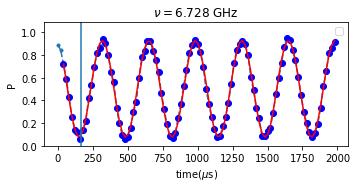

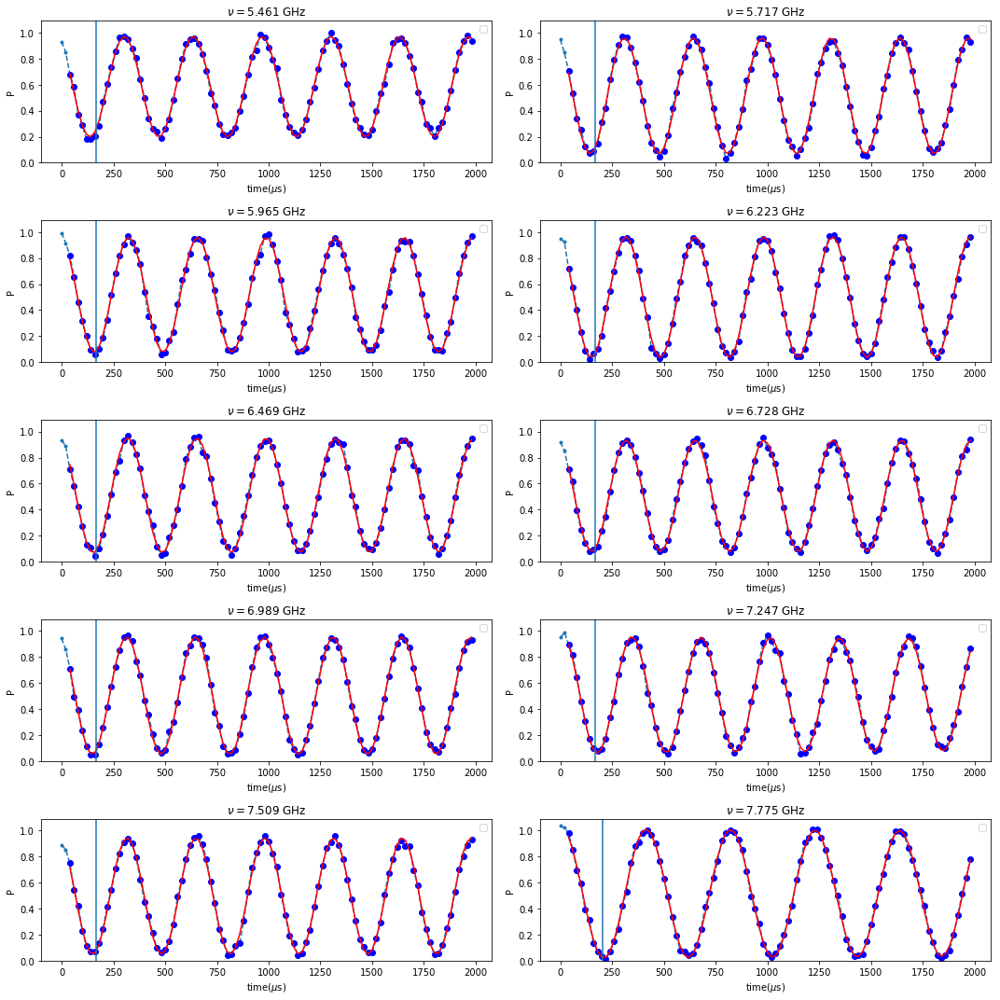

In [13]:
expt_name = 'sideband_chi_ge_calibration'

filelist = [0]
chiges = []
gs = []

show = 'I'
fig = plt.figure(figsize=(12,5))
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        y = P
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]

        ax  = fig.add_subplot(2,2,ii+1,title="$\\nu = $"+ str(around(nu_c,3))+ " GHz")
        ax.plot(t,P,'.--')

        ax.set_xlabel('time($\\mu$s)')
        ax.set_ylabel('P')
        ylim(0,1.09)

        ax.legend()

        p = fitdecaysin(t[2:],y[2:],showfit=True)

        offset = ramsey_freq - p[1]

        suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][expt_cfg['mode_index']] + offset)/2.0
        print("Offset freq =", offset * 1e3, "MHz")
        print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
#             print("T2 =", p[3], "ns")
        axvline(1/p[1]/2)
        print (1/p[1]/2)
        chige = suggested_chi_shift
        chiges.append(chige)
        gs.append(gfromchi(chige,alpha,deltas[ii]))

expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [0]
chiges = []
gs = []

show = 'I'
fig = plt.figure(figsize=(15,15))
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']
        print(ramsey_freq)

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time($\\mu$s)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chige = suggested_chi_shift
            chiges.append(chige)
            gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


### running again for longer to get more precise chi

0.0003
{'stop': 20000.0, 'step': 200.0, 'singleshot': False, 'start': 0.0, 'ramsey_freq': 0.0003, 'acquisition_num': 500, 'on_qubits': ['1'], 'pi_calibration': True, 'test_parity': False, 'mode_index': 6, 'add_photon_with_sideband': False, 'add_photon_with_blockade': True}


Offset freq = 0.002339903806381372 MHz
Suggested ge chi shift = 2 pi x -1.1963425950886009 MHz
1679.7683209601787


Offset freq = 0.004945194916054557 MHz
Suggested ge chi shift = 2 pi x -0.8710034274849624 MHz
1694.6004314613554


Offset freq = 0.005136625433079661 MHz
Suggested ge chi shift = 2 pi x -0.6665889312366433 MHz
1695.7005960281554


Offset freq = 0.001738282299161033 MHz
Suggested ge chi shift = 2 pi x -0.5688102776484675 MHz
1676.3800726900784


Offset freq = 0.008401015923506385 MHz
Suggested ge chi shift = 2 pi x -0.46632025571553715 MHz
1714.6836144972224


Offset freq = 0.00329217897942325 MHz
Suggested ge chi shift = 2 pi x -0.3691644350732037 MHz
1685.1594888202321
0.0003
{'stop': 20000.0, 'step': 400.0, 'singleshot': False, 'start': 0.0, 'ramsey_freq': 0.0003, 'acquisition_num': 500, 'on_qubits': ['1'], 'pi_calibration': True, 'test_parity': False, 'mode_index': 8, 'add_photon_with_sideband': False, 'add_photon_with_blockade': True}


Offset freq = 0.009311179355616532 MHz
Suggested ge chi shift = 2 pi x -0.35759350249243976 MHz
1720.0523876068805


Offset freq = 0.006707737978102837 MHz
Suggested ge chi shift = 2 pi x -0.31090301029587686 MHz
1704.7841513209446


Offset freq = 0.007462636488263317 MHz
Suggested ge chi shift = 2 pi x -0.27072466375058885 MHz
1709.1833808775675


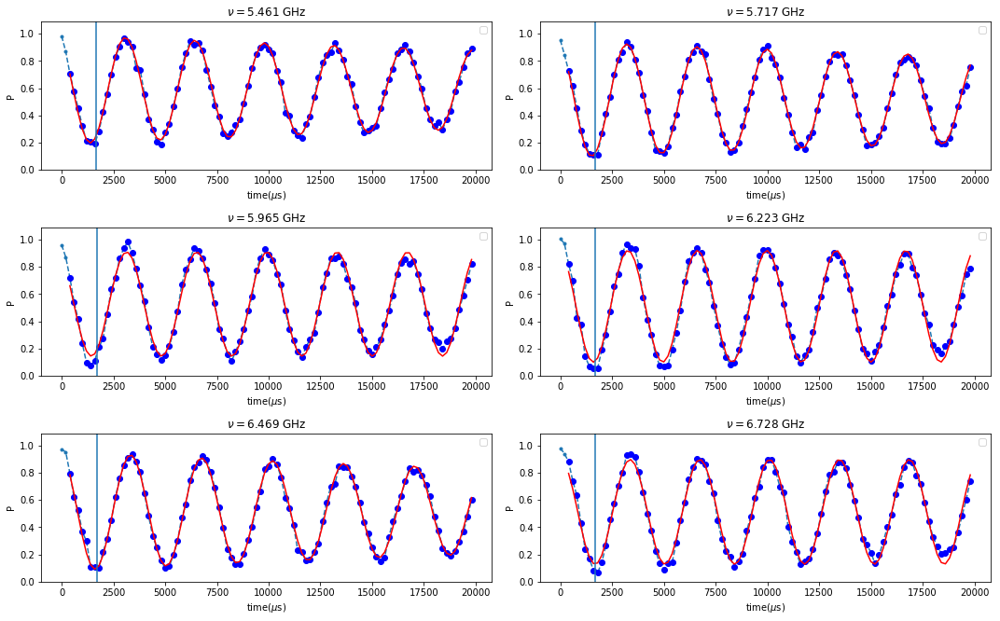

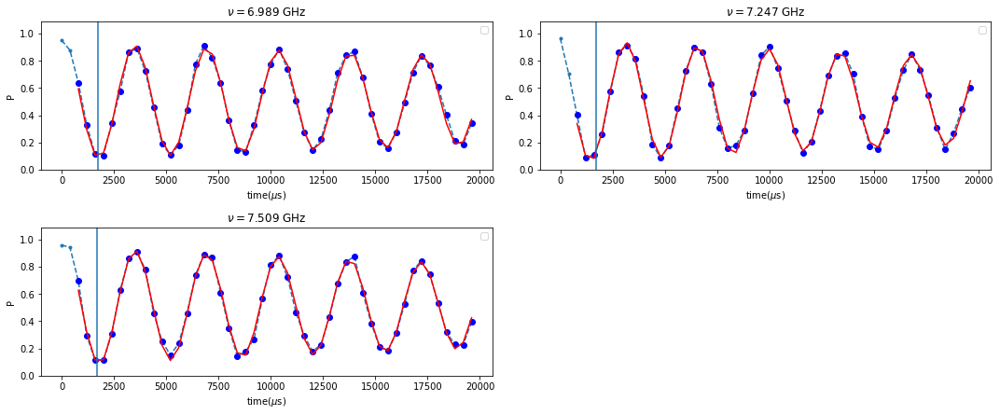

In [17]:
expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [1,3]
chiges = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        nu_cav = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']
        print(ramsey_freq)
        print(expt_cfg)

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time($\\mu$s)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chige = suggested_chi_shift
            chiges.append(chige)
            gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


No handles with labels found to put in legend.


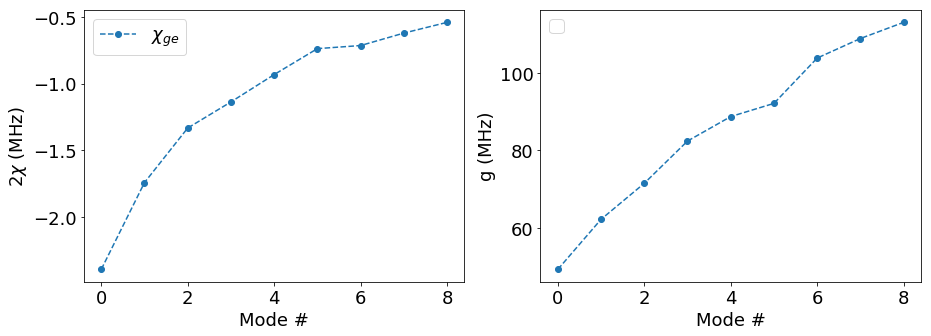

In [283]:
chi_n = array(chiges)
delta_n = nu_q-array(nu_cav[:len(chi_n)])
fig = plt.figure(figsize = (15,5))
ax1 = fig.add_subplot(121)

ax1.plot(np.arange(len(chi_n)), 2*chi_n*1e3,'o--',label = "$\chi_{ge}$")
ax1.set_xlabel('Mode #')
ax1.set_ylabel('$2\chi$ (MHz)')
ax1.legend()

alpha_o = -0.22158557228128942
alpha_n = alpha

# g_n = sqrt(chi_n*delta_n*(delta_n+alpha_n)/alpha_o)*1e3
g_n = array([gfromchi(chi,alpha,delta_n[ii])*1e3 for ii,chi in enumerate(chi_n)])

ax2 = fig.add_subplot(122)

ax2.plot(np.arange(len(chi_n)), g_n,'o--')

ax2.set_xlabel('Mode #')
ax2.set_ylabel('g (MHz)')

ax2.legend()


## rerun after getting Kappas and updating cavity reqs 3/21

{'stop': 20000.0, 'step': 400.0, 'singleshot': False, 'start': 0.0, 'ramsey_freq': 0.0003, 'acquisition_num': 500, 'on_qubits': ['1'], 'pi_calibration': True, 'test_parity': False, 'mode_index': 8, 'add_photon_with_sideband': False, 'add_photon_with_blockade': True}


Offset freq = 0.0049283499959794815 MHz
Suggested ge chi shift = 2 pi x -1.1938784200906112 MHz
1694.503690860126


Offset freq = 0.005734023932976718 MHz
Suggested ge chi shift = 2 pi x -0.8681364155184741 MHz
1699.1430904880349


Offset freq = 0.006083355725135806 MHz
Suggested ge chi shift = 2 pi x -0.6635472533740754 MHz
1701.1625906167171


Offset freq = 0.005873078354568699 MHz
Suggested ge chi shift = 2 pi x -0.5658737384711832 MHz
1699.9463945797788


Offset freq = 0.0012017864756008897 MHz
Suggested ge chi shift = 2 pi x -0.4657193624777367 MHz
1673.370111897176


Offset freq = 0.0017151176468691953 MHz
Suggested ge chi shift = 2 pi x -0.36830687624976916 MHz
1676.2498858660379


Offset freq = 0.0035782115271543115 MHz
Suggested ge chi shift = 2 pi x -0.3558043967288626 MHz
1686.785585418609


Offset freq = 0.0015491575067406093 MHz
Suggested ge chi shift = 2 pi x -0.3101284315425065 MHz
1675.3177703336278


Offset freq = 0.0020495158270328415 MHz
Suggested ge chi shift = 2 pi x -0.26969990583707243 MHz
1678.1311880994913


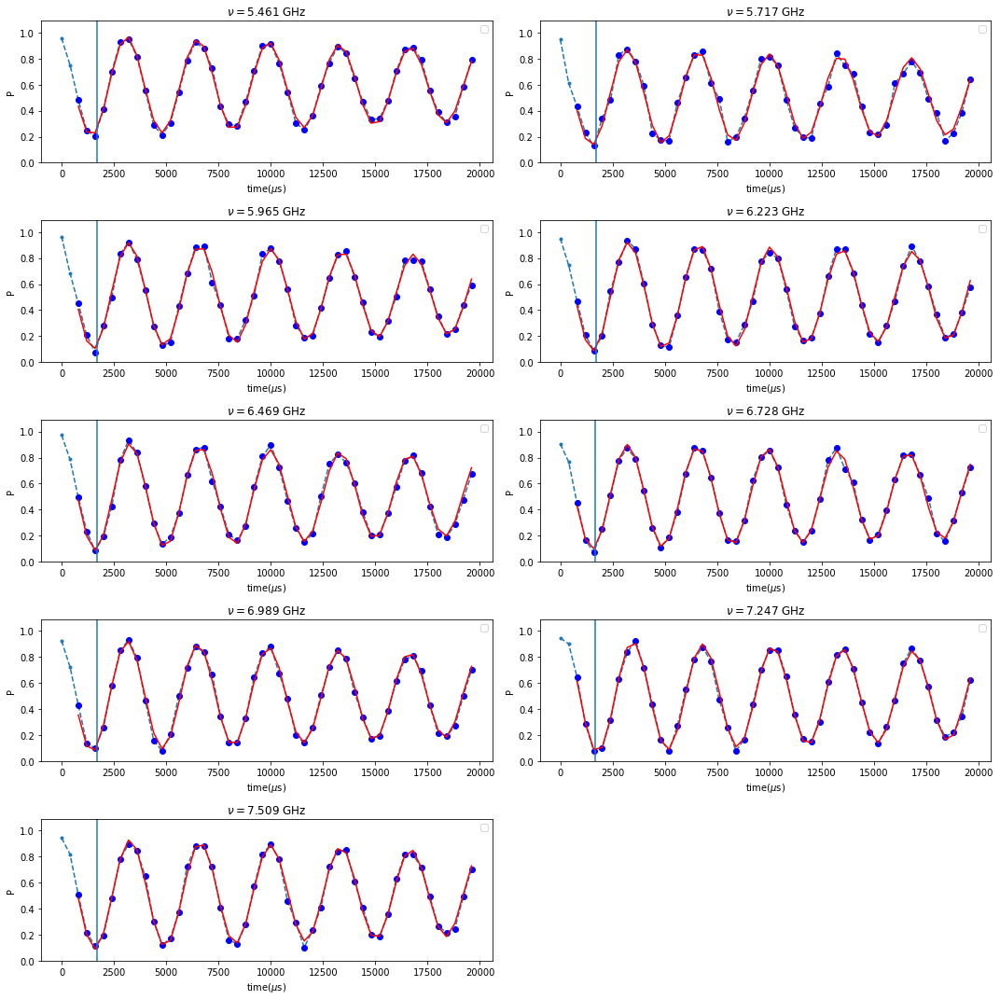

In [22]:
expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [4]
chiges = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']
        print(expt_cfg)

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time($\\mu$s)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chige = suggested_chi_shift
            chiges.append(chige)
            gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


## Remeasuring 7/13/20

ramsey freq: 0.0003


Offset freq = 0.00420203372521839 MHz
Suggested ge chi shift = 2 pi x -1.1941002638700173 MHz
1690.342926616084


Offset freq = -0.0017977203035294924 MHz
Suggested ge chi shift = 2 pi x -0.8684565885143092 MHz
1656.738823265898


Offset freq = 0.007218471886075487 MHz
Suggested ge chi shift = 2 pi x -0.6643789924449953 MHz
1707.7580106264236


Offset freq = 0.002993206845281263 MHz
Suggested ge chi shift = 2 pi x -0.5664070448125317 MHz
1683.4631783641958


Offset freq = 0.004215783719251401 MHz
Suggested ge chi shift = 2 pi x -0.4656275967404706 MHz
1690.421504862912


Offset freq = 0.0064261830483859335 MHz
Suggested ge chi shift = 2 pi x -0.3685520399550795 MHz
1703.1491608885833


Offset freq = 0.00467207412284626 MHz
Suggested ge chi shift = 2 pi x -0.3564964105507114 MHz
1693.0332562183194


Offset freq = 0.0045715050723916595 MHz
Suggested ge chi shift = 2 pi x -0.3103951203299943 MHz
1692.4569179507205


Offset freq = 0.002435538962066179 MHz
Suggested ge chi shift = 2 pi x -0.27015191260422544 MHz
1680.308186857904


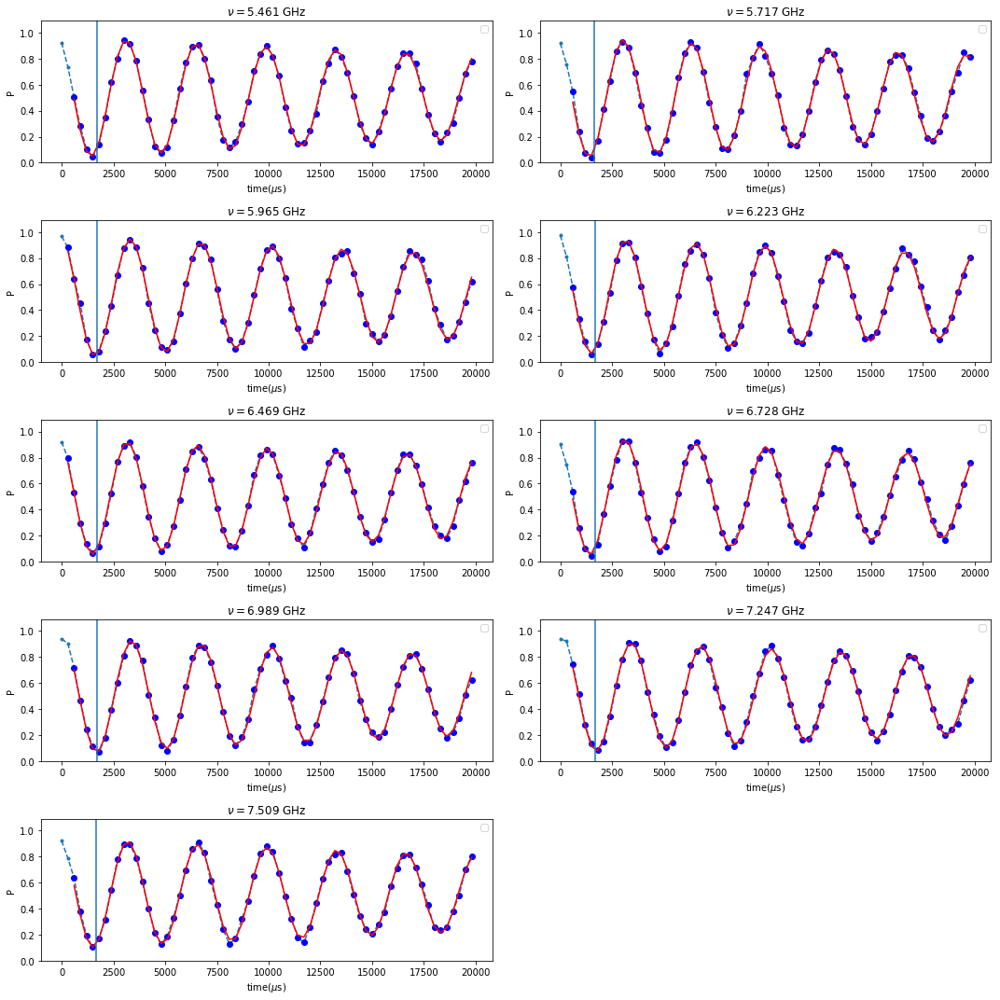

In [24]:
expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [15]
chiges = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']
        print("ramsey freq:", ramsey_freq)

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time($\\mu$s)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()
            if pp == 2 or pp == 4:
                p = fitdecaysin(t[1:],y[1:],showfit=True)
            else:
                p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][
                modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chige = suggested_chi_shift
            chiges.append(chige)
            gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


# Kappa

## get conversion factors between amps and alphas

cavity pulse type square
0.5
[1.24789151]


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


0.009075574634515282
cavity pulse type square
0.5
[1.12553455]
0.007503563644142225
cavity pulse type square
0.5
[0.784524]
0.004482994293726757
cavity pulse type square
0.7
[0.99182961]
0.009445996325348338
cavity pulse type square
0.7
[0.94688924]
0.005410795657316337
cavity pulse type square
0.7
[1.40575285]
0.008032873426776065
cavity pulse type square
0.7
[0.71787546]
0.002734763653662903
cavity pulse type square
0.7
[1.13281561]
0.0035962400300476164
cavity pulse type square
0.5
[0.63222039]
0.0056197368082039545
[1.2644407818458898, 1.4168994488022508, 2.4957830244917023, 2.2510690932426676, 1.3526989143290842, 2.0082183566940164, 1.569048002804365, 1.0255363701235887, 1.6183080135214274, 1.0]
[225 150 275 300 250 250 350 375 450]
[0 1 2 3 4 5 6 7 8]


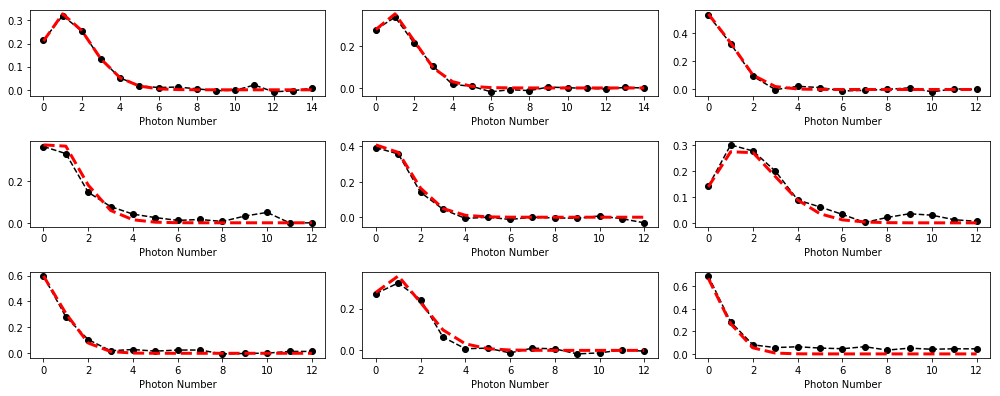

In [4]:
expt_name = 'photon_number_distribution_measurement'
# filelist = [2,4,5,6,7,8,9,10,12]
# filelist = [4,381,382,383]
filelist = [384,383,5,6,7,8,9,10,12]
titles = ['qubit in g']
shows = ['I']

import math
import scipy.special
from scipy.optimize import curve_fit
def coherent_state(n, alpha):
    return exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)

def line(x, m, b):
    return m*x+b

def proportional(x, m):
    return m * x

scs = []
amps = []
amp_to_alpha_scales = [1.0] * 10
lengths = []
modes = []
fig = plt.figure(figsize=(14,7))
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        #swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['photon_number_distribution_measurement']
        print ("cavity pulse type", expt_cfg['cavity_pulse_type'])
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        chis = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        I,Q = array(a['I']),array(a['Q'])
        #cav_lens = arange(swp_cfg['start_len'],swp_cfg['stop_len'],swp_cfg['len_step'])
        cav_len = expt_cfg['prep_cav_len']
        fit_alphas = []
        amps.append(expt_cfg['prep_cav_amp'])
        print(expt_cfg['prep_cav_amp'])
        f = arange(expt_cfg['N_max'])
        I = [I]
        for kk,k in enumerate(I):
            popt, pcov = curve_fit(coherent_state, f, k)
            print(popt)
            fit_alphas.append(popt[0])
            ax=fig.add_subplot(4,3,ii+1)
            ax.plot(f,k,'ko--')
            ax.plot(f, coherent_state(f, popt), 'r--', linewidth=3)
            ax.set_xlabel('Photon Number')
            plt.tight_layout()
      
#         ax = fig.add_subplot(len(I),2,len(I)/2+1)
# #         amps = amps[1:-4]
# #         fit_alphas = fit_alphas[1:-4]
#         ax.plot(cav_lens, fit_alphas,'bo',markersize = 7.5)
#         popt, pcov = curve_fit(line, cav_lens, fit_alphas)
#         print("linear fit: ", popt)
#         ax.plot(cav_lens, line(cav_lens, *popt))

#         popt, pcov = curve_fit(proportional, cav_lens, fit_alphas)
#         print("proportional fit: ", popt)
#         ax.plot(cav_lens, proportional(cav_lens, popt))
#         ax.set_xlabel("prep cav len (ns)")
#         ax.set_ylabel("alpha")
#         scs.append(popt[0])
        amp_to_alpha_scales[expt_cfg['mode_index']] = fit_alphas[-1]/expt_cfg['prep_cav_amp']
        print(fit_alphas[-1]/expt_cfg['prep_cav_amp']/expt_cfg['prep_cav_len'])
        lengths.append(expt_cfg['prep_cav_len'])
        modes.append(expt_cfg['mode_index'])
        
print(amp_to_alpha_scales)
indices = np.argsort(modes)
modes = array(modes)[indices]
lengths = array(lengths)[indices]
print(lengths)
print(modes)
# fig=plt.figure(figsize = (10,4))
# ax=fig.add_subplot(111)
# print(amps)
# popt, pcov = curve_fit(proportional, amps,scs)
# print("Converstion from xi to a = ", popt[0],"GHz")
# ax.plot(amps, proportional(amps, popt),label  = '$\\xi = $'+str(around(popt[0],6))+' a (GHz)')
# popt, pcov = curve_fit(line, amps,scs)
# print("linear fit: ", popt)
# ax.loglog(amps[:-1],scs[:-1],'bo',markersize = 10)
# ax.loglog(amps[-1],scs[-1],'ro',markersize = 10)
# ax.axvline(2/256)
# ax.axvline(4/256)
# ax.axvline(6/256)
# #ax.axvline(0.022, color='r')
# ax.legend()
# ax.set_ylabel('Scale ($\\alpha$ / prep cav len)')
# ax.set_xlabel('amplitude')

## cavity drive ramsey data

0.9 250 5


No handles with labels found to put in legend.


Original cavity frequency choice = 6.72751318148388 GHz
Oscillation freq =  0.49390775003639975  MHz
Offset freq = 0.006092249963600249 MHz
Suggested cavity frequency choice = 6.727519273733843 GHz
T2* = -21128956049.458904 us
0.9 200 3


No handles with labels found to put in legend.


Original cavity frequency choice = 6.22319525267382 GHz
Oscillation freq =  0.4962526207747238  MHz
Offset freq = 0.0037473792252761817 MHz
Suggested cavity frequency choice = 6.223199000053046 GHz
T2* = -28164913602.004997 us
0.9 150 2


No handles with labels found to put in legend.


Original cavity frequency choice = 5.965216687802104 GHz
Oscillation freq =  0.4942503994599889  MHz
Offset freq = 0.005749600540011113 MHz
Suggested cavity frequency choice = 5.965222437402644 GHz
T2* = -58864545.79853662 us
0.9 350 6


No handles with labels found to put in legend.


Original cavity frequency choice = 6.989432062044746 GHz
Oscillation freq =  0.4963961569279295  MHz
Offset freq = 0.0036038430720705117 MHz
Suggested cavity frequency choice = 6.989435665887818 GHz
T2* = -285259191045.54974 us
0.9 150 1


No handles with labels found to put in legend.


Original cavity frequency choice = 5.716667008365227 GHz
Oscillation freq =  0.4983498185706199  MHz
Offset freq = 0.0016501814293801154 MHz
Suggested cavity frequency choice = 5.716668658546657 GHz
T2* = -31931917.23311626 us
0.9 250 0


No handles with labels found to put in legend.


Original cavity frequency choice = 5.460828876273256 GHz
Oscillation freq =  0.5022615676809593  MHz
Offset freq = -0.002261567680959309 MHz
Suggested cavity frequency choice = 5.460826614705575 GHz
T2* = -77831409.16117314 us
0.9 250 4


No handles with labels found to put in legend.


Original cavity frequency choice = 6.469133497796497 GHz
Oscillation freq =  0.49719583440619225  MHz
Offset freq = 0.0028041655938077503 MHz
Suggested cavity frequency choice = 6.469136301962091 GHz
T2* = -25419854.05606314 us
0.9 350 7


No handles with labels found to put in legend.


Original cavity frequency choice = 7.247044714383068 GHz
Oscillation freq =  0.4982860018336822  MHz
Offset freq = 0.0017139981663177872 MHz
Suggested cavity frequency choice = 7.247046428381235 GHz
T2* = -9498175326977.424 us
0.9 450 8


No handles with labels found to put in legend.


Original cavity frequency choice = 7.509036487741198 GHz
Oscillation freq =  0.4940823572652756  MHz
Offset freq = 0.005917642734724393 MHz
Suggested cavity frequency choice = 7.509042405383933 GHz
T2* = -44553318.58313018 us


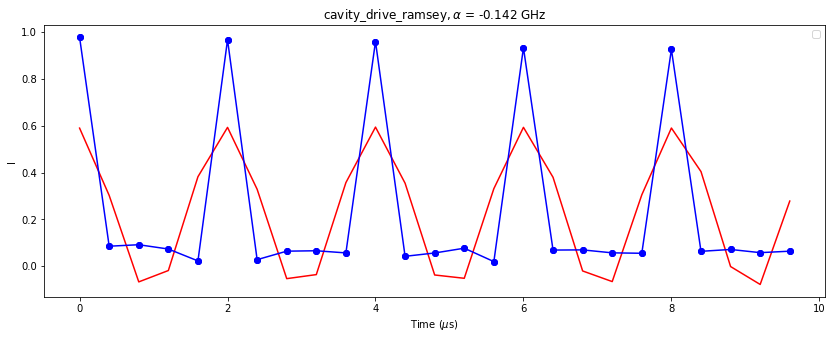

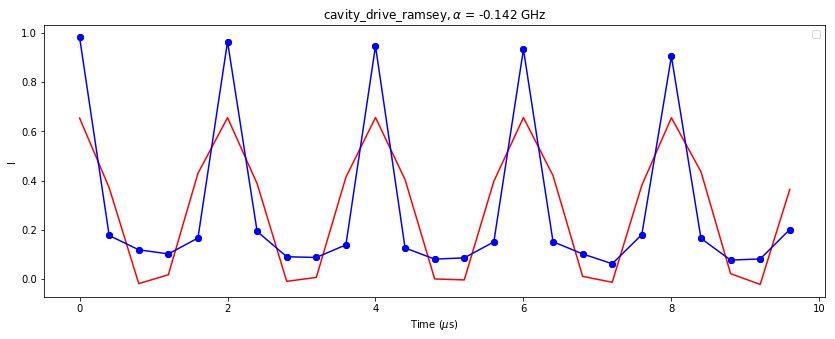

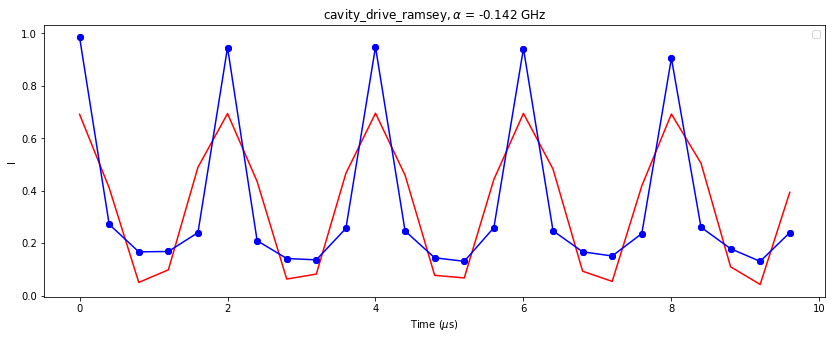

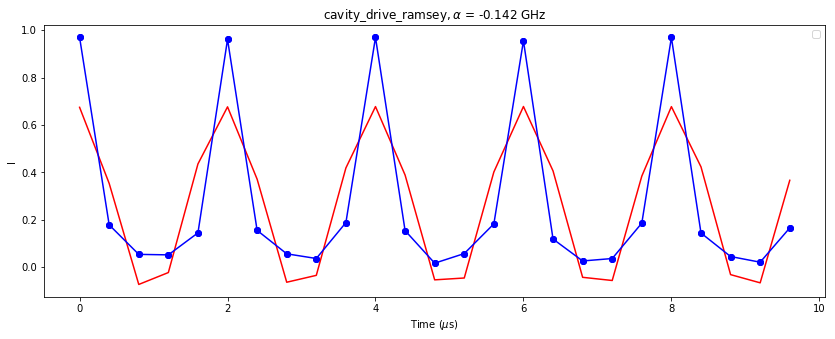

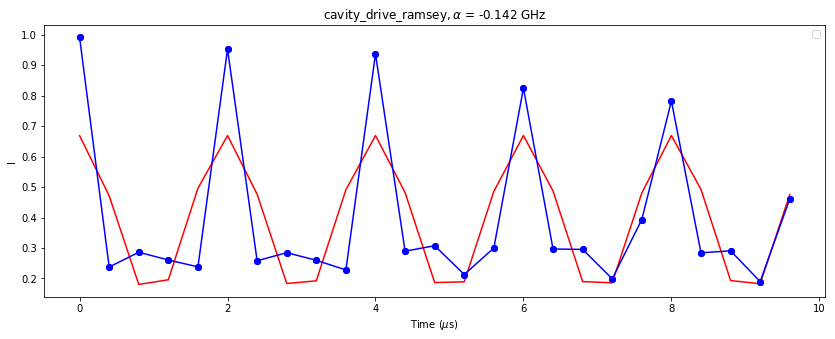

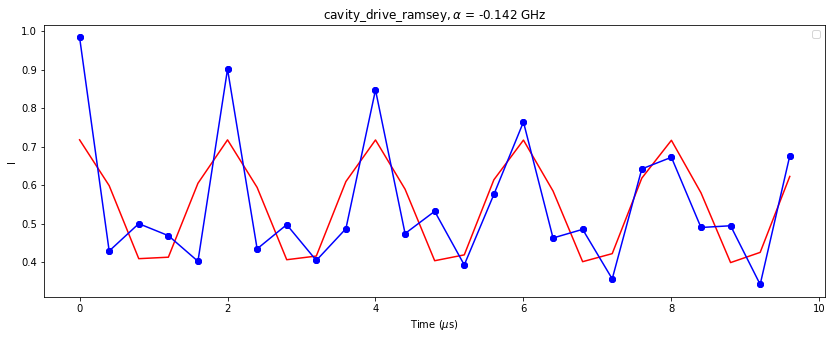

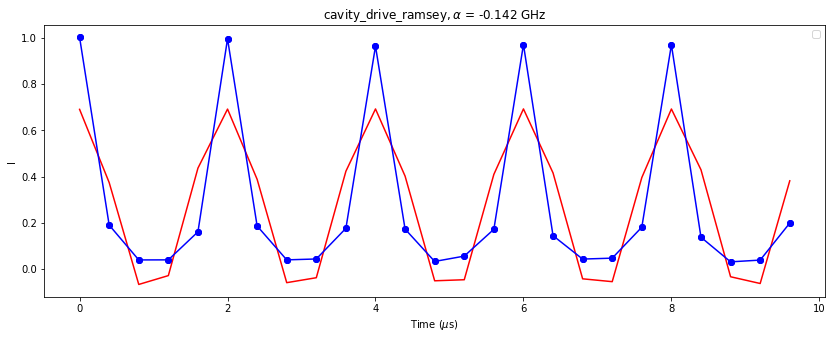

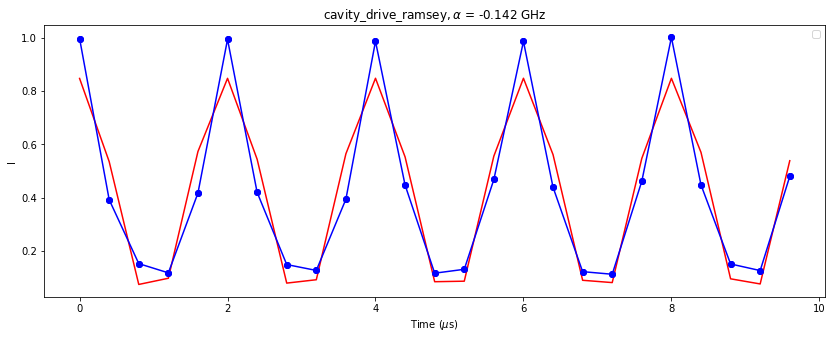

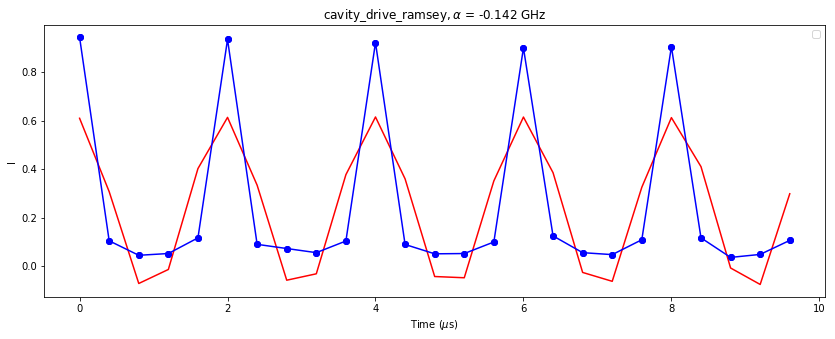

In [97]:
expt_name = 'cavity_drive_ramsey'
filelist = [1,6,8,10,12,16,15,17,18]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_amp'], expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(P))]/1e3
 
        fig = plt.figure(figsize=(14,5))
        ax = fig.add_subplot(111,title= expt_name+ '$, \\alpha$ = '+ str(around(alpha,3)) + ' GHz')
        
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(show)
        ax.legend()


        p = fitdecaysin(t[1:],P[1:],fitparams = None,showfit=False)
        p = fitdecaysin(t[:],P[:],fitparams = p,showfit=True)
        ax.plot(t,P,'bo-',label = show)
        
        offset = ramsey_freq - p[1]
        alpha_new = nu_c + offset*1e-3
        
        print("Original cavity frequency choice =",nu_c,"GHz")
        print ("Oscillation freq = ",p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested cavity frequency choice =",alpha_new,"GHz")
        print("T2* =",p[3],"us")
        print("=====================================================")
        
        

### mode 5

250


49
500


39


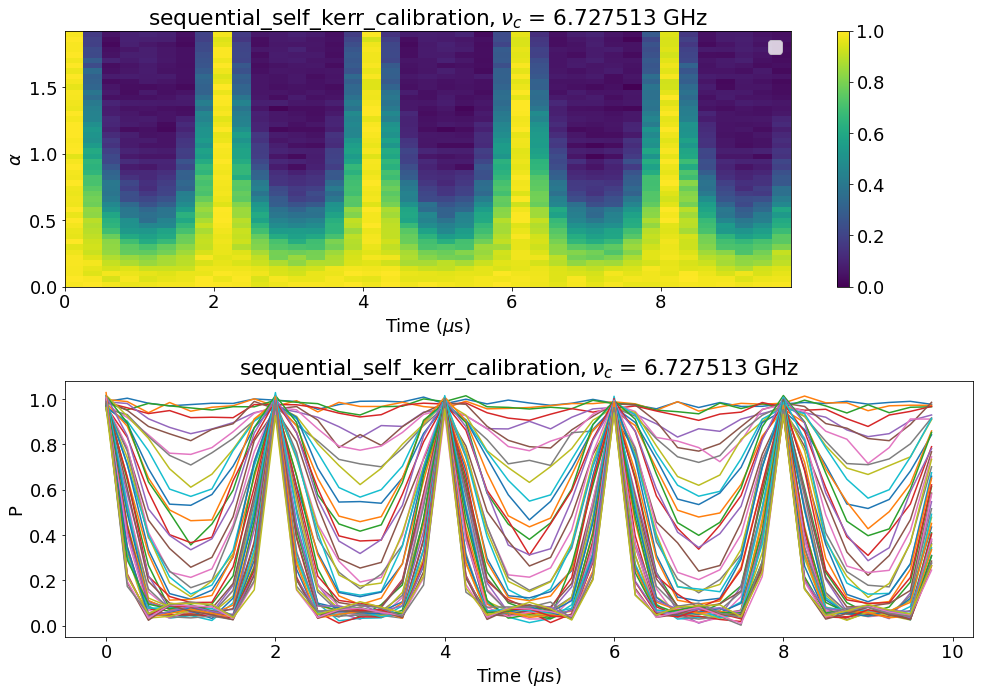

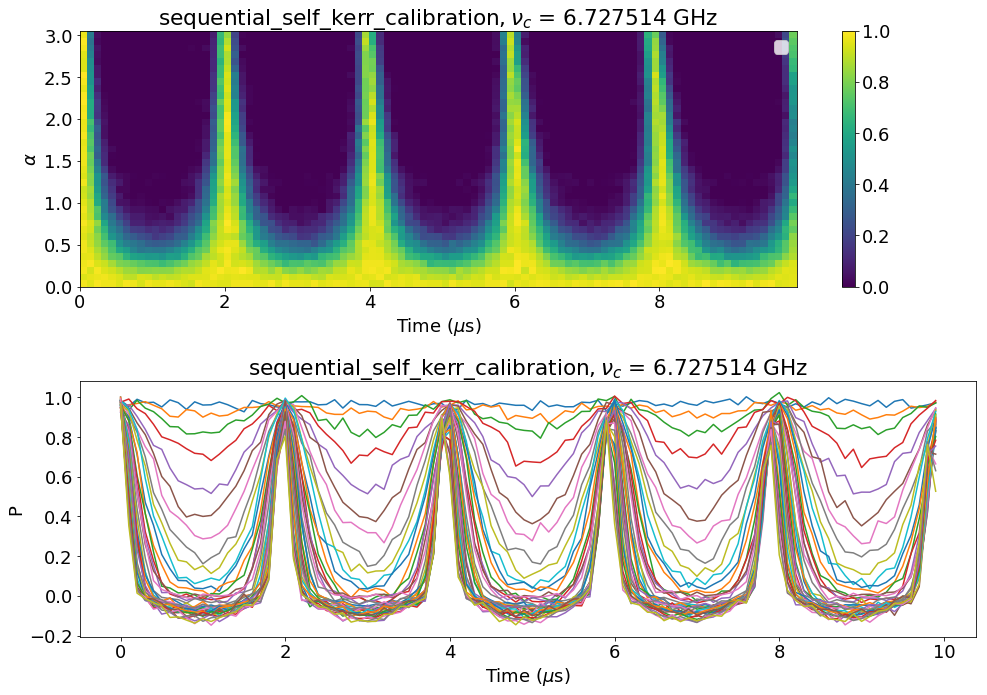

In [45]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [0,15]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

40
49
0.0021
0.00212
0.00214
0.00216
0.00218
0.0022
0.00222
0.0022400000000000002
0.0022600000000000003
0.0022800000000000003
0.0023000000000000004
70.43602951213111
best K fit:  0.0014000000000000004
best offset fit:  0.00218


No handles with labels found to put in legend.


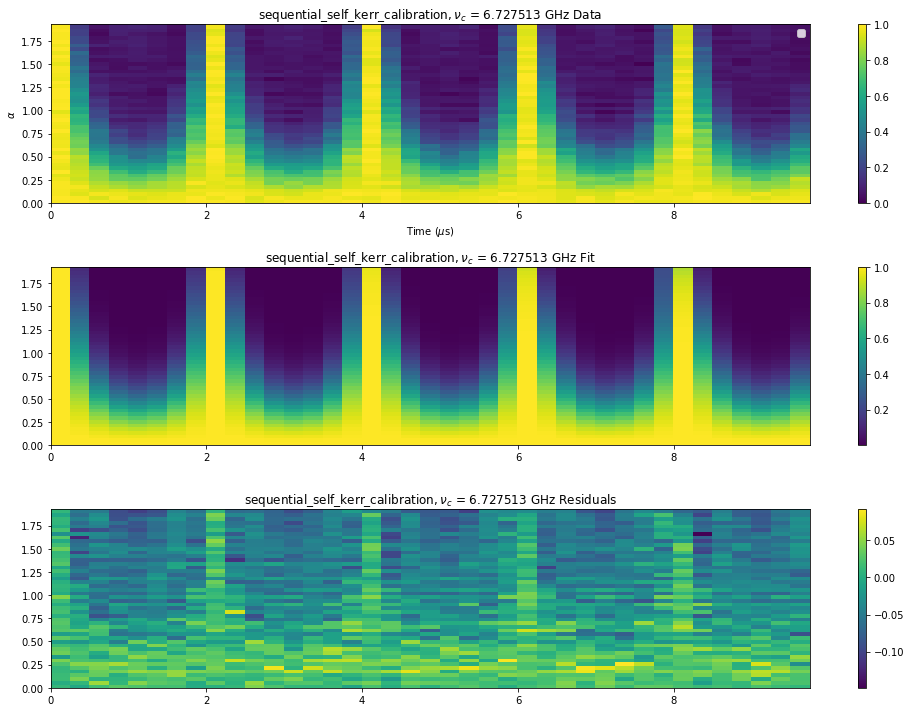

In [139]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [0]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']]

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

K = 2*pi*0.00209
Klist = np.arange(1.3e-3, 1.5e-3, 0.02e-3)*2*np.pi
offset_list = np.arange(2.1e-3, 2.3e-3, 0.02e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [140]:
best_offset/1e3 + nu_c

6.72751536148388

### mode 1

150


No handles with labels found to put in legend.


33


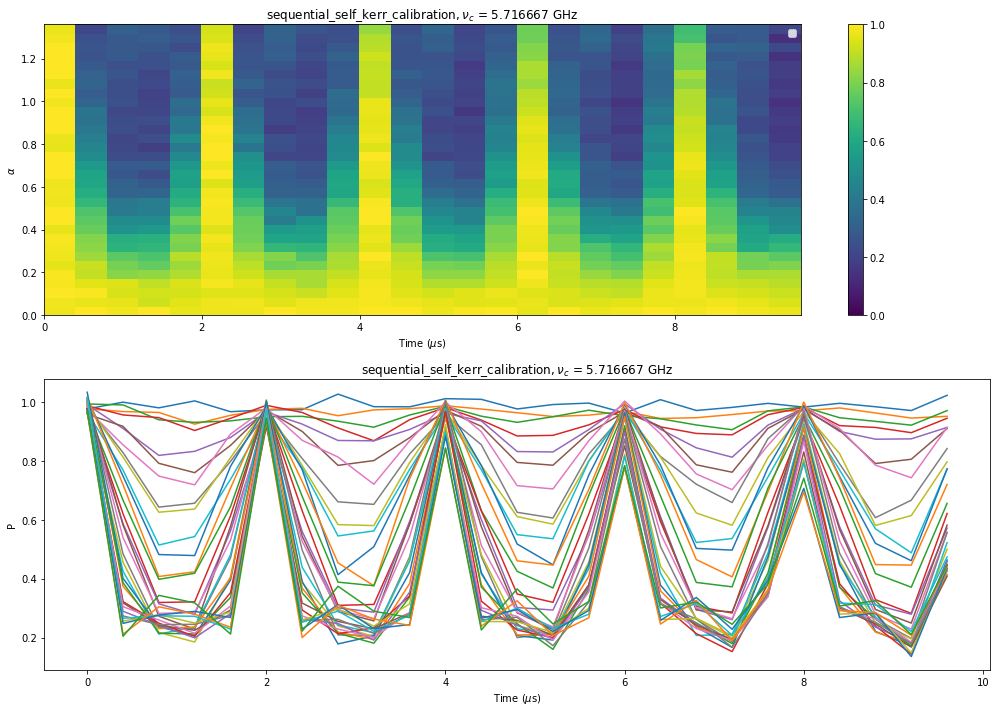

In [4]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [4]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']]
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

25
33
0.00601
0.006019999999999999
0.006029999999999999
0.0060399999999999985
0.006049999999999998
0.006059999999999998
0.006069999999999997
0.006079999999999997
0.0060899999999999965
0.006099999999999996
0.006109999999999996
0.006119999999999995
0.006129999999999995
0.006139999999999994
0.006149999999999994
0.006159999999999994
0.006169999999999993
0.006179999999999993
0.006189999999999992
0.006199999999999992
0.006209999999999992
58.91209375701615
best K fit:  0.009019999999999995
best offset fit:  0.006129999999999995


No handles with labels found to put in legend.


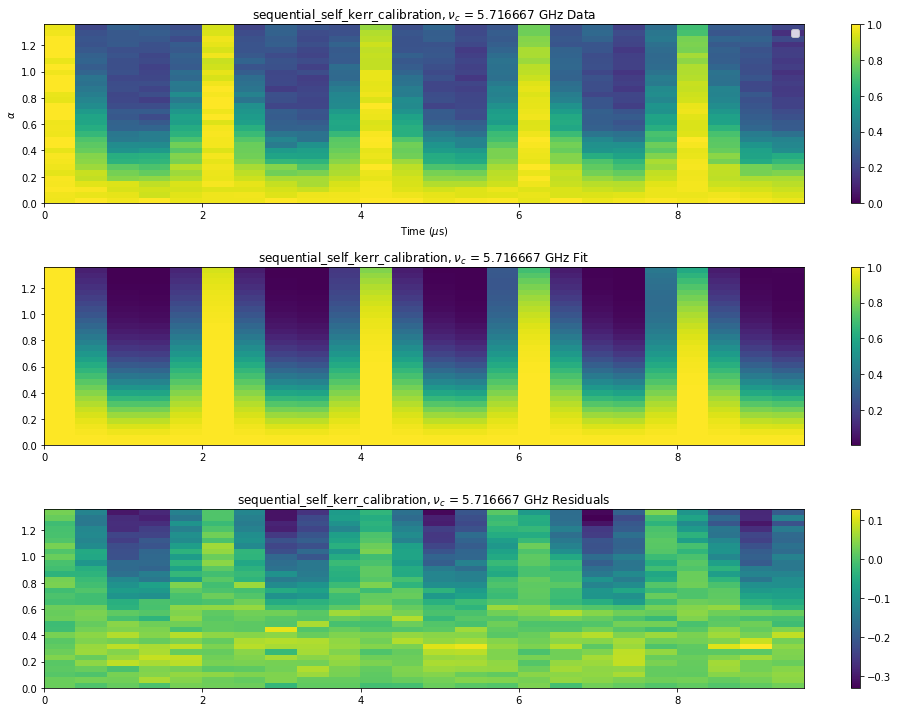

In [16]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [4]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']]

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(8.9e-3, 9.1e-3, 0.01e-3)*2*np.pi
offset_list = np.arange(6.01e-3, 6.21e-3, 0.01e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [17]:
nu_c + best_offset/1e3

5.716673138365227

### mode 2

175


No handles with labels found to put in legend.


33
275


No handles with labels found to put in legend.


45


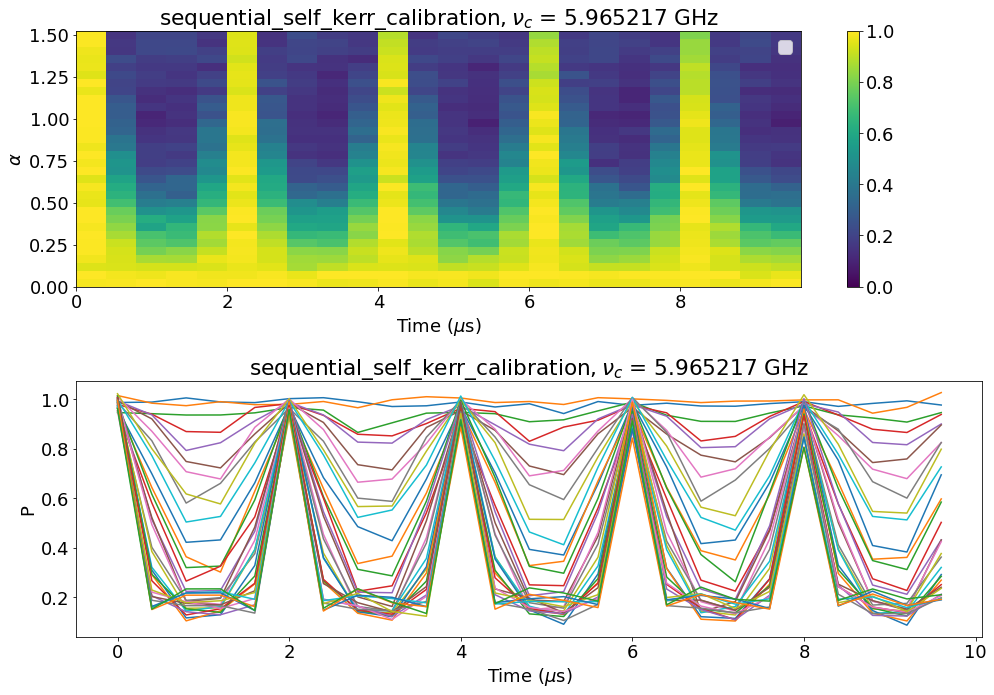

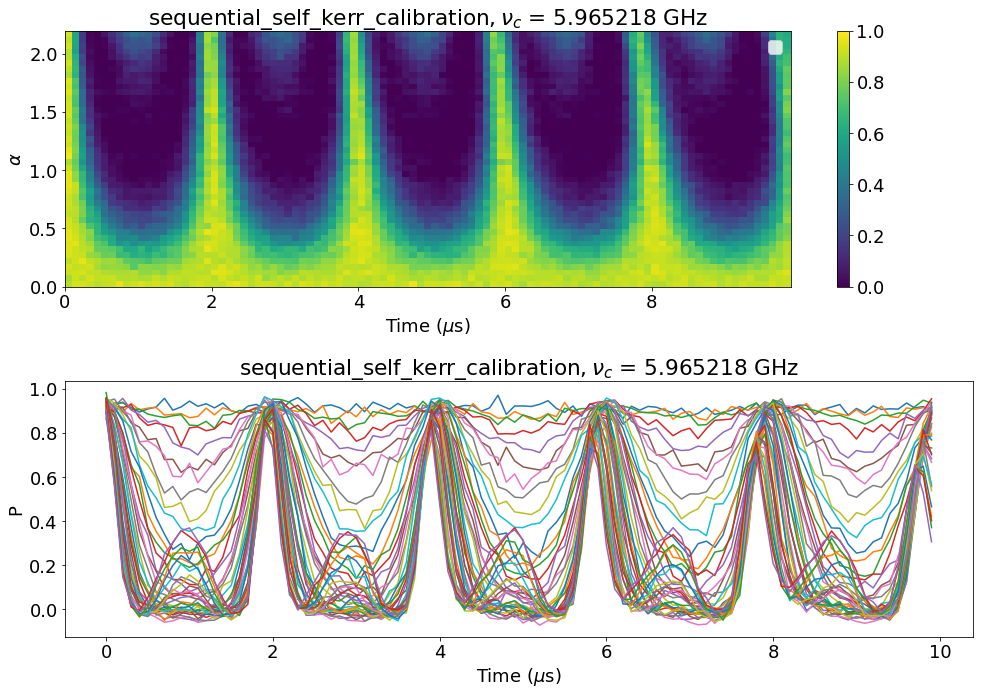

In [168]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [1,13]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

100
45
0.0044
0.0045000000000000005
0.004600000000000001
0.004700000000000001
0.004800000000000001
0.004900000000000002
0.005000000000000002
0.005100000000000002
0.005200000000000002
0.005300000000000003
0.005400000000000003
0.005500000000000003
0.005600000000000003
315.05971910813
best K fit:  0.004500000000000001
best offset fit:  0.004900000000000002


No handles with labels found to put in legend.


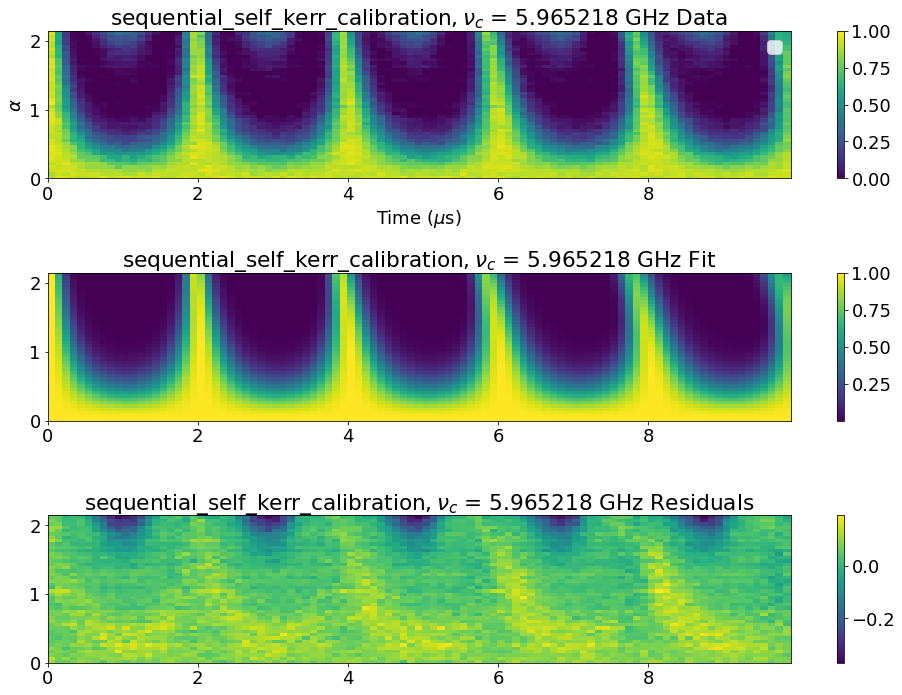

In [64]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [13]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(3.9e-3, 5.2e-3, 0.1e-3)*2*np.pi
offset_list = np.arange(4.4e-3, 5.7e-3, 0.1e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [190]:
nu_c + best_offset/1e3

5.965221617802104

### mode 3

225 square
0.5
[0.03 0.06 0.09 0.12 0.15 0.18 0.21 0.24 0.27 0.3  0.33 0.36 0.39 0.42
 0.45 0.48 0.51 0.54 0.57 0.6  0.63 0.66 0.69 0.72 0.75 0.78 0.81 0.84
 0.87 0.9  0.93 0.96 0.99]


No handles with labels found to put in legend.


33
300 square
0.5
[0.02 0.04 0.06 0.08 0.1  0.12 0.14 0.16 0.18 0.2  0.22 0.24 0.26 0.28
 0.3  0.32 0.34 0.36 0.38 0.4  0.42 0.44 0.46 0.48 0.5  0.52 0.54 0.56
 0.58 0.6  0.62 0.64 0.66 0.68 0.7  0.72 0.74 0.76 0.78 0.8  0.82 0.84
 0.86 0.88 0.9 ]


No handles with labels found to put in legend.


45


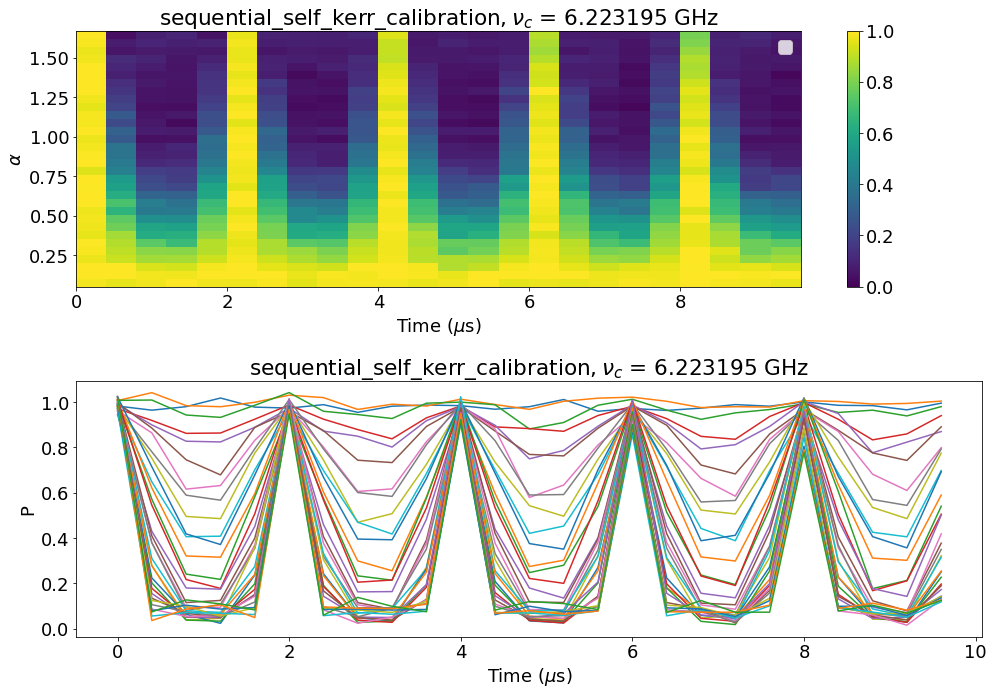

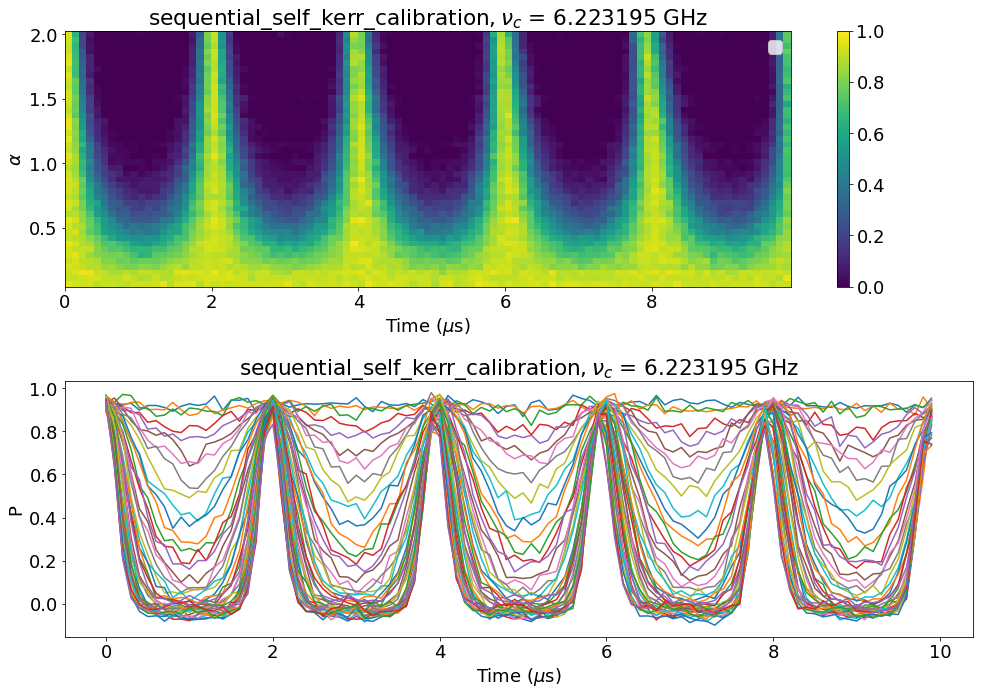

In [165]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [2,12]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'], expt_cfg['cavity_pulse_type'])
        print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[1:][:len(P)]
        print(amps)
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

100
45
0.0049
0.005
0.0051
0.005200000000000001
0.005300000000000001
0.005400000000000001
0.005500000000000001
0.005600000000000002
0.005700000000000002
0.005800000000000002
0.0059000000000000025
0.006000000000000003
0.006100000000000003
347.1280183178376
best K fit:  0.003999999999999998
best offset fit:  0.005700000000000002


No handles with labels found to put in legend.


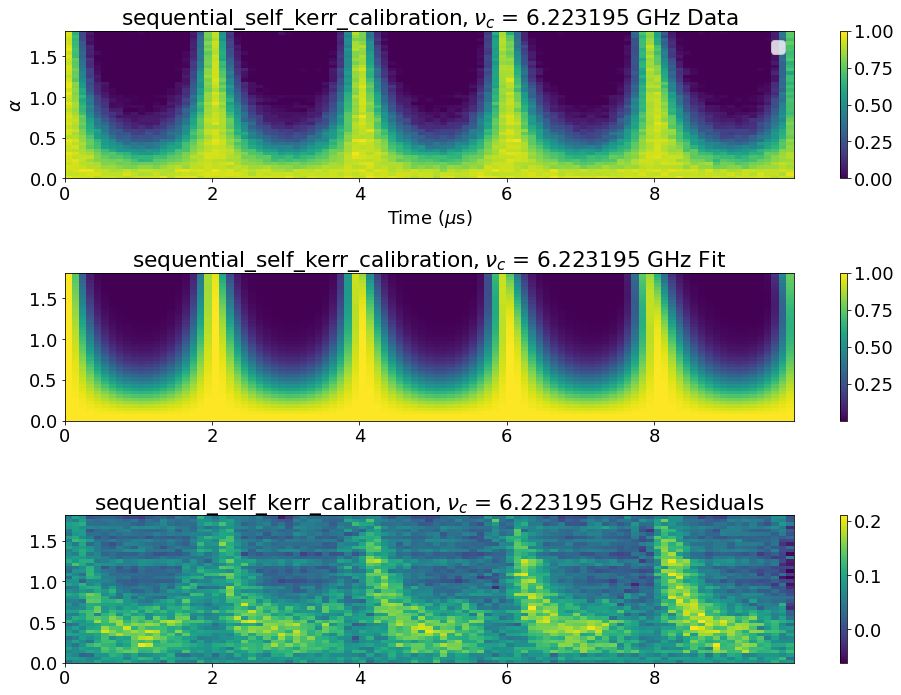

In [66]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [12]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(3.4e-3, 4.6e-3, 0.1e-3)*2*np.pi
offset_list = np.arange(4.9e-3, 6.1e-3, 0.1e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

(44, 100)
4400 4400
[[0.04502138 0.04502138 0.04502138 ... 1.9809408  1.9809408  1.9809408 ]
 [0.         0.1        0.2        ... 9.7        9.8        9.9       ]]
4e-06 5.7e-06
best K (MHz) = 0.005205322009375463 +/- 4645.001725409458
best offset (MHz) = 0.015387112323935304 +/- 2855.9413195919
================================ Higher Order Kappa fit =====================================
best K (MHz) = -0.004649059187654565 +/- 8527.811347331246
best K_2 (MHz) = -0.0034560576101037846 +/- 3949.2361564043963
best offset (MHz) = 0.008399108487729623 +/- 11320.082320374468


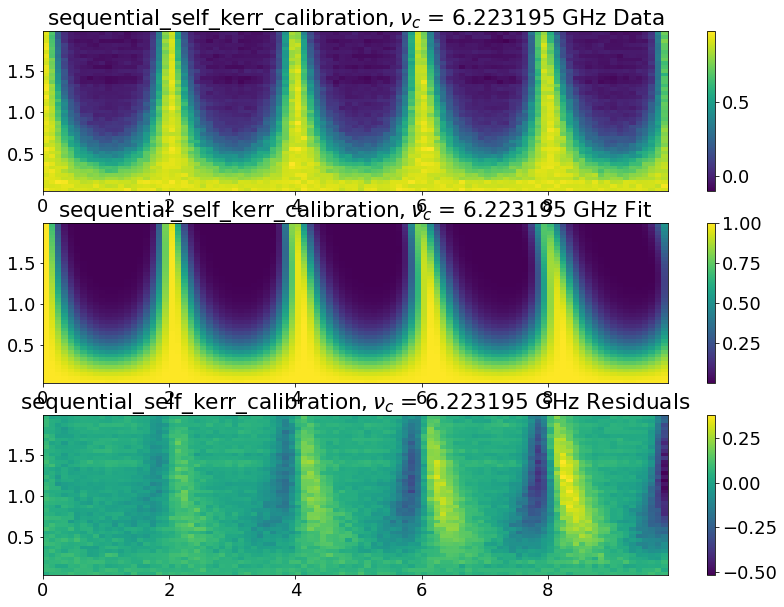

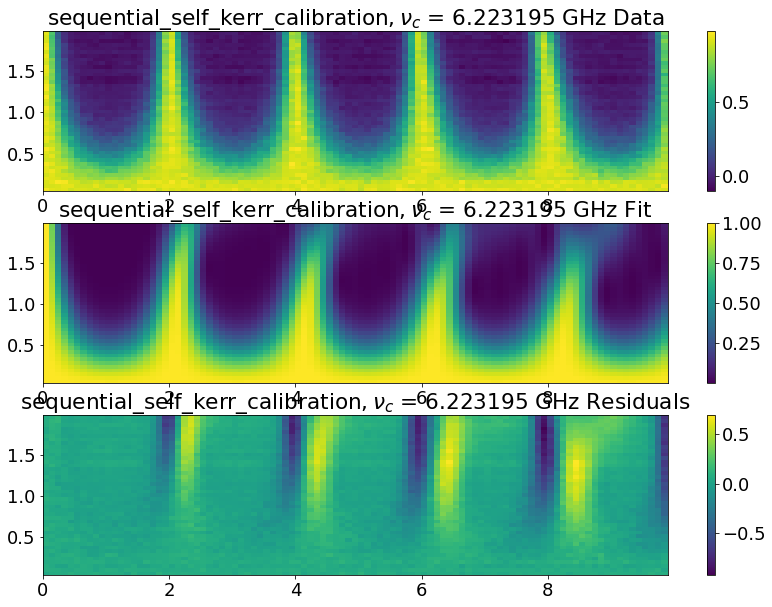

In [79]:
def self_kerr_fit_with_err(x, kappa, omega_r):
    tot = abs(exp(-x[0]**2)*(sum([x[0]**(2*n)*exp(-1j*x[1]*(omega_r*n + kappa/2*(n**2))) / \
                                   scipy.special.factorial(n) for n in arange(100)])))**2
    return tot

def self_kerr_fit_with_err_k2(x, kappa, omega_r, kappa2):
    tot = abs(exp(-x[0]**2)*(sum([x[0]**(2*n)*exp(-1j*x[1]*(omega_r*n + kappa/2*n**2 + kappa2/24*n**4)) / \
                                   scipy.special.factorial(n) for n in arange(100)])))**2
    return tot

def self_kerr_fit_with_err_k2_plot(kappa, omega_r, kappa2, alpha, t, N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2 + kappa2/24*n**4)) / \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot

def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*(n**2))) / \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


expt_name = 'sequential_self_kerr_calibration'
filelist = [12]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[1:][:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
        
        cutoff = 0
        cutoff2 = -1
        P_dat = P_dat[cutoff:cutoff2]
        alphas = alphas[cutoff:cutoff2]
        amps = amps[cutoff:cutoff2]

# print(P_dat)
# print(len(P_dat))
# print(len(P_dat[0]))
# print(len(alphas))
# print(len(t))
best_K = 4e-6 * 2 * np.pi
best_offset = 5.7e-6
print(np.array(P_dat).shape)
P_dat_1d = P_dat.flatten()
# print(P_dat_1d)
ts_alphas = []
for alpha in alphas:
    for time in t:
        ts_alphas.append([alpha, time])
print(len(P_dat_1d), len(ts_alphas))
ts_alphas = np.array(ts_alphas).T
print(ts_alphas)
print(best_K/(2*np.pi), best_offset)

# Fitting using CurveFit
popt, pcov = curve_fit(self_kerr_fit_with_err, ts_alphas, P_dat_1d, p0=[best_K, 2*np.pi*(ramsey_freq - best_offset)])
print("best K (MHz) = " + str(popt[0]/(2*np.pi)) + " +/- " + str(np.sqrt(pcov[0][0])/(2*np.pi)))
print("best offset (MHz) = " + str(-popt[1]/(2*np.pi) + ramsey_freq) + " +/- " + str(np.sqrt(pcov[1][1])/(2*np.pi)))

P_best_fit = ([[self_kerr_fit(popt[1],popt[0],alpha,tt,100) for tt in t] for alpha in alphas])
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')
pcolormesh(t,alphas,P_dat,cmap = 'viridis')
colorbar()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()
ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()


# Fitting using CurveFit and another higher order Kappa term
popt, pcov = curve_fit(self_kerr_fit_with_err_k2, ts_alphas, P_dat_1d, 
                       p0=[best_K, 2*np.pi*(ramsey_freq - best_offset), 0.0], maxfev=10000)
print("================================ Higher Order Kappa fit =====================================")
print("best K (MHz) = " + str(popt[0]/(2*np.pi)) + " +/- " + str(np.sqrt(pcov[0][0])/(2*np.pi)))
print("best K_2 (MHz) = " + str(popt[2]/(2*np.pi)) + " +/- " + str(np.sqrt(pcov[2][2])/(2*np.pi)))
print("best offset (MHz) = " + str(-popt[1]/(2*np.pi) + ramsey_freq) + " +/- " + str(np.sqrt(pcov[1][1])/(2*np.pi)))

P_best_fit = ([[self_kerr_fit_with_err_k2_plot(popt[0],popt[1],popt[2],alpha,tt,100) for tt in t] for alpha in alphas])
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')
pcolormesh(t,alphas,P_dat,cmap = 'viridis')
colorbar()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()
ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

No handles with labels found to put in legend.


Original cavity frequency choice = 6.223194636516004 GHz
Oscillation freq =  0.4963673093963037  MHz
Offset freq = 0.003632690603696309 MHz
Suggested cavity frequency choice = 6.223198269206607 GHz
T2* = 960907321895.7943 us


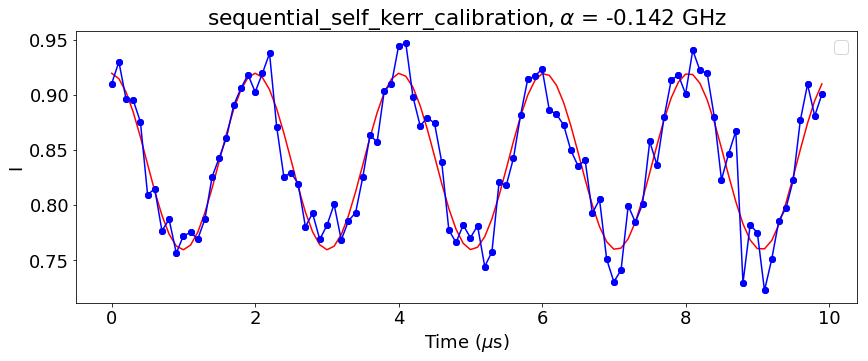

In [203]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [12]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[1:][:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,5))
        ax = fig.add_subplot(111,title= expt_name+ '$, \\alpha$ = '+ str(around(alpha,3)) + ' GHz')
        
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(show)
        ax.legend()
    
        P = P_dat[4]
        p = fitdecaysin(t[1:],P[1:],fitparams = None,showfit=False)
        p = fitdecaysin(t[:],P[:],fitparams = p,showfit=True)
        ax.plot(t,P,'bo-',label = show)
        
        offset = ramsey_freq - p[1]
        alpha_new = nu_c + offset*1e-3
        
        print("Original cavity frequency choice =",nu_c,"GHz")
        print ("Oscillation freq = ",p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested cavity frequency choice =",alpha_new,"GHz")
        print("T2* =",p[3],"us")
        print("=====================================================")
        
        

In [157]:
nu_c + best_offset/1e3

6.22319950267382

### mode 4

250 4


33
500 4


45


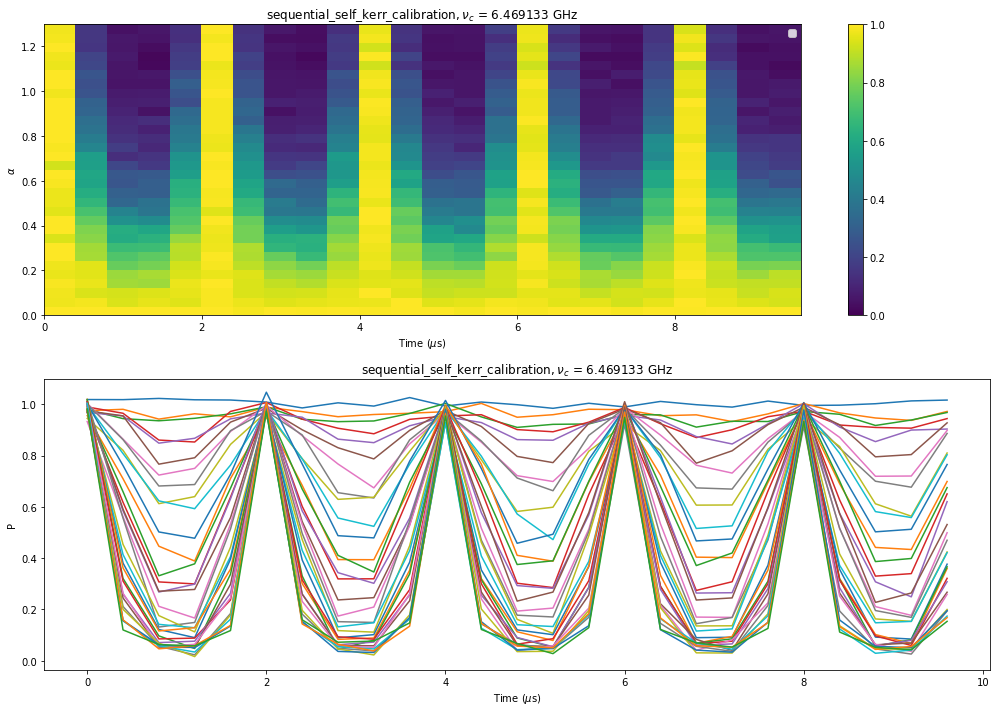

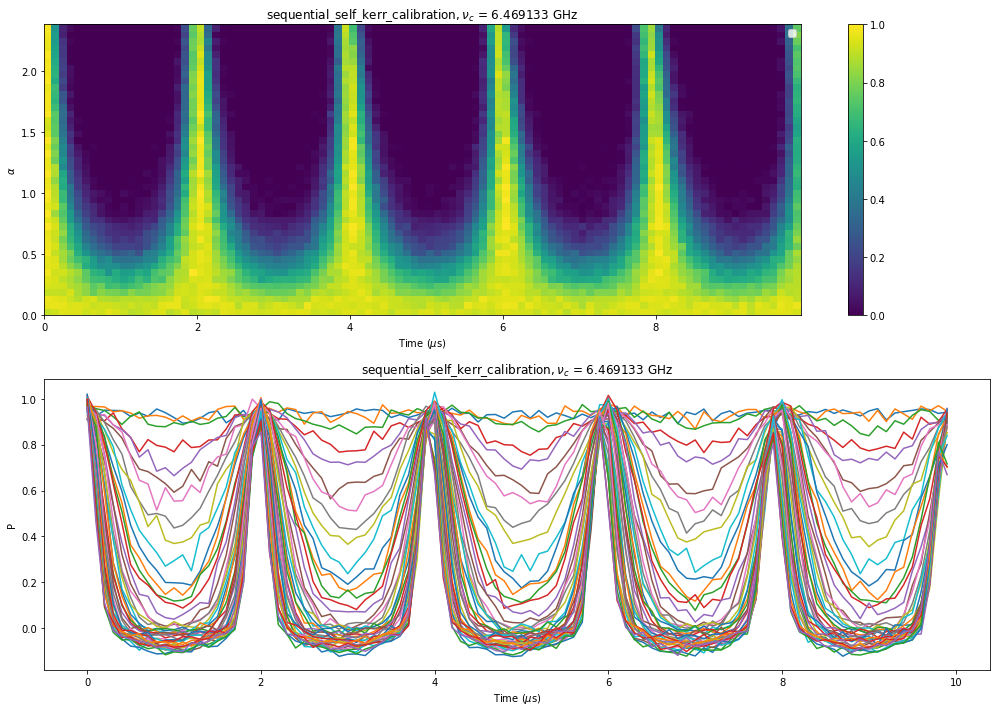

In [15]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [5,14]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                 lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

25
33
0.00226
0.00227
0.00228
0.00229
0.0023
0.00231
0.00232
0.00233
0.00234
0.00235
0.00236
0.00237
0.00238
0.00239
0.0024000000000000002
0.0024100000000000002
0.0024200000000000003
0.0024300000000000003
0.0024400000000000003
0.0024500000000000004
0.0024600000000000004
26.998606797768005
best K fit:  0.0032400000000000003
best offset fit:  0.00235


No handles with labels found to put in legend.


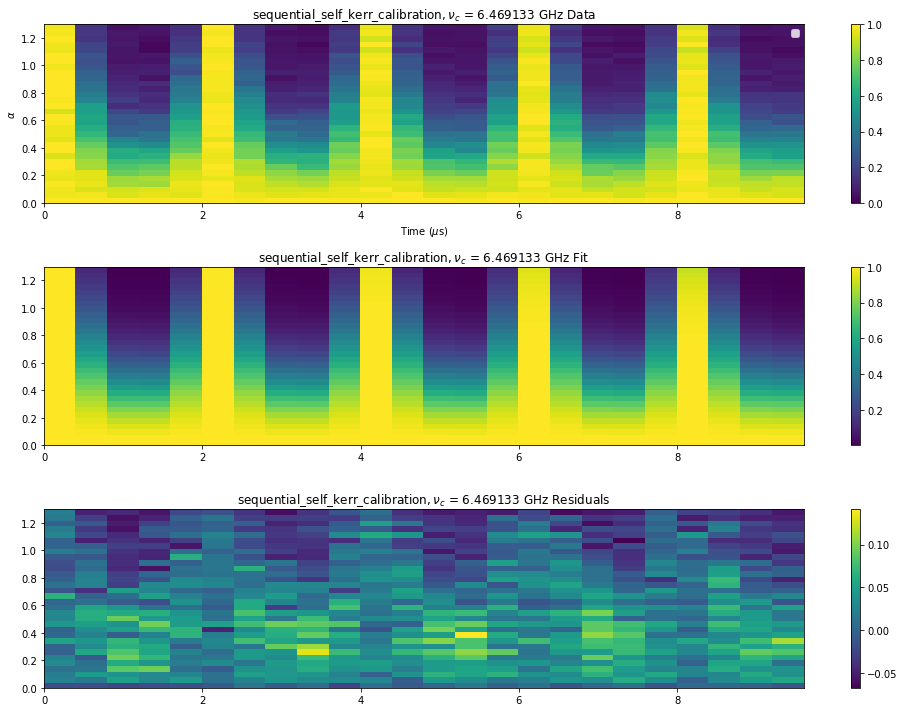

In [22]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [5]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']]

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(3.14e-3, 3.34e-3, 0.01e-3)*2*np.pi
offset_list = np.arange(2.26e-3, 2.46e-3, 0.01e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [23]:
nu_c + best_offset/1e3

6.469135847796497

### mode 6

350


33
650


49


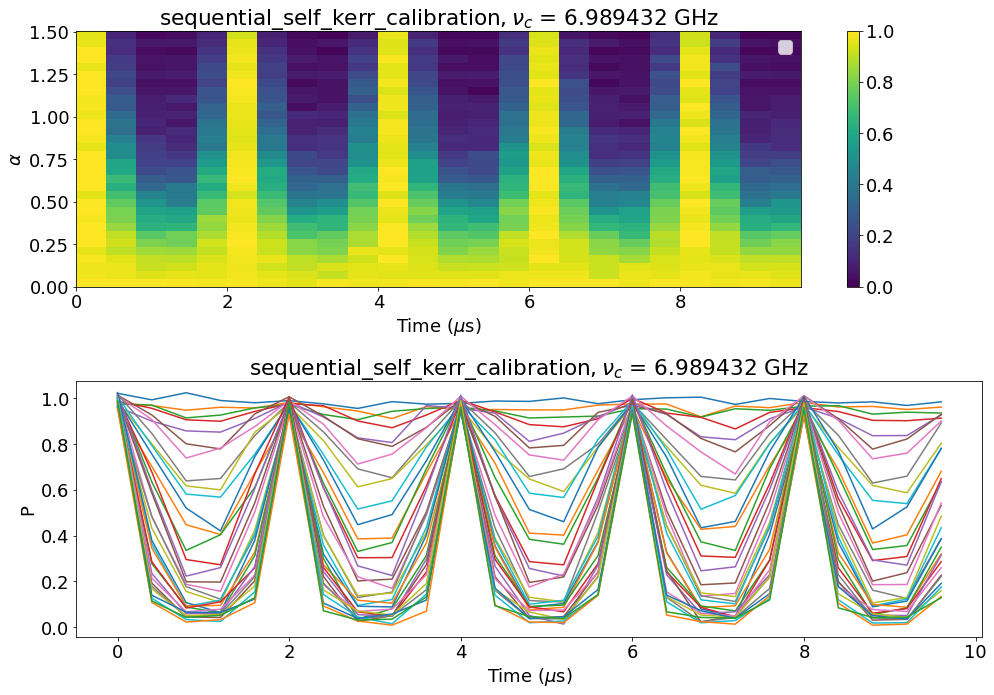

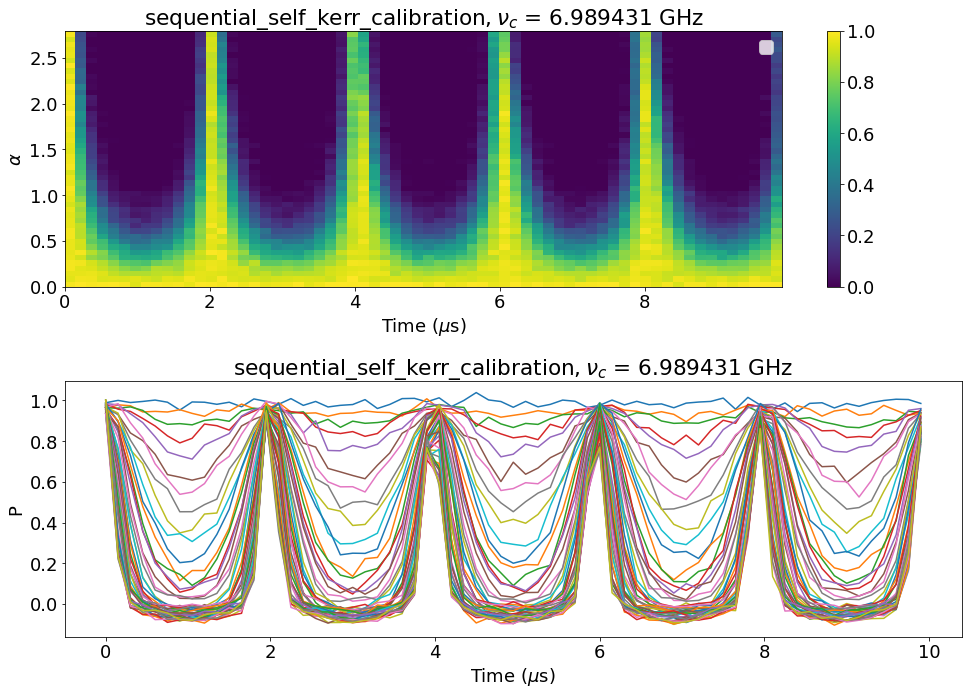

In [44]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [3,16]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] / \
                 lengths[expt_cfg['mode_index']] * expt_cfg['cavity_drive_len']
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

25
33
-0.0011
-0.00109
-0.00108
-0.00107
-0.00106
-0.00105
-0.00104
-0.0010299999999999999
-0.0010199999999999999
-0.0010099999999999998
-0.0009999999999999998
-0.0009899999999999998
-0.0009799999999999998
-0.0009699999999999997
-0.0009599999999999997
-0.0009499999999999997
-0.0009399999999999996
-0.0009299999999999996
-0.0009199999999999996
-0.0009099999999999996
-0.0008999999999999995
31.969749056772848
best K fit:  0.00148
best offset fit:  -0.0009499999999999997


No handles with labels found to put in legend.


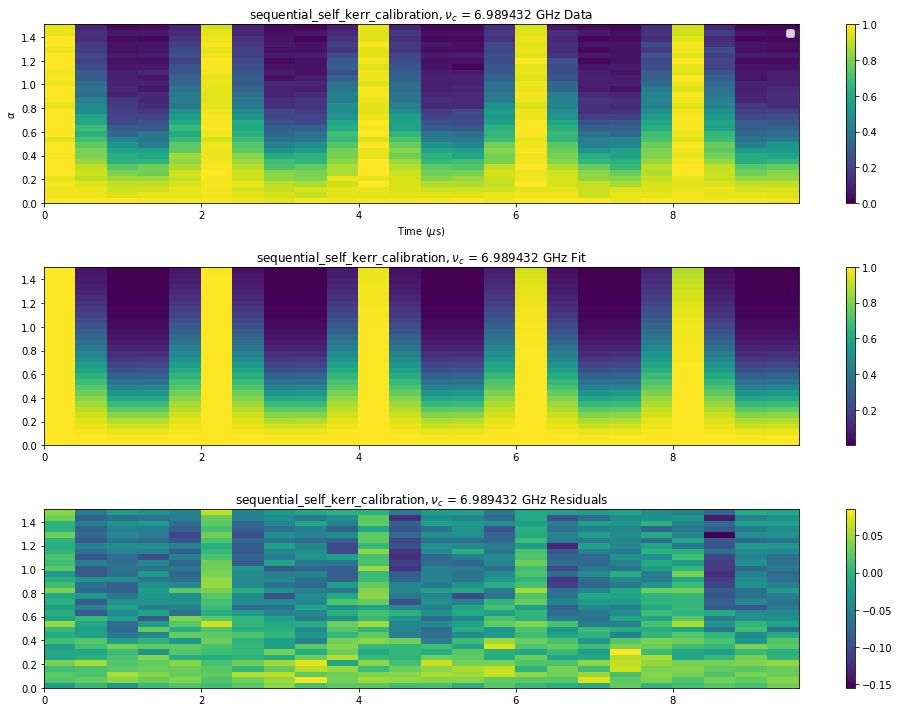

In [164]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [3]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']]

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(1.4e-3, 1.5e-3, 0.01e-3)*2*np.pi
offset_list = np.arange(-1.1e-3, -0.9e-3, 0.01e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [167]:
nu_c + best_offset/1e3

6.989431112044746

### mode 7

1000


No handles with labels found to put in legend.


49


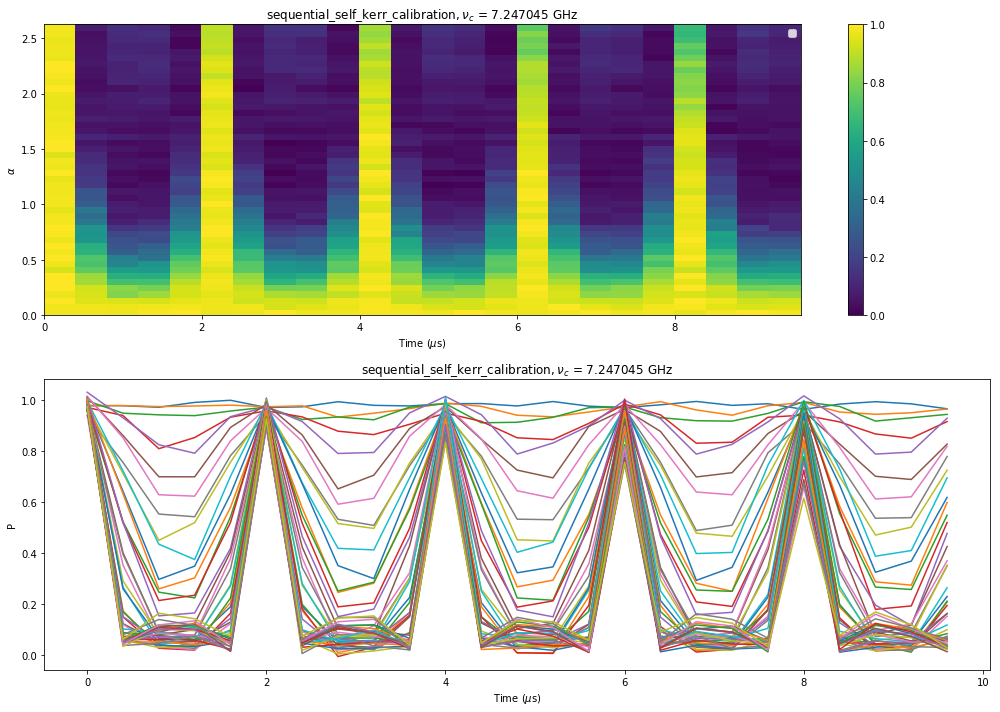

In [194]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [7]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] * 1000/375
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

25
49
-0.0008
-0.00079
-0.00078
-0.00077
-0.0007599999999999999
-0.0007499999999999999
-0.0007399999999999999
-0.0007299999999999999
-0.0007199999999999998
-0.0007099999999999998
-0.0006999999999999998
50.87098062853174
best K fit:  0.0007200000000000003
best offset fit:  -0.0007499999999999999


No handles with labels found to put in legend.


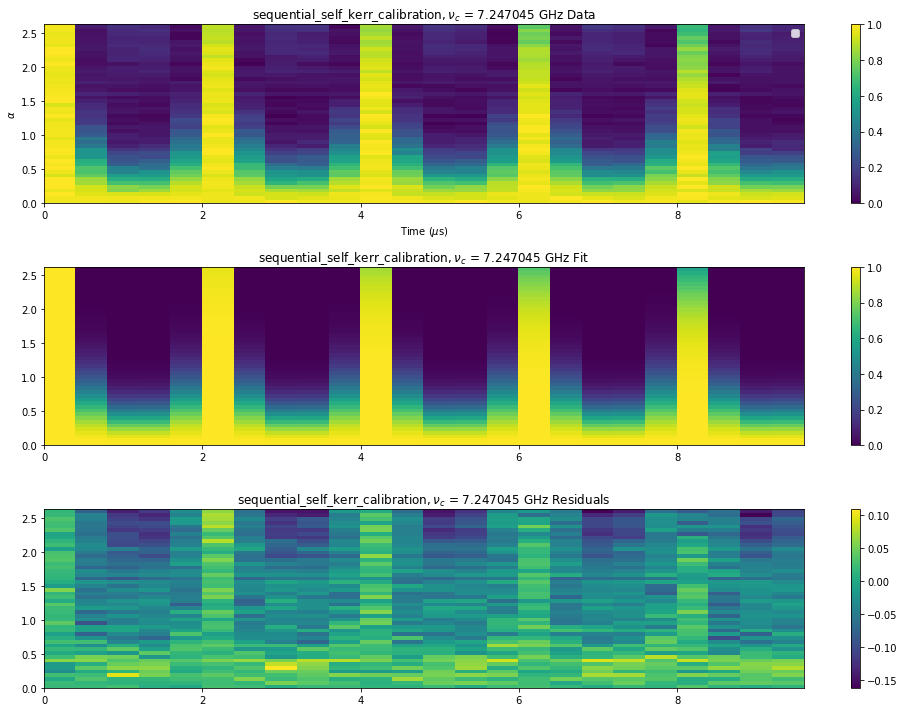

In [32]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [7]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] * 1000/375

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(0.62e-3, 0.82e-3, 0.01e-3)*2*np.pi
offset_list = np.arange(-0.8e-3, -0.7e-3, 0.01e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

In [33]:
nu_c+best_offset/1e3

7.247043964383068

### mode 8

900


No handles with labels found to put in legend.


9


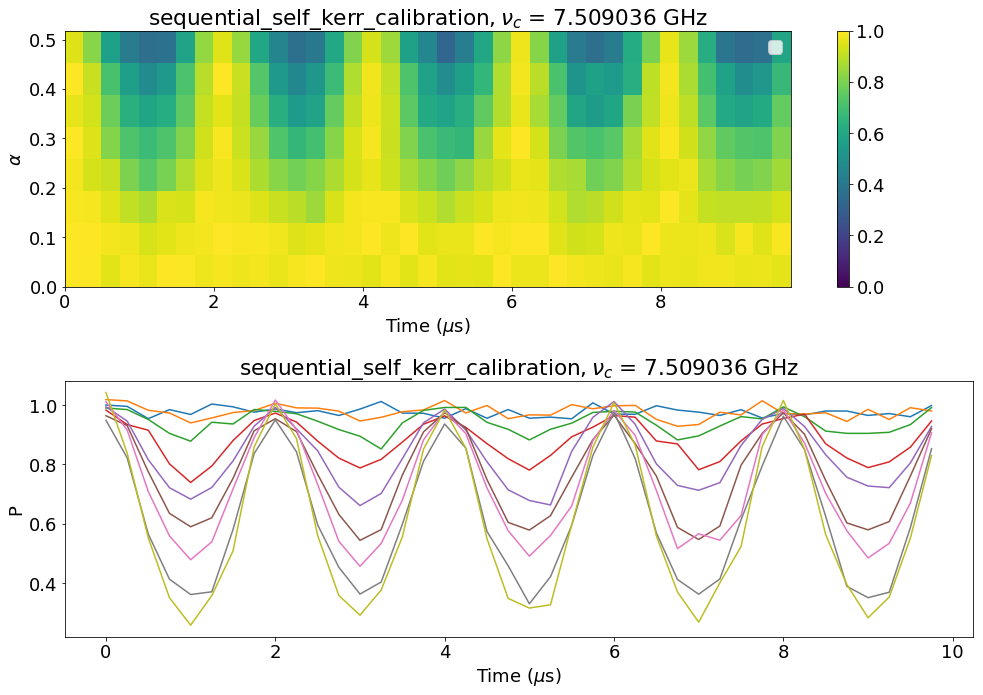

In [200]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [8]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] * 900/450
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

2000


No handles with labels found to put in legend.


49


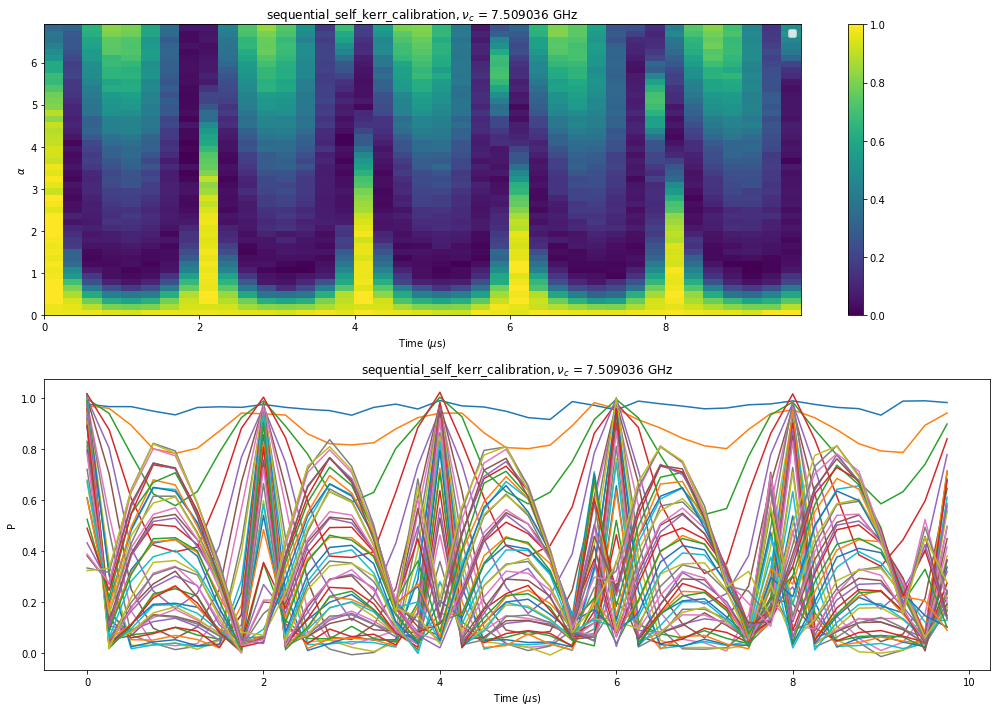

In [6]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [9]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_len'])
        # print(ramsey_freq)
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] * 2000/450
 
        fig = plt.figure(figsize=(14,10))
        ax = fig.add_subplot(211,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        
        pcolormesh(t,alphas,P,cmap = 'viridis')
        clim(0,1)
        colorbar()
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('$\\alpha$')
        ax.legend()
        ax = fig.add_subplot(212,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz')
        print(len(P))
        for ii,p in enumerate(P):
            plot(t,p,'-')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        tight_layout()
        

        

40
49
-0.001
-0.0009
-0.0007999999999999999
-0.0006999999999999999
-0.0005999999999999998
-0.0004999999999999998
-0.00039999999999999975
-0.0002999999999999997
-0.00019999999999999966
-9.999999999999961e-05
4.336808689942018e-19
0.00010000000000000048
0.00020000000000000052
0.00030000000000000057
0.0004000000000000006
0.0005000000000000007
0.0006000000000000007
0.0007000000000000008
0.0008000000000000008
0.0009000000000000008
380.5409831768932
best K fit:  0.0006000000000000001
best offset fit:  -0.0006999999999999999


No handles with labels found to put in legend.


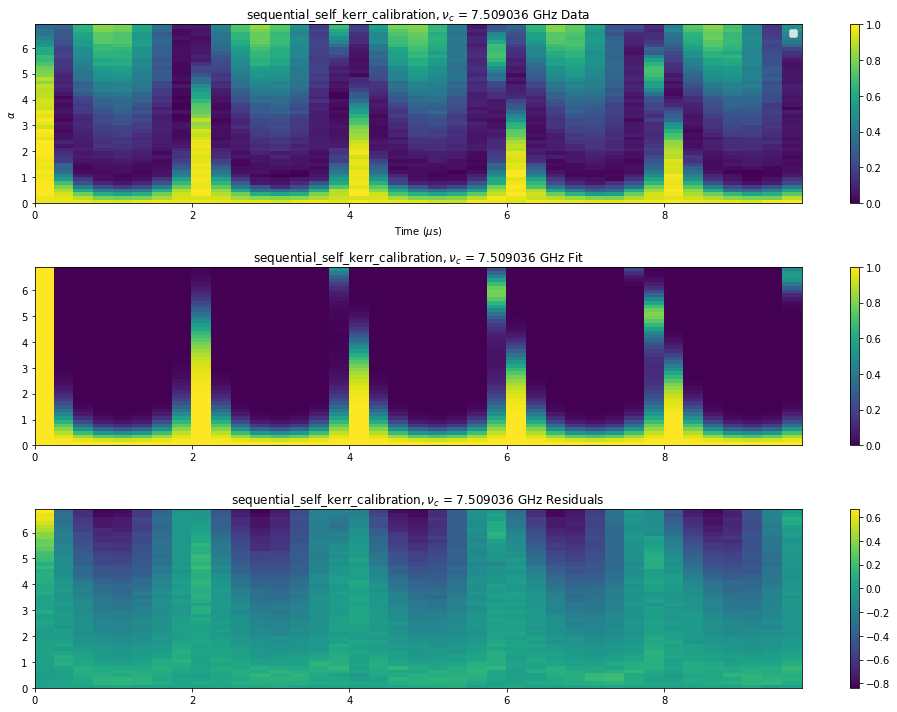

In [35]:
expt_name = 'sequential_self_kerr_calibration'
filelist = [9]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        
        P_dat = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
        amps = arange(swp_cfg['start'],swp_cfg['stop'],swp_cfg['step'])[:len(P_dat)]
        alphas = amps * amp_to_alpha_scales[expt_cfg['mode_index']] * 2000/450

        
def self_kerr_fit(omega_r,kappa,alpha,t,N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/scipy.special.factorial(n) 
                                   for n in arange(N)])))**2
    return tot


# t = t[4:-6]
# alphas = alphas[20:]
# cut_P_dat = []
# for i in range(len(alphas), 0, -1):
#     cut_P_dat.append(P_dat[-i][:len(t)])
# P_dat = cut_P_dat

print(len(t))
print(len(alphas))

Klist = np.arange(0.0e-3, 1.4e-3, 0.2e-3)*2*np.pi
offset_list = np.arange(-1e-3, 1e-3, 0.1e-3)
P_dat = np.array(P_dat)  # / np.mean(P_dat)
residuals = []
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        ramsey_freq -= offset
        P_fit = ([[self_kerr_fit(2*pi*ramsey_freq,K,alpha,tt,100) for tt in t] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
ramsey_freq = expt_cfg['ramsey_freq']*1e3
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in t] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(t,alphas,P_dat,cmap = 'viridis')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(t,alphas,P_best_fit,cmap = 'viridis')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(t,alphas,P_res,cmap = 'viridis')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

Text(0, 0.5, '$\\kappa$ (kHz)')

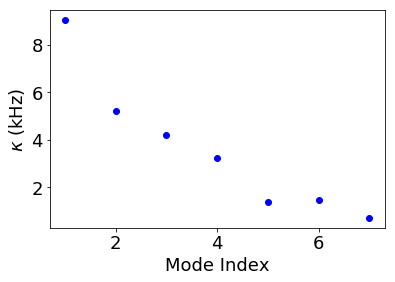

In [45]:
modes = np.arange(1,8)
kappas = array([9.02e-6, 5.23e-6, 4.19e-6, 3.24e-6, 1.4e-6, 1.48e-6, 0.72e-6]) * 10**6
plt.plot(modes, kappas, 'bo')
plt.xlabel("Mode Index")
plt.ylabel("$\\kappa$ (kHz)")

# Cross-Kerr calibrations

25.0 0.5
ramsey freq 0.1


No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:447: RuntimeWarning: Number of calls to function has reached maxfev = 1200.
  warnings.warn(errors[info][0], RuntimeWarning)


blockade cavity freq choice = 7.509036487741198 GHz
Oscillation freq =  0.14171415622923994  MHz
Offset freq = -0.041714156229239935 MHz
ramsey-freq  =  0.1
actual cavity freq = 7.508994773584968 GHz
T2* = -53057654.416975334 us


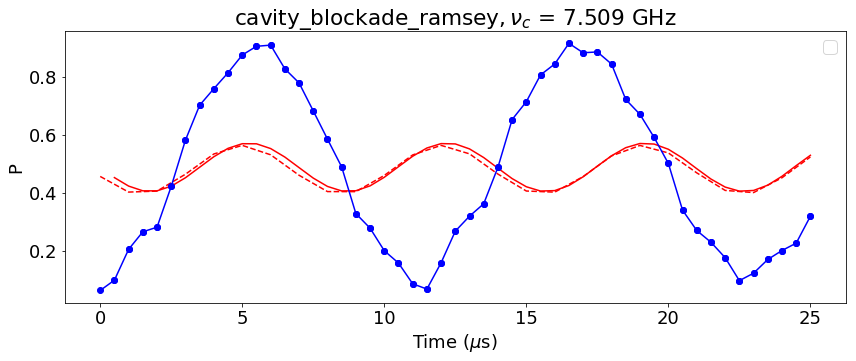

In [47]:
expt_name = 'cavity_blockade_ramsey'
filelist = [1]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(P))]/1e3
        print (t[-1],t[1]-t[0])
        print ('ramsey freq',ramsey_freq)
        
        fig = plt.figure(figsize=(14,5))
        ax = fig.add_subplot(111,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,3)) + ' GHz')
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('P')
        ax.legend()

        p = fitdecaysin(t[1:],P[1:],fitparams = None,showfit=False)
        f = fitdecaysin(t[1:],P[1:],fitparams = p,showfit=True)
        p,err = optimize.curve_fit(decaysinb,t,P,p0=[f[0],f[1],f[2],f[3],f[4]])
        t2 = arange(0,expt_cfg['stop',1)
        plot(t2,decaysinb(t2,p[0],p[1],p[2],p[3],p[4]),'r--',alpha=1.0)
        ax.plot(t,P,'bo-',label = show)
        
        offset = ramsey_freq - p[1]
        nu_c_new = nu_c + offset*1e-3
        
        print("blockade cavity freq choice =",nu_c,"GHz")
        print ("Oscillation freq = ",p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print ('ramsey-freq  = ',ramsey_freq)
        print("actual cavity freq =",nu_c_new,"GHz")
        print("T2* =",p[3],"us") 

## get original offset frequencies without photons prepared

25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.20090863815214846  MHz
Offset freq = -0.0009086381521484499 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.247043055744916 GHz
T2* = 19201475531949.824 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.19842167123844423  MHz
Offset freq = 0.0015783287615557806 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.24704554271183 GHz
T2* = 37027420820794.25 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.19611045078088324  MHz
Offset freq = 0.0038895492191167724 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.247047853932287 GHz
T2* = 912791199860791.8 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.19441116667520997  MHz
Offset freq = 0.0055888333247900435 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.247049553216393 GHz
T2* = 291.9329946408943 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.1929555787626757  MHz
Offset freq = 0.007044421237324322 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.247051008804306 GHz
T2* = 413.28201298964353 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.1888217697212662  MHz
Offset freq = 0.011178230278733797 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.2470551426133465 GHz
T2* = 295.4997480060236 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 7.247043964383068 GHz
Oscillation freq =  0.18844631849334273  MHz
Offset freq = 0.011553681506657282 MHz
ramsey-freq  =  0.2
actual cavity freq = 7.247055518064575 GHz
T2* = -11627676325038.617 us


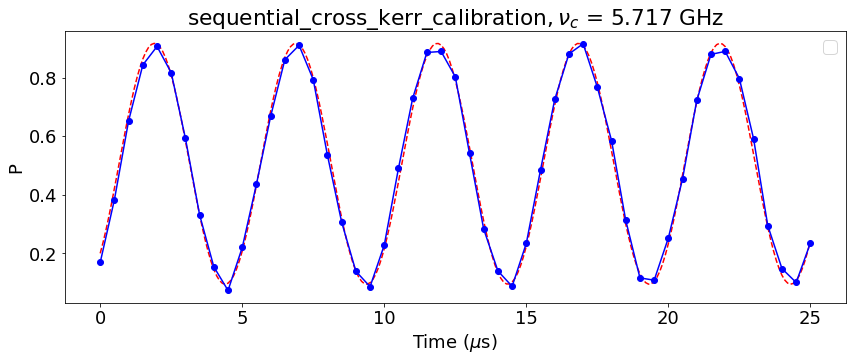

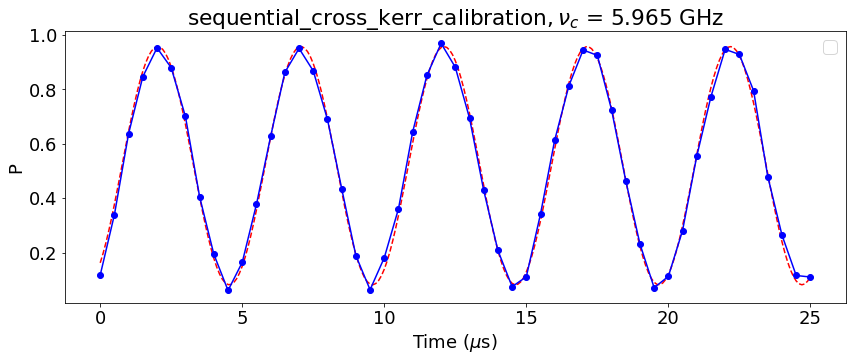

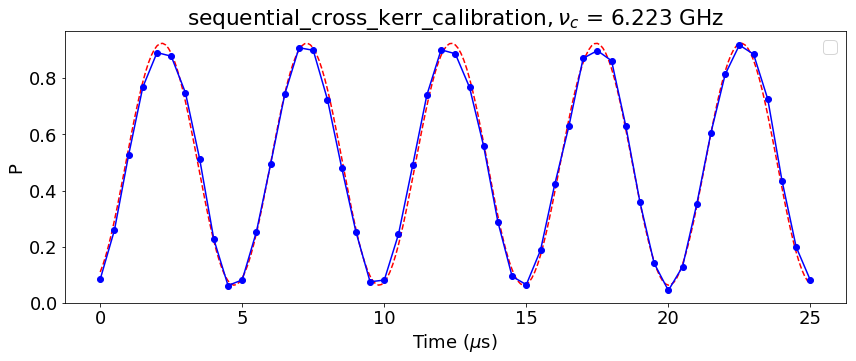

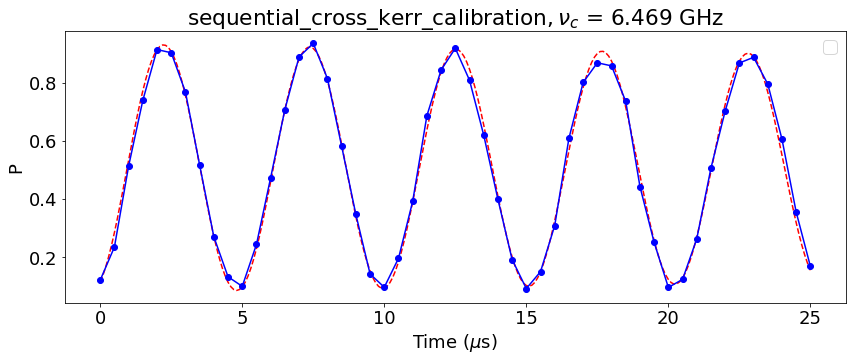

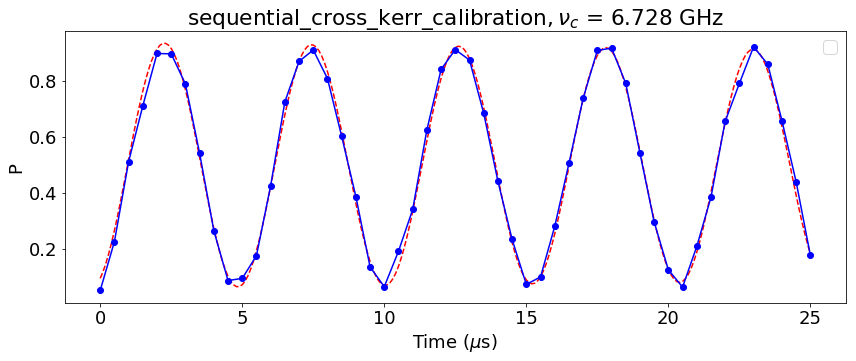

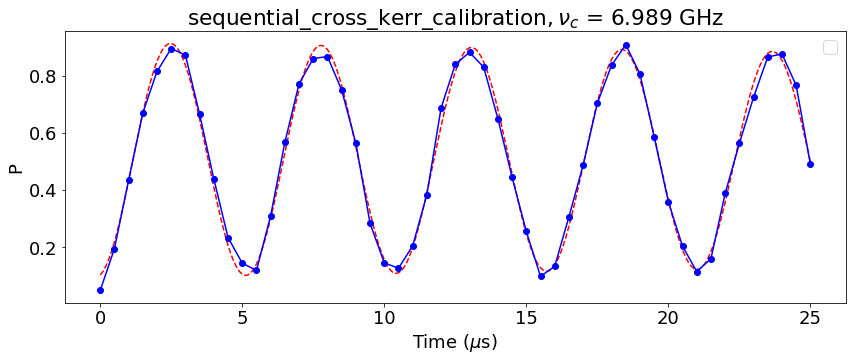

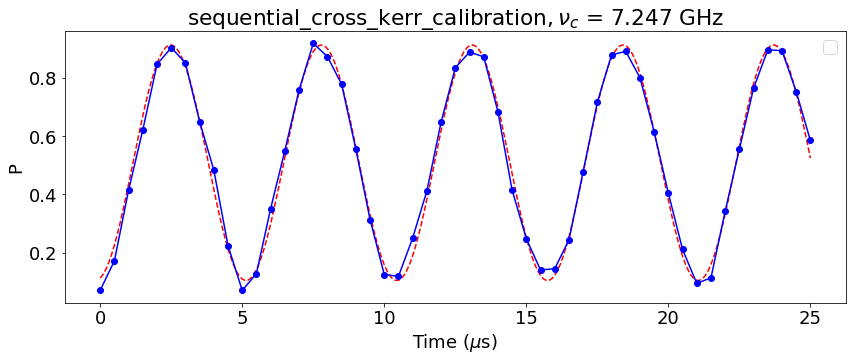

In [170]:
expt_name = 'sequential_cross_kerr_calibration'
filelist = [1]
show = 'I'
cav_nus_from_ramsey = []
offsets_from_ramsey = []
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_blockade_ramsey']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        
        P = array(a[show])
        
        for jj, y in enumerate(P):
            t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(y))]/1e3
            print (t[-1],t[1]-t[0])
            print ('ramsey freq',ramsey_freq)

            fig = plt.figure(figsize=(14,5))
            ax = fig.add_subplot(111,title= expt_name+ '$, \\nu_c$ = '+ str(
                around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz')
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel('P')
            ax.legend()

            p = fitdecaysin(t[1:-1],y[1:-1],fitparams = None,showfit=False)
            f = fitdecaysin(t[2:],y[2:],fitparams = p,showfit=False)
            p,err = optimize.curve_fit(decaysinb,t,y,p0=[f[0],f[1],f[2],f[3],f[4]])
            t2 = arange(0,expt_cfg['stop']/1e3,0.1)
            plot(t2,decaysinb(t2,p[0],p[1],p[2],p[3],p[4]),'r--',alpha=1.0)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            nu_c_new = nu_c + offset*1e-3
            cav_nus_from_ramsey.append(nu_c_new)
            offsets_from_ramsey.append(offset)

            print("blockade cavity freq choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print ('ramsey-freq  = ',ramsey_freq)
            print("actual cavity freq =",nu_c_new,"GHz")
            print("T2* =",p[3],"us") 

25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 6.22319950267382 GHz
Oscillation freq =  0.19400530370612237  MHz
Offset freq = 0.005994696293877638 MHz
ramsey-freq  =  0.2
actual cavity freq = 6.223205497370114 GHz
T2* = 133.37066840832657 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 6.22319950267382 GHz
Oscillation freq =  0.19303061797404442  MHz
Offset freq = 0.006969382025955595 MHz
ramsey-freq  =  0.2
actual cavity freq = 6.223206472055846 GHz
T2* = 75864777231489.44 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 6.22319950267382 GHz
Oscillation freq =  0.19388333625796314  MHz
Offset freq = 0.006116663742036871 MHz
ramsey-freq  =  0.2
actual cavity freq = 6.223205619337562 GHz
T2* = 1807.6795245175429 us
25.0 0.5
ramsey freq 0.2


No handles with labels found to put in legend.


blockade cavity freq choice = 6.22319950267382 GHz
Oscillation freq =  0.19818980076943746  MHz
Offset freq = 0.0018101992305625536 MHz
ramsey-freq  =  0.2
actual cavity freq = 6.223201312873051 GHz
T2* = 89.13432987386688 us


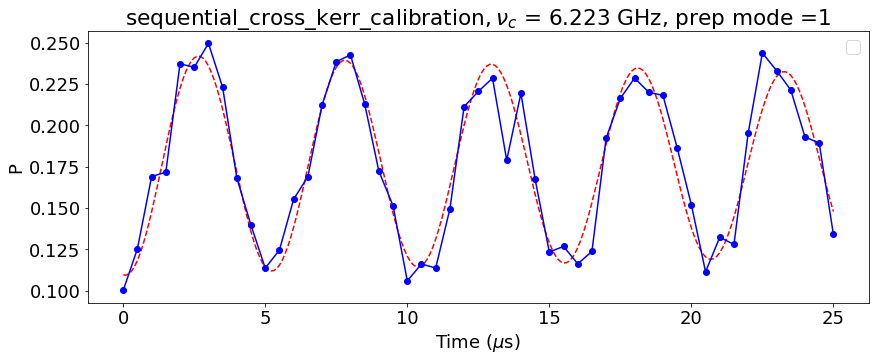

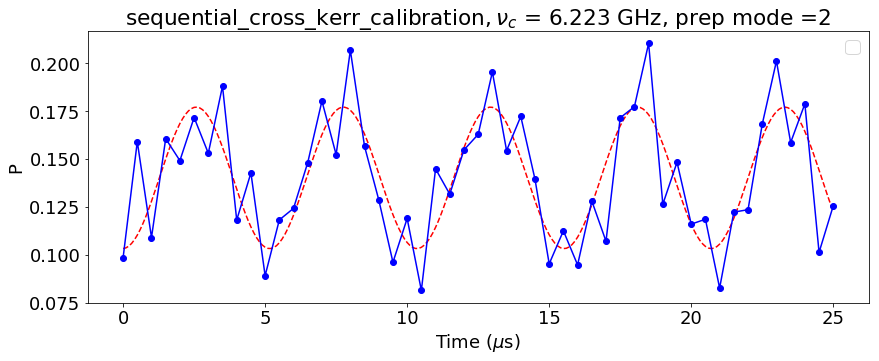

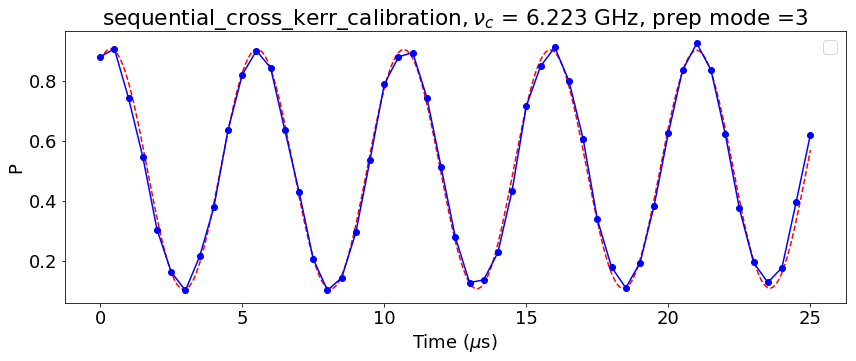

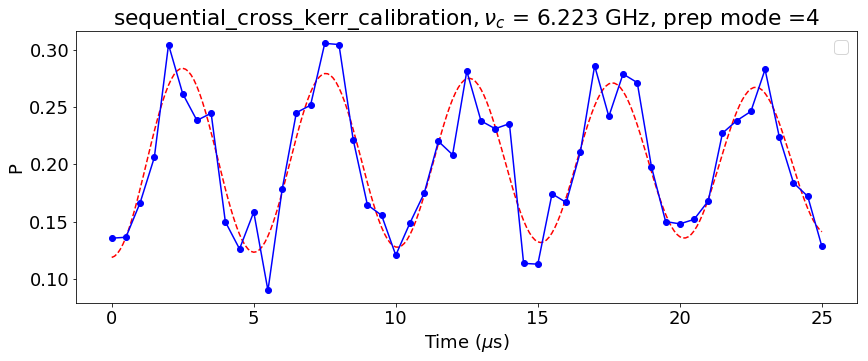

In [74]:
expt_name = 'sequential_cross_kerr_calibration'
filelist = [4]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_blockade_ramsey']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        
        P = array(a[show])
        
        for jj, y in enumerate(P):
            t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(y))]/1e3
            print (t[-1],t[1]-t[0])
            print ('ramsey freq',ramsey_freq)

            fig = plt.figure(figsize=(14,5))
            if expt_cfg['prep_photon_with_blockade']:
                ax = fig.add_subplot(111,title= expt_name+ '$, \\nu_c$ = '+ str(
                    around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz, prep mode =' + str(swp_cfg['prep_mode_indices'][jj]))
            else:
                ax = fig.add_subplot(111,title= expt_name+ '$, \\nu_c$ = '+ str(
                    around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz')
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel('P')
            ax.legend()

            p = fitdecaysin(t[1:-1],y[1:-1],fitparams = None,showfit=False)
            f = fitdecaysin(t[2:],y[2:],fitparams = p,showfit=False)
            p,err = optimize.curve_fit(decaysinb,t,y,p0=[f[0],f[1],f[2],f[3],f[4]])
            t2 = arange(0,expt_cfg['stop']/1e3,0.1)
            plot(t2,decaysinb(t2,p[0],p[1],p[2],p[3],p[4]),'r--',alpha=1.0)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            nu_c_new = nu_c + offset*1e-3

            print("blockade cavity freq choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print ('ramsey-freq  = ',ramsey_freq)
            print("actual cavity freq =",nu_c_new,"GHz")
            print("T2* =",p[3],"us") 

## switching to trying to get cross-Kerr using blockade cavity spectroscopy

### cavity offset frequencies without prepared photons

0
=============== file num =  1  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: 0.51
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  False
offset =  -0.01009172768214103
new cavity offset freq (MHz) =  -0.01009172768214103
new cavity freq =  7.247033872655386
offset =  -0.008397803001833704
new cavity offset freq (MHz) =  -0.008397803001833704
new cavity freq =  7.247035566580067
offset =  -0.009938519226676368
new cavity offset freq (MHz) =  -0.009938519226676368
new cavity freq =  7.247034025863842
offset =  -0.009633218452871887
new cavity offset freq (MHz) =  -0.009633218452871887
new cavity freq =  7.247034331164615
offset =  -0.0090949688056419
new cavity offset freq (MHz) =  -0.0090949688056419
new cavity freq =  7.247034869414263
offset =  -0.008624789227514572
new cavity offset freq (MHz) =  -0.008624789227514572
new cavity freq =  7.2470353395938405
offset =  -0.01014497162

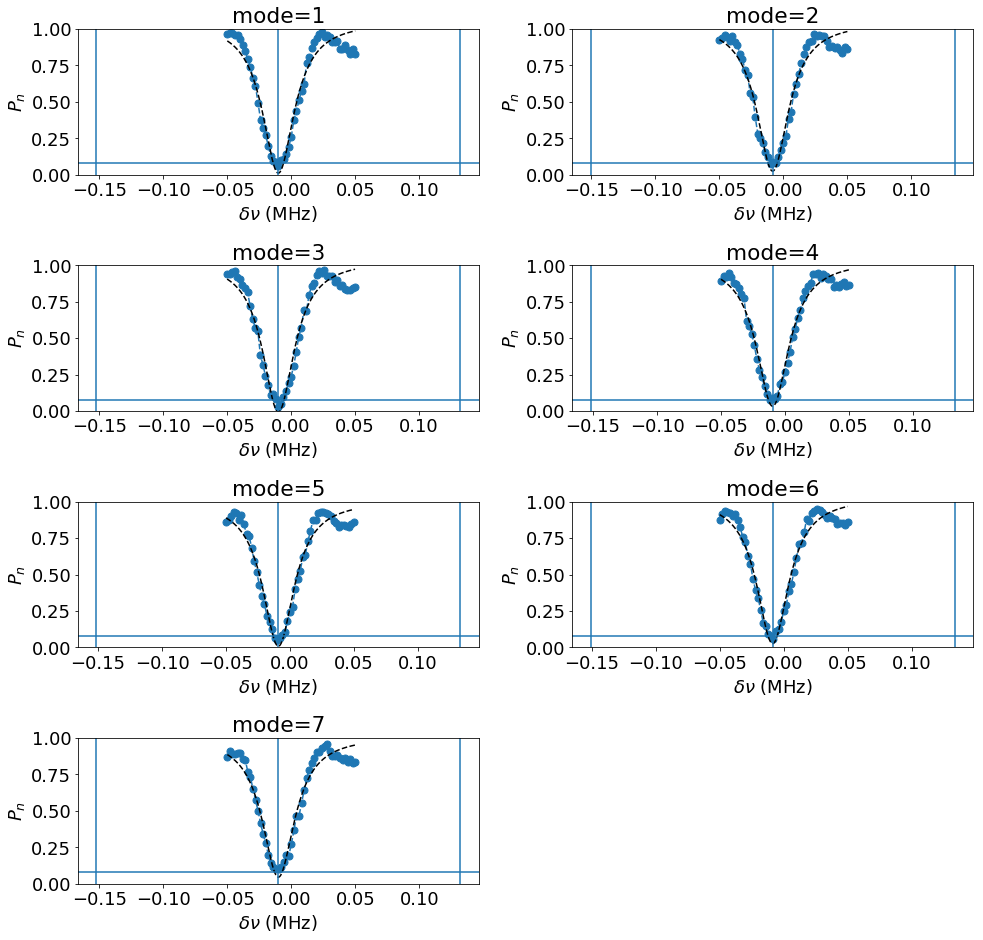

In [111]:
expt_name = 'sequential_blockade_experiments_cavity_spectroscopy'
filelist = [1]

no_photon_mode_offsets = np.zeros(10)
show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",expt_cfg['cavity_amp'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,16))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,2,ii+1,title= 'mode=' + 
                     str(swp_cfg['mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            no_photon_mode_offsets[swp_cfg['mode_indices'][ii]] = p[2] + expt_cfg['cavity_offset_freq']*1e3
plt.tight_layout()
        
                   

In [112]:
no_photon_mode_offsets

array([ 0.        , -0.01009173, -0.0083978 , -0.00993852, -0.00963322,
       -0.00909497, -0.00862479, -0.01014497,  0.        ,  0.        ])

0
=============== file num =  0  ==========================
use weak drive for dressing: True
use weak drive for probe: True 0
dressing amp: 0.18
cavity drive amp: [0.18, 0.18, 0.18, 0.18, 0.18, 0.18, 0.18, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.235, 0.235, 0.235, 0.235, 0.235, 0.235, 0.235, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51]
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
offset =  -0.006074715619722399
new cavity offset freq (MHz) =  -0.006074715619722399
new cavity freq =  5.965215543086485
offset =  -0.006723429651975455
new cavity offset freq (MHz) =  -0.006723429651975455
new cavity freq =  5.965214894372452
offset =  0.013343848984306093
new cavity offset freq (MHz) =  0.013343848984306093
new cavity freq =  5.965234961651088
offset =  -0.004911365875241035
new cavity offset freq (MHz) =  -0.004911365875241035
new ca

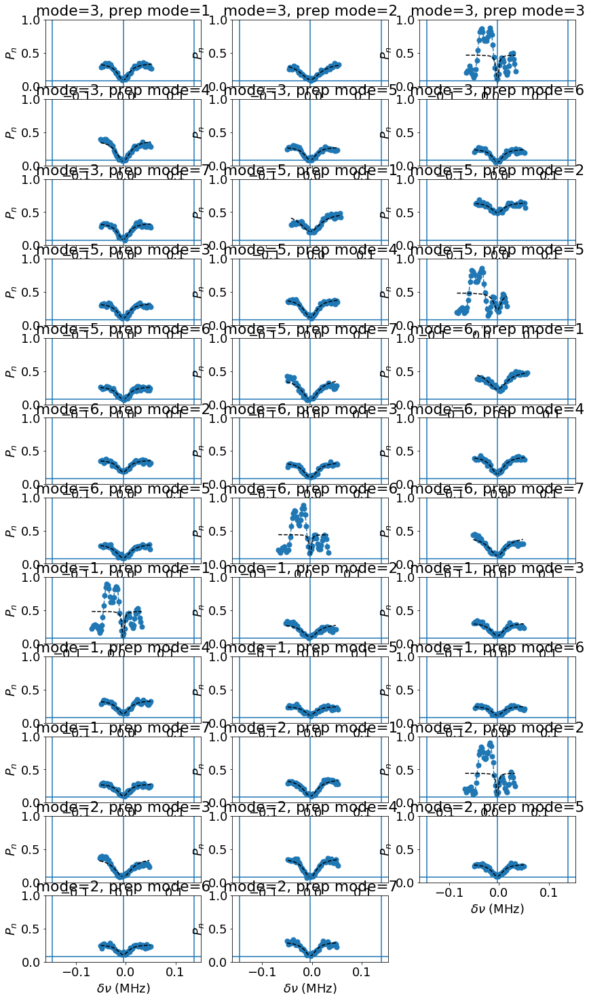

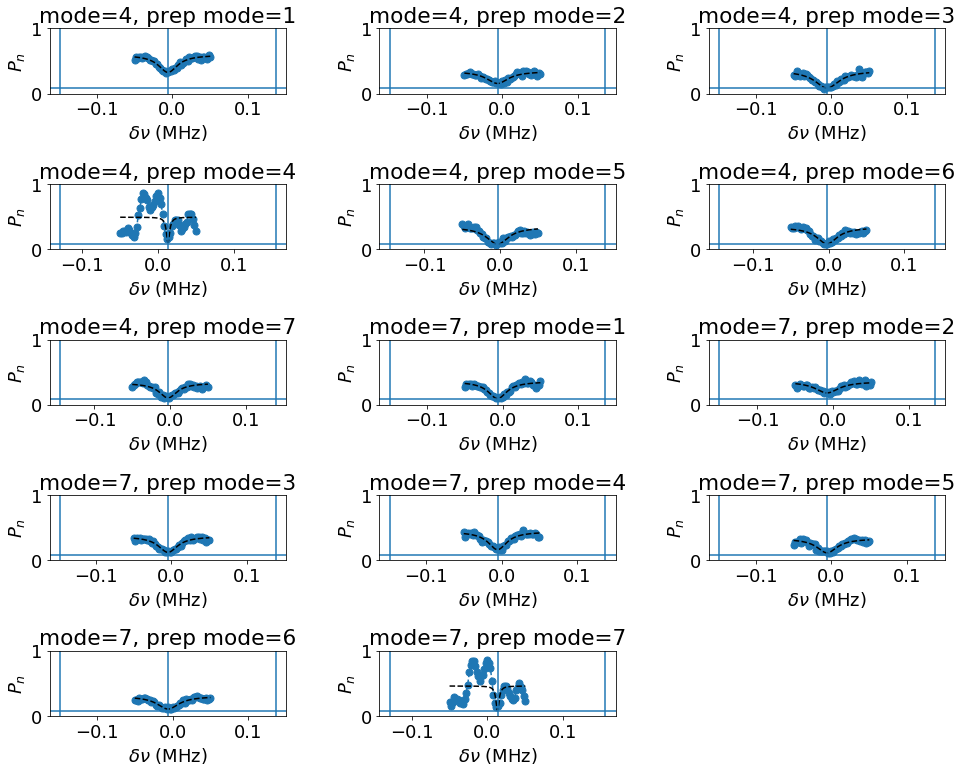

In [436]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [0,1]

cross_kerr_mat = np.zeros((10, 10))

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,32))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(15,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
plt.tight_layout()

In [121]:
cross_kerr_mat

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.0090018 ,  0.00754216,  0.00452163,
         0.00533406,  0.00518178,  0.00474186,  0.        ,  0.        ],
       [ 0.        ,  0.0034912 ,  0.        ,  0.00591415,  0.00314074,
         0.00505769,  0.00364762,  0.00503617,  0.        ,  0.        ],
       [ 0.        ,  0.0038638 ,  0.00321509,  0.        ,  0.00502715,
         0.00597325,  0.00585677,  0.00483164,  0.        ,  0.        ],
       [ 0.        ,  0.0038025 ,  0.00341717,  0.00380751,  0.        ,
         0.00619418,  0.00759133,  0.00688033,  0.        ,  0.        ],
       [ 0.        , -0.00219889,  0.00328157,  0.00391698,  0.00472355,
         0.        ,  0.00481309,  0.00647606,  0.        ,  0.        ],
       [ 0.        , -0.00060157,  0.00388387,  0.00413411,  0.00467884,
         0.00444762,  0.        ,  0.00723501

0
=============== file num =  32  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: 0.15
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  False
offset =  -0.010120276674858143
new cavity offset freq (MHz) =  -0.010120276674858143
new cavity freq =  5.7166630180885525
0
=============== file num =  34  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: 0.51
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  False
offset =  -0.009427567175980018
new cavity offset freq (MHz) =  -0.009427567175980018
new cavity freq =  7.247034536815892
0
=============== file num =  36  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: 0.18
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
offset =  -0.005442301

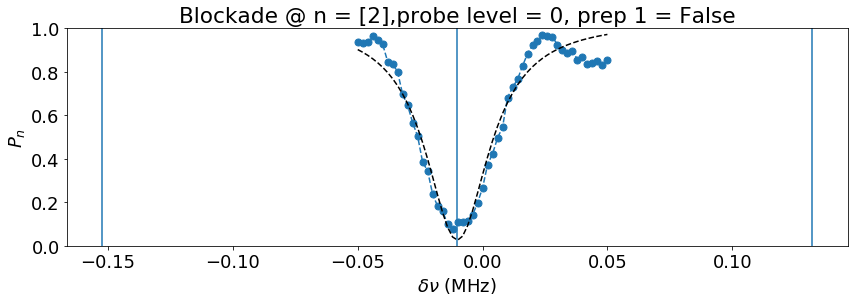

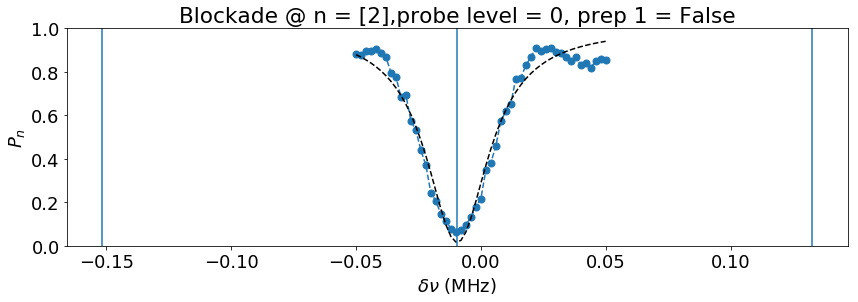

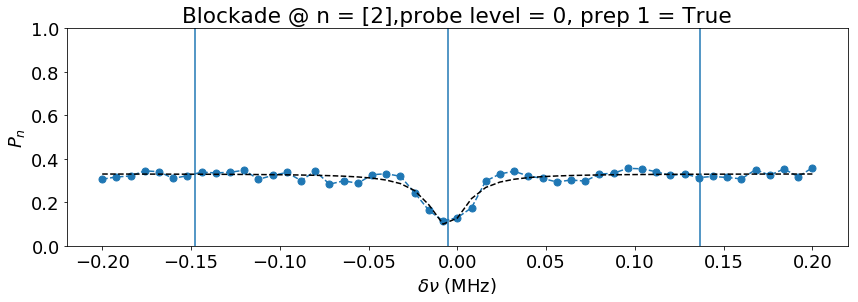

In [130]:
expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [32,34,36]


show = 'I'
for ff,f in enumerate(filelist):
    filename = "..\\data\\" + str(f).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        print (expt_cfg['probe_level'])

        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",f," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",expt_cfg['cavity_amp'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show]) 
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3

        fig = plt.figure(figsize=(14,4))
        ax = fig.add_subplot(111,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
                             ',probe level = '+str(expt_cfg['probe_level']) + ', prep 1 = '
                             +str(expt_cfg['prep_state_before_blockade']))


        ax.plot(f,P,'o--',markersize=7)
        p = fitlor(f,-P,showfit=False)
        plot(f,-lorfunc(p,f),'k--')
        axvline(p[2])
        axvline(p[2] - 0.14222370057418157)
        axvline(p[2] + 0.14222370057418157)
        print("offset = ", p[2])
        print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
        print ("new cavity freq = ",nu_c+p[2]*1e-3)


        ax.set_xlabel('$\\delta\\nu$ (MHz)')
        ax.set_ylabel('$P_{n}$')
        ylim(0,1)

        
                   

# Check all cavity frequencies again since blockade cavity offset frequencies don't make sense (increase in magnitude with chi)

Old cavity freq: 5.716673138365227
Resonance frequency =  5.716666113194553
Offset (MHz): -0.007025170673635728
Old cavity freq: 5.965221617802104
Resonance frequency =  5.965216635662665
Offset (MHz): -0.004982139439668742
Old cavity freq: 6.22319950267382
Resonance frequency =  6.2231949605367145
Offset (MHz): -0.004542137105545407
Old cavity freq: 6.469135847796497
Resonance frequency =  6.46913243557229
Offset (MHz): -0.003412224206300607


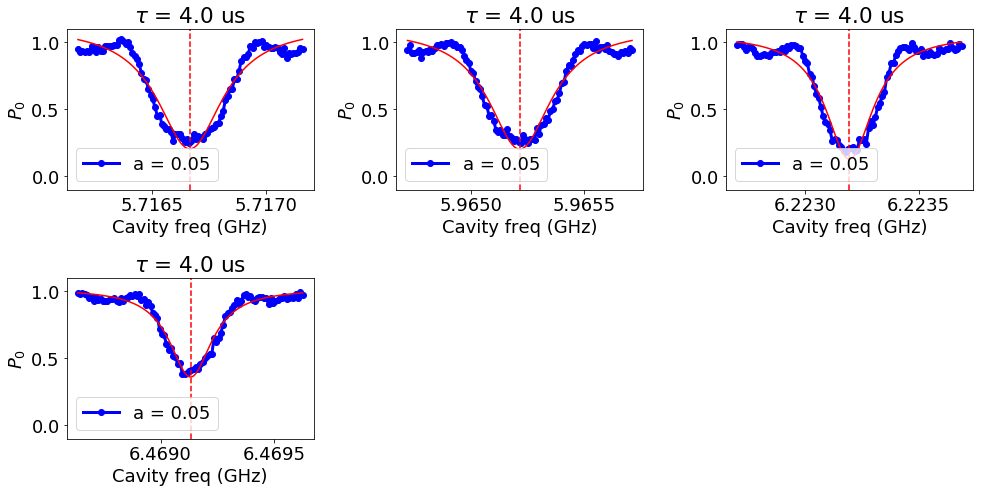

In [182]:
expt_name = 'cavity_spectroscopy_resolved_qubit_pulse'

filelist = [1]

nu_cav = []
offsets = []

# fig = plt.figure(figsize=(14,5*len(filelist)/2))
# show = 'I'

# for ii,i in enumerate(filelist):
#     filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

#     with File(filename,'r') as a:
        
#         ts  = datetime.fromtimestamp(os.path.getctime(filename)).strftime('%Y-%m-%d %H:%M:%S')
#         hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
#         experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
#         quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
#         expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
#         nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
#         nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][expt_cfg['mode_index']]
#         alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
#         nu_r = quantum_device_cfg['readout']['freq']
#         expt_cfg = experiment_cfg[expt_name]
#         amp = expt_cfg['cavity_amp']
#         length = expt_cfg['cavity_pulse_len']

#         ax = fig.add_subplot(len(filelist)/3+1,3,ii+1,title= '$\\tau$ = ' + str(length/1e3) +' us')

#         P = array(a[show])
#         df = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])[:(len(P))]
#         freqs = nu_c + df

#         ax.plot(freqs,P,'bo-',label = 'a = '+str(amp),linewidth=3)

#         p = fitlor(freqs,-P,showfit=False)
#         plot(freqs, -lorfunc(p,freqs),'r-')
#         ax.set_xlabel('Cavity freq (GHz)')
#         ax.set_ylabel('$P_0$')
#         print("Old cavity freq:", nu_c)
#         print ("Resonance frequency = ",p[2])
#         print("Offset (MHz):", (p[2] - nu_c)*1e3)
#         offsets.append((p[2] - nu_c)*1e3)
#         # print ("Width = ",p[3]*1e3,"MHz")
#         print ("========================================")
#         ax.axvline(p[2],color='r',linestyle='dashed')
#         ax.legend()
#         nu_cav.append(p[2])

#         ax.set_ylim(-0.1,1.1)
        
        
expt_name = 'sequential_cavity_spectroscopy_resolved_qubit_pulse'
filelist = [5]

fig = plt.figure(figsize=(14,10))
show = 'I'

for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ts  = datetime.fromtimestamp(os.path.getctime(filename)).strftime('%Y-%m-%d %H:%M:%S')
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_spectroscopy_resolved_qubit_pulse']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][expt_cfg['mode_index']]
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        amp = expt_cfg['cavity_amp']
        length = expt_cfg['cavity_pulse_len']

        P = array(a[show])
        df = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        for jj, y in enumerate(P):
            ax = fig.add_subplot(3,3,jj+1,title= '$\\tau$ = ' + str(length/1e3) +' us')
            nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][swp_cfg['modelist'][jj]]
            freqs = nu_c + df

            ax.plot(freqs,y,'bo-',label = 'a = '+str(amp),linewidth=3)

            p = fitlor(freqs,-y,showfit=False)
            plot(freqs, -lorfunc(p,freqs),'r-')
            ax.set_xlabel('Cavity freq (GHz)')
            ax.set_ylabel('$P_0$')
            print("Old cavity freq:", nu_c)
            print ("Resonance frequency = ",p[2])
            print("Offset (MHz):", (p[2] - nu_c)*1e3)
            # print ("Width = ",p[3]*1e3,"MHz")
            print ("========================================")
            ax.axvline(p[2],color='r',linestyle='dashed')
            ax.legend()
            nu_cav.append(p[2])
            ax.set_ylim(-0.1,1.1)
            offsets.append((p[2] - nu_c)*1e3)
            
nu_cav = array(nu_cav)
      

plt.tight_layout()

nu_cav = array(nu_cav)

In [175]:
nu_cav

array([5.71667644, 5.96523088, 6.22319788, 6.46913729, 6.7275047 ,
       6.9894421 , 7.24706064])

In [157]:
print(offsets)
print(no_photon_mode_offsets)

[-0.003795278425755555, 0.0037694063008686385, 0.0013394304803071577, -0.002408998804881435, 0.011119612503662779, -0.03138108597600109, -0.010509892887533567]
[ 0.         -0.01009173 -0.0083978  -0.00993852 -0.00963322 -0.00909497
 -0.00862479 -0.01014497  0.          0.        ]


Text(0, 0.5, 'Offset (MHz)')

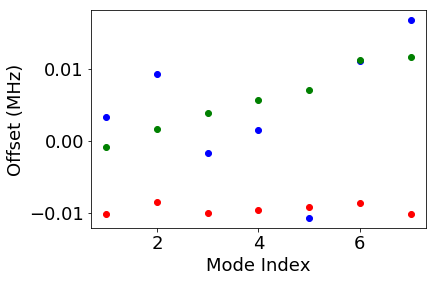

In [176]:
plt.plot(np.arange(1,8), offsets, 'bo', label="cavity spectroscopy freqs")
plt.plot(np.arange(1,8), no_photon_mode_offsets[1:8], 'ro', label="cavity offset freqs blockade")
plt.plot(np.arange(1,8), offsets_from_ramsey, 'go')
plt.xlabel("Mode Index")
plt.ylabel("Offset (MHz)")

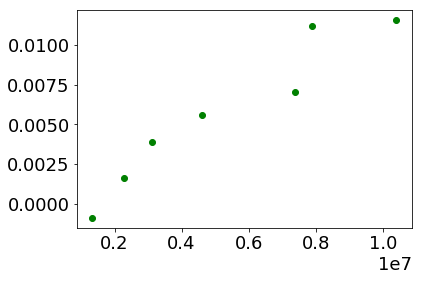

In [180]:
chis = array([-0.8681364155184741e-3, -0.6635472533740754e-3, -0.5658737384711832e-3, -0.4657193624777367e-3, -0.36830687624976916e-3,
                  -0.3558043967288626e-3, -0.3101284315425065e-3])
plt.plot(1.0/chis**2, offsets_from_ramsey, 'go')


# Going back to using cavity drive ramsey to get cavity frequencies better

0.4 375 7


No handles with labels found to put in legend.


Original cavity frequency choice = 5.716673138365227 GHz
Oscillation freq =  0.5056986580084278  MHz
Offset freq = -0.005698658008427837 MHz
Suggested cavity frequency choice = 5.716667439707218 GHz
T2* = 261.34638008638007 us


No handles with labels found to put in legend.


Original cavity frequency choice = 5.965221617802104 GHz
Oscillation freq =  0.5035330589864588  MHz
Offset freq = -0.003533058986458837 MHz
Suggested cavity frequency choice = 5.9652180847431175 GHz
T2* = -9011308174.811136 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.22319950267382 GHz
Oscillation freq =  0.5035222568866617  MHz
Offset freq = -0.0035222568866617454 MHz
Suggested cavity frequency choice = 6.223195980416933 GHz
T2* = 271.3989363611507 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.469135847796497 GHz
Oscillation freq =  0.5019207525951755  MHz
Offset freq = -0.0019207525951755455 MHz
Suggested cavity frequency choice = 6.4691339270439014 GHz
T2* = -1493027519137.1226 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.72751536148388 GHz
Oscillation freq =  0.49959071627640106  MHz
Offset freq = 0.00040928372359894105 MHz
Suggested cavity frequency choice = 6.727515770767603 GHz
T2* = -340225963213.40607 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.989431112044746 GHz
Oscillation freq =  0.4984319165844785  MHz
Offset freq = 0.001568083415521504 MHz
Suggested cavity frequency choice = 6.989432680128161 GHz
T2* = -1829498932360.9583 us


No handles with labels found to put in legend.


Original cavity frequency choice = 7.247043964383068 GHz
Oscillation freq =  0.5004462122286938  MHz
Offset freq = -0.0004462122286937875 MHz
Suggested cavity frequency choice = 7.247043518170839 GHz
T2* = 189.5259403832558 us
0.3 600 7


No handles with labels found to put in legend.


Original cavity frequency choice = 5.716667439707218 GHz
Oscillation freq =  0.25049279638019456  MHz
Offset freq = -0.0004927963801945601 MHz
Suggested cavity frequency choice = 5.716666946910838 GHz
T2* = 38987851112432.28 us


No handles with labels found to put in legend.


Original cavity frequency choice = 5.9652180847431175 GHz
Oscillation freq =  0.25013788777126517  MHz
Offset freq = -0.00013788777126516605 MHz
Suggested cavity frequency choice = 5.965217946855346 GHz
T2* = -121253223057713.33 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.223195980416933 GHz
Oscillation freq =  0.2513041341214384  MHz
Offset freq = -0.0013041341214384272 MHz
Suggested cavity frequency choice = 6.223194676282811 GHz
T2* = 288.2601235469554 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.4691339270439014 GHz
Oscillation freq =  0.2501637282595997  MHz
Offset freq = -0.00016372825959970472 MHz
Suggested cavity frequency choice = 6.469133763315642 GHz
T2* = 264.4682650638475 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.727515770767603 GHz
Oscillation freq =  0.2514165007987613  MHz
Offset freq = -0.001416500798761322 MHz
Suggested cavity frequency choice = 6.7275143542668046 GHz
T2* = 35964503487841.44 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.989432680128161 GHz
Oscillation freq =  0.2508163992346145  MHz
Offset freq = -0.0008163992346145177 MHz
Suggested cavity frequency choice = 6.989431863728926 GHz
T2* = 735596433684.1942 us


No handles with labels found to put in legend.


Original cavity frequency choice = 7.247043518170839 GHz
Oscillation freq =  0.2500086979078416  MHz
Offset freq = -8.697907841581642e-06 MHz
Suggested cavity frequency choice = 7.247043509472931 GHz
T2* = 797.2129330389017 us


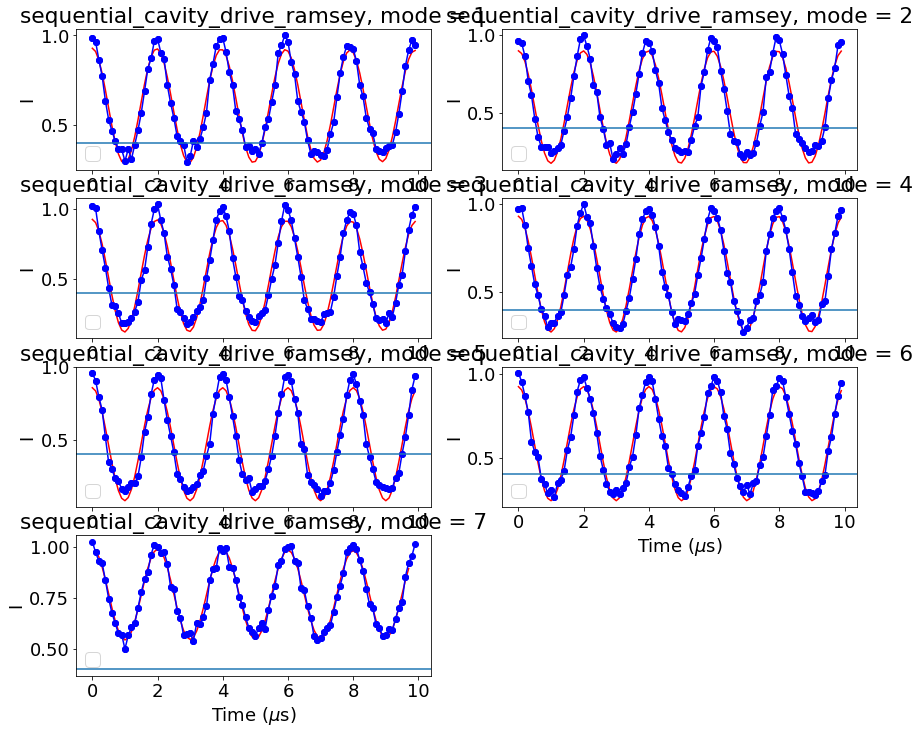

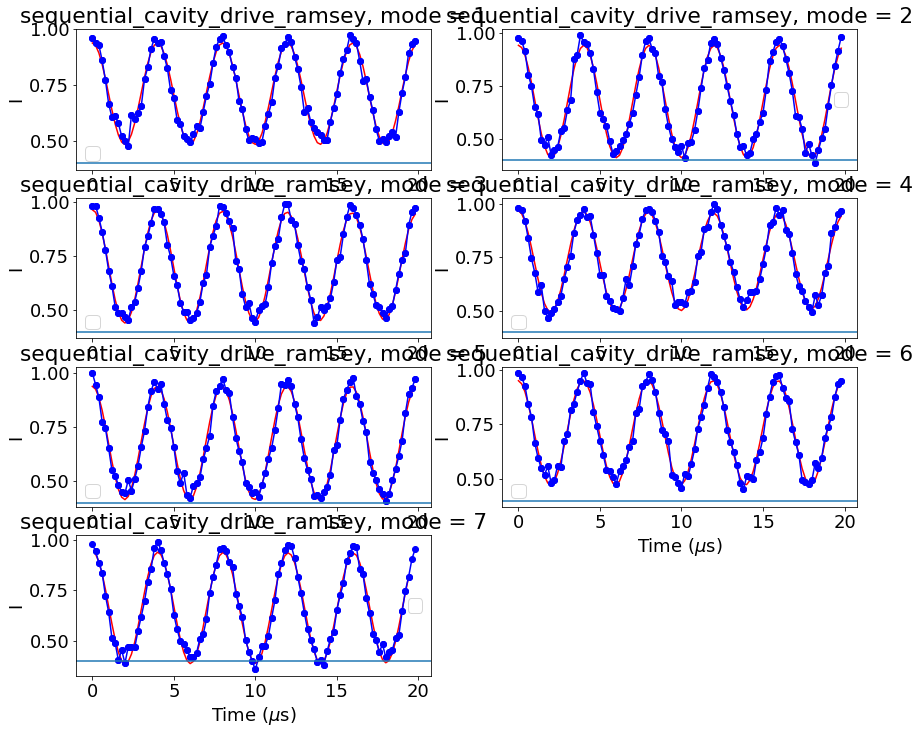

In [247]:
expt_name = 'sequential_cavity_drive_ramsey'
filelist = [0,1]
show = 'I'

offsets = []
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_amp'], expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
 
        fig = plt.figure(figsize=(14,15))
        for pp, y in enumerate(P):
            ax = fig.add_subplot(5,2,pp+1,title= expt_name+ ', mode = '+ str(swp_cfg['mode_indices'][pp]))
            nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][swp_cfg['mode_indices'][pp]]
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel(show)
            ax.legend()
            if pp == 6:
                p = fitdecaysin(t[5:-3],y[5:-3],fitparams = None,showfit=False)
                p = fitdecaysin(t[1:-2],y[1:-2],fitparams = None,showfit=True)
            else:
                p = fitdecaysin(t[1:],y[1:],fitparams = None,showfit=False)
                p = fitdecaysin(t[:],y[:],fitparams = p,showfit=True)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            alpha_new = nu_c + offset*1e-3
            offsets.append(offset)
            print("Original cavity frequency choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print("Suggested cavity frequency choice =",alpha_new,"GHz")
            print("T2* =",p[3],"us")
            print("=====================================================")
            ax.axhline(0.4)
        
        

0.3 600 7


No handles with labels found to put in legend.


Original cavity frequency choice = 5.716666946910838 GHz
Oscillation freq =  0.12527952681672821  MHz
Offset freq = -0.000279526816728215 MHz
Suggested cavity frequency choice = 5.716666667384021 GHz
T2* = -9532158998945.35 us


No handles with labels found to put in legend.


Original cavity frequency choice = 5.965217946855346 GHz
Oscillation freq =  0.12507087266127873  MHz
Offset freq = -7.087266127872582e-05 MHz
Suggested cavity frequency choice = 5.965217875982685 GHz
T2* = 379411122574.05597 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.223194676282811 GHz
Oscillation freq =  0.12503976680743273  MHz
Offset freq = -3.9766807432728424e-05 MHz
Suggested cavity frequency choice = 6.223194636516004 GHz
T2* = 822.2502590101565 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.469133763315642 GHz
Oscillation freq =  0.1258870502101114  MHz
Offset freq = -0.0008870502101114008 MHz
Suggested cavity frequency choice = 6.469132876265432 GHz
T2* = 848.4735151849246 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.7275143542668046 GHz
Oscillation freq =  0.12554326124963333  MHz
Offset freq = -0.0005432612496333311 MHz
Suggested cavity frequency choice = 6.727513811005555 GHz
T2* = 2973.5912478196155 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.989431863728926 GHz
Oscillation freq =  0.12660192438368198  MHz
Offset freq = -0.0016019243836819796 MHz
Suggested cavity frequency choice = 6.989430261804543 GHz
T2* = 1315.1093055736526 us


No handles with labels found to put in legend.


Original cavity frequency choice = 7.247043518170839 GHz
Oscillation freq =  0.12493526811938477  MHz
Offset freq = 6.473188061523194e-05 MHz
Suggested cavity frequency choice = 7.2470435829027195 GHz
T2* = 1391.2560182843965 us
0.3 370 6


No handles with labels found to put in legend.


Original cavity frequency choice = 6.469132876265432 GHz
Oscillation freq =  0.12547939473578373  MHz
Offset freq = -0.0004793947357837336 MHz
Suggested cavity frequency choice = 6.469132396870696 GHz
T2* = 33392723209211.074 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.727513811005555 GHz
Oscillation freq =  0.12469807148091491  MHz
Offset freq = 0.00030192851908508733 MHz
Suggested cavity frequency choice = 6.727514112934075 GHz
T2* = 350.043981713871 us


No handles with labels found to put in legend.


Original cavity frequency choice = 6.989430261804543 GHz
Oscillation freq =  0.1245513235576889  MHz
Offset freq = 0.0004486764423110995 MHz
Suggested cavity frequency choice = 6.989430710480986 GHz
T2* = 284.3772842556558 us
0.3 300 4


No handles with labels found to put in legend.


Original cavity frequency choice = 6.469132396870696 GHz
Oscillation freq =  0.12459460949283684  MHz
Offset freq = 0.00040539050716316416 MHz
Suggested cavity frequency choice = 6.469132802261203 GHz
T2* = 12604644.71813616 us


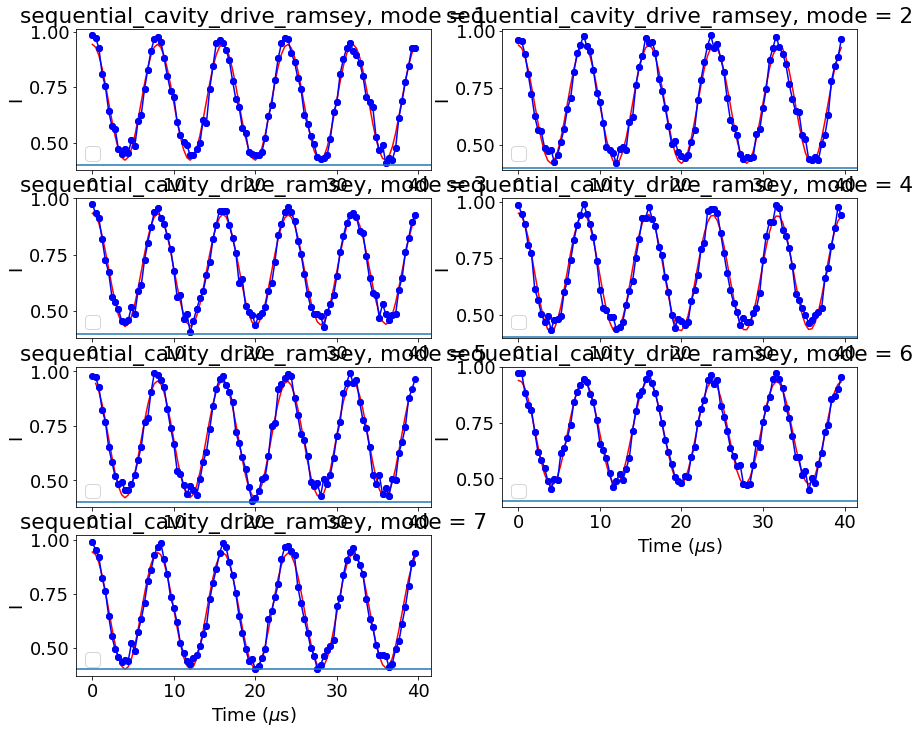

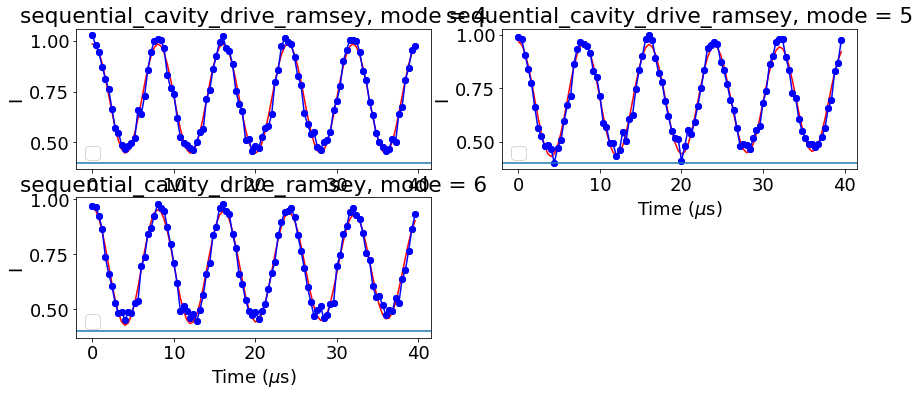

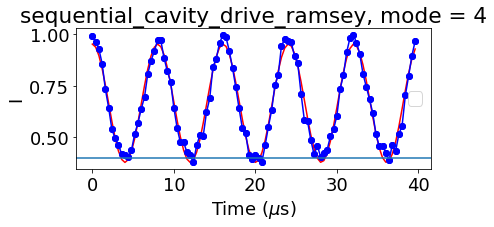

In [248]:
expt_name = 'sequential_cavity_drive_ramsey'
filelist = [2,3,4]
show = 'I'

offsets = []
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_amp'], expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
 
        fig = plt.figure(figsize=(14,15))
        for pp, y in enumerate(P):
            ax = fig.add_subplot(5,2,pp+1,title= expt_name+ ', mode = '+ str(swp_cfg['mode_indices'][pp]))
            nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][swp_cfg['mode_indices'][pp]]
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel(show)
            ax.legend()
            if i == 4:
                p = fitdecaysin(t[5:-3],y[5:-3],fitparams = None,showfit=False)
                p = fitdecaysin(t,y[:],fitparams = None,showfit=True)
            elif pp == 4:
                p = fitdecaysin(t[5:-3],y[5:-3],fitparams = None,showfit=False)
                p = fitdecaysin(t[1:-2],y[1:-2],fitparams = None,showfit=True)
            else:
                p = fitdecaysin(t[1:],y[1:],fitparams = None,showfit=False)
                p = fitdecaysin(t[:],y[:],fitparams = p,showfit=True)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            alpha_new = nu_c + offset*1e-3
            offsets.append(offset)
            print("Original cavity frequency choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print("Suggested cavity frequency choice =",alpha_new,"GHz")
            print("T2* =",p[3],"us")
            print("=====================================================")
            ax.axhline(0.4)
        
        

## find blockade cavity offset frequencies with ramsey again

#### all offsets being positive is odd...maybe because blockade cavity offset frequencies were not correct? check again with blockade cavity spectroscopy

39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.11777224424000499  MHz
Offset freq = 0.007227755759995014 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.24705081065848 GHz
T2* = -10104155469700.166 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.1186380663149717  MHz
Offset freq = 0.006361933685028298 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.247049944836404 GHz
T2* = 1258.4104051314857 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.11488483140232432  MHz
Offset freq = 0.01011516859767568 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.247053698071317 GHz
T2* = 1200.0364020759887 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.11471256149062983  MHz
Offset freq = 0.010287438509370167 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.247053870341229 GHz
T2* = 2049877024003.306 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.11525165088953995  MHz
Offset freq = 0.009748349110460047 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.24705333125183 GHz
T2* = -972182465.0973202 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.11240368843381833  MHz
Offset freq = 0.01259631156618167 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.247056179214286 GHz
T2* = -72985299175011.81 us
39.9 0.7
ramsey freq 0.125


No handles with labels found to put in legend.


blockade cavity freq choice = 7.2470435829027195 GHz
Oscillation freq =  0.1117425766190557  MHz
Offset freq = 0.013257423380944294 MHz
ramsey-freq  =  0.125
actual cavity freq = 7.247056840326101 GHz
T2* = -1475868846853107.2 us


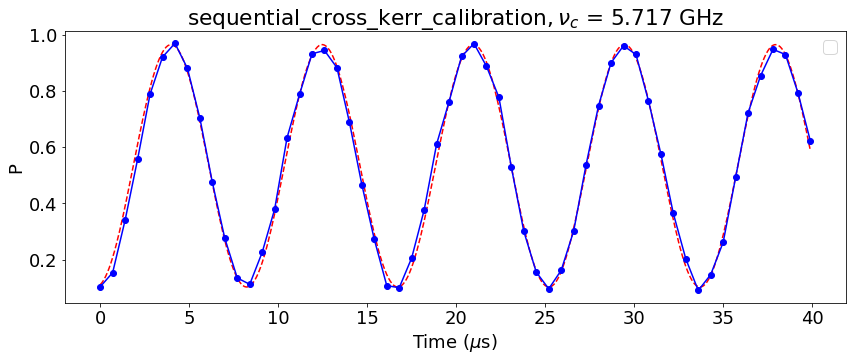

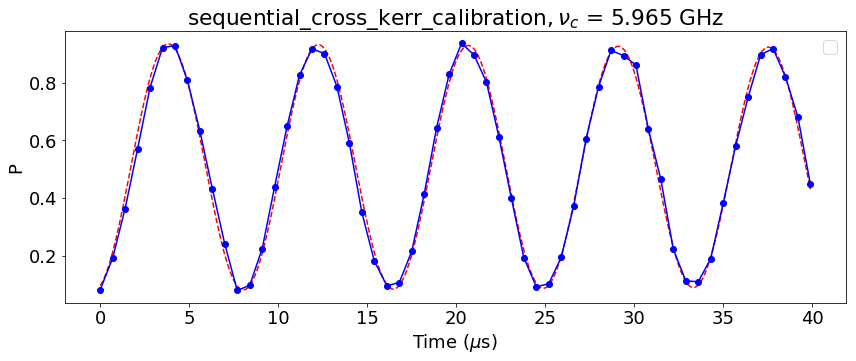

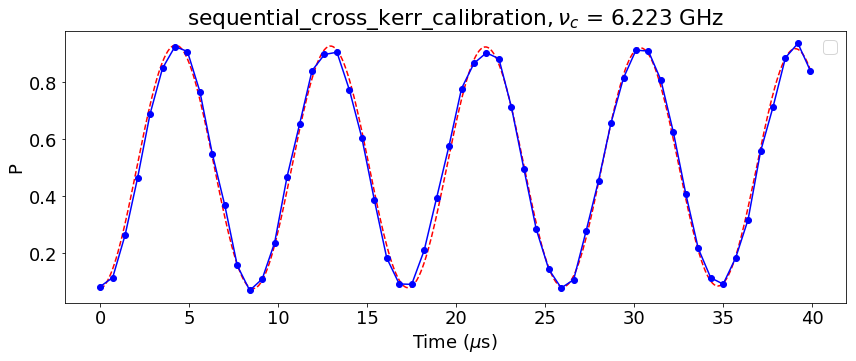

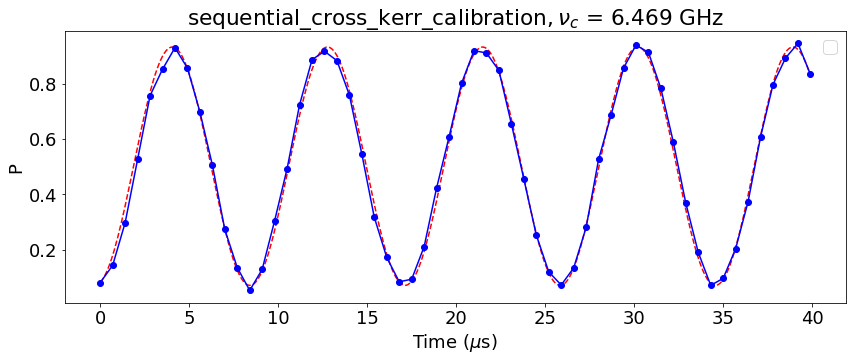

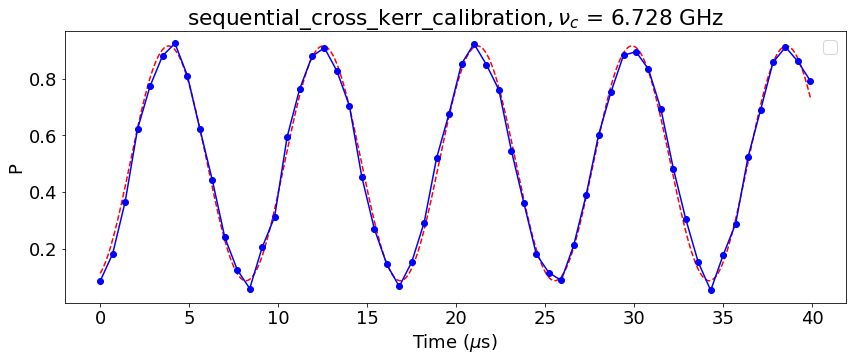

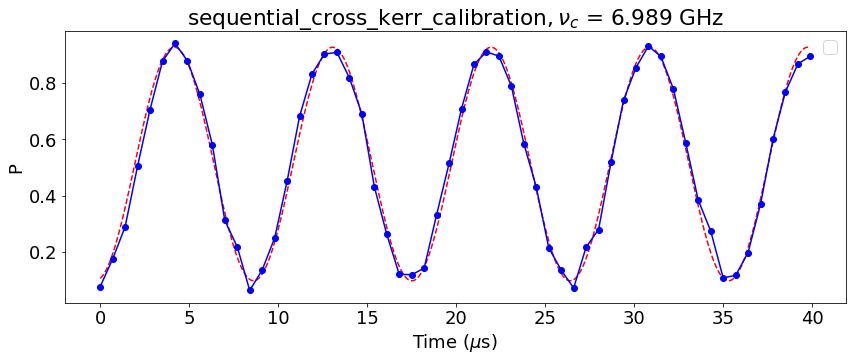

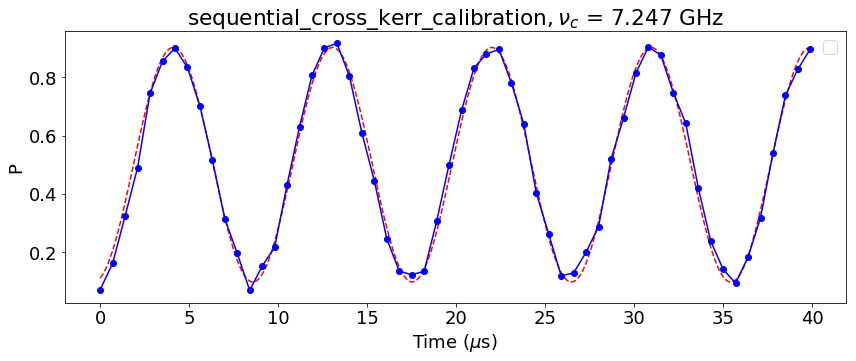

In [227]:
expt_name = 'sequential_cross_kerr_calibration'
filelist = [7]
show = 'I'
cav_nus_from_ramsey = []
offsets_from_ramsey = []
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))['sequential_cross_kerr_calibration_with_ramsey']
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_blockade_ramsey']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        
        P = array(a[show])
        
        for jj, y in enumerate(P):
            t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(y))]/1e3
            print (t[-1],t[1]-t[0])
            print ('ramsey freq',ramsey_freq)

            fig = plt.figure(figsize=(14,5))
            ax = fig.add_subplot(111,title= expt_name+ '$, \\nu_c$ = '+ str(
                around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz')
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel('P')
            ax.legend()

            p = fitdecaysin(t[1:-1],y[1:-1],fitparams = None,showfit=False)
            f = fitdecaysin(t[2:],y[2:],fitparams = p,showfit=False)
            p,err = optimize.curve_fit(decaysinb,t,y,p0=[f[0],f[1],f[2],f[3],f[4]])
            t2 = arange(0,expt_cfg['stop']/1e3,0.1)
            plot(t2,decaysinb(t2,p[0],p[1],p[2],p[3],p[4]),'r--',alpha=1.0)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            nu_c_new = nu_c + offset*1e-3
            cav_nus_from_ramsey.append(nu_c_new)
            offsets_from_ramsey.append(offset)

            print("blockade cavity freq choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print ('ramsey-freq  = ',ramsey_freq)
            print("actual cavity freq =",nu_c_new,"GHz")
            print("T2* =",p[3],"us") 

0
=============== file num =  3  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: 0.51
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  False
offset =  -0.003642769746365304
new cavity offset freq (MHz) =  -0.003642769746365304
new cavity freq =  7.247039940132973
offset =  -0.004492277427030582
new cavity offset freq (MHz) =  -0.004492277427030582
new cavity freq =  7.247039090625292
offset =  -0.005182507452809744
new cavity offset freq (MHz) =  -0.005182507452809744
new cavity freq =  7.247038400395267
offset =  -0.006398552677507273
new cavity offset freq (MHz) =  -0.006398552677507273
new cavity freq =  7.247037184350042
offset =  -0.008172368562183778
new cavity offset freq (MHz) =  -0.008172368562183778
new cavity freq =  7.247035410534157
offset =  -0.008019888013386805
new cavity offset freq (MHz) =  -0.008019888013386805
new cavity freq =  7.247035563014706
offset =  -0.009280

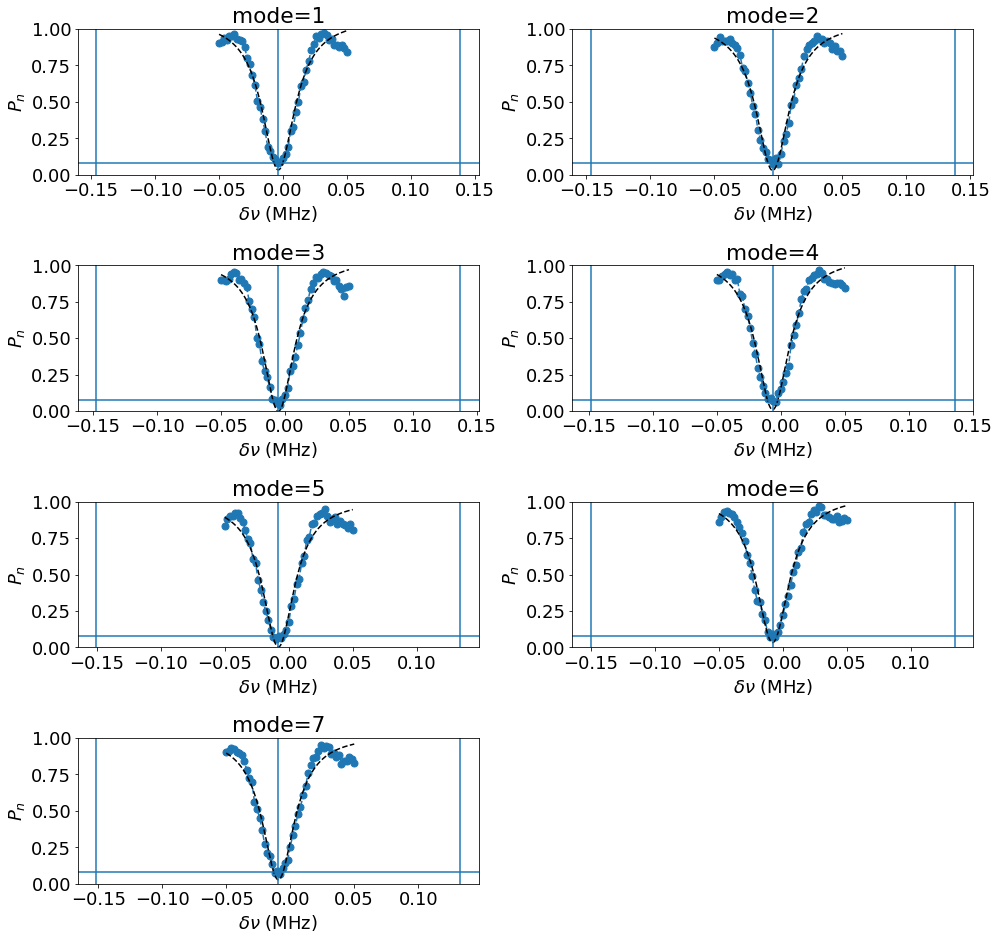

In [236]:
expt_name = 'sequential_blockade_experiments_cavity_spectroscopy'
filelist = [3]

offsets_from_spec = []
show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",expt_cfg['cavity_amp'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,16))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,2,ii+1,title= 'mode=' + 
                     str(swp_cfg['mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            offsets_from_spec.append(p[2])
plt.tight_layout()

11


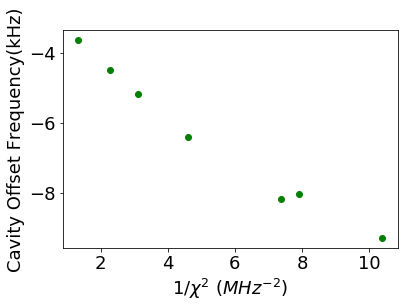

In [246]:
chis = array([-0.8681364155184741e-3, -0.6635472533740754e-3, -0.5658737384711832e-3, -0.4657193624777367e-3, -0.36830687624976916e-3,
                  -0.3558043967288626e-3, -0.3101284315425065e-3]) * 1e3
plt.plot(1.0/chis[:len(offsets_from_spec)]**2, array(offsets_from_spec)*1e3, 'go')
plt.xlabel("1/$\\chi^2$ $(MHz^{-2})$")
plt.ylabel("Cavity Offset Frequency(kHz)")
#plt.plot(1.0/chis[:len(offsets_from_ramsey)]**2, offsets_from_ramsey, 'ro')
print(len(offsets))

# Redo cross-Kerr calibrations

#### check that blockades are good now (probing 0 should give population flat line equal to quality of blockade, ~0.08), indeed looks like they are good

0
=============== file num =  4  ==========================
use weak drive for dressing: True
use weak drive for probe: True
dressing amp: 0.18
cavity drive amp: [0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51]
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
offset =  0.03800000096986689
new cavity offset freq (MHz) =  0.03800000096986689
new cavity freq =  5.716704667384991
offset =  0.05539137031172282
new cavity offset freq (MHz) =  0.05539137031172282
new cavity freq =  5.716722058754333
offset =  0.03937486979819335
new cavity offset freq (MHz) =  0.03937486979819335
new cavity freq =  5.716706042253819
offset =  0.008015192627049987
new cavity offset freq (MHz) =  0.008015192627049987
new cavity fr

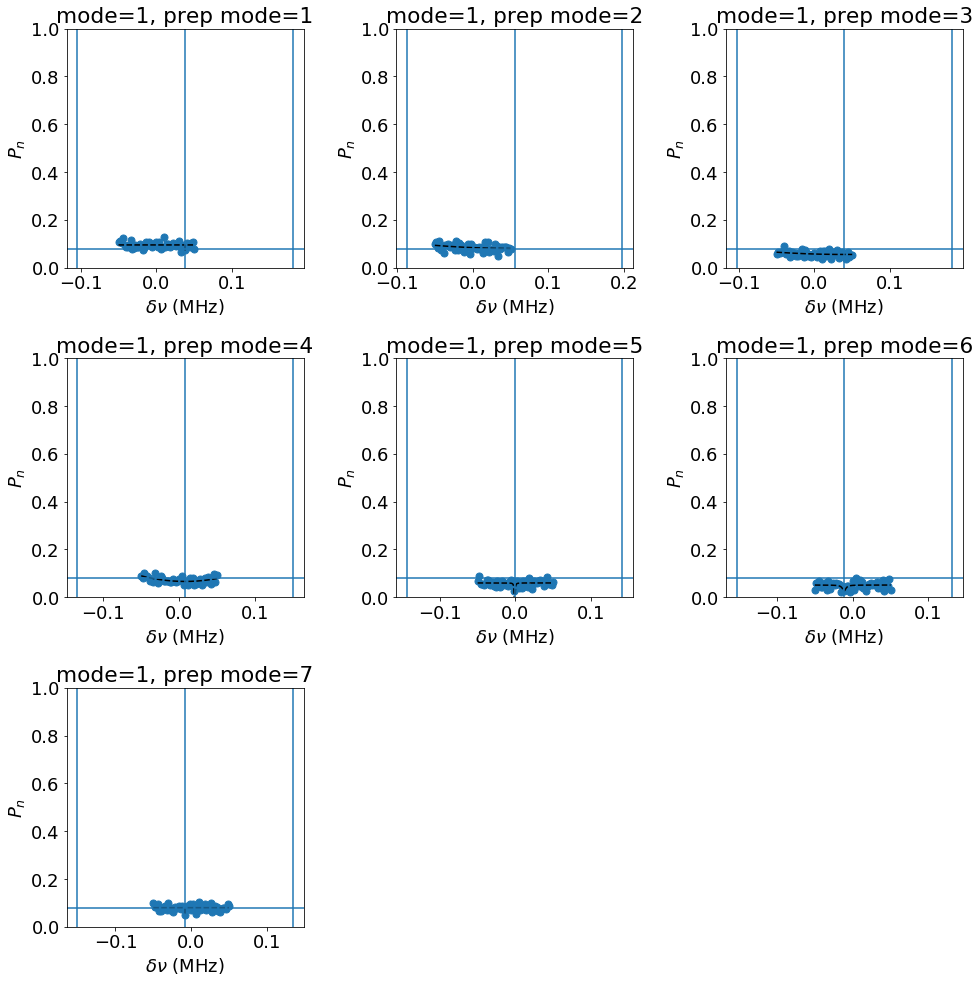

In [265]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [4]

cross_kerr_mat = np.zeros((10, 10))

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,14))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(3,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
plt.tight_layout()

0
=============== file num =  5  ==========================
use weak drive for dressing: True
use weak drive for probe: True 0
dressing amp: 0.18
cavity drive amp: [0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51]
cavity pulse len: 24800
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
offset =  -0.01789332146824616
new cavity offset freq (MHz) =  -0.01789332146824616
new cavity freq =  7.50901859441973
offset =  -0.03649601376272466
new cavity offset freq (MHz) =  -0.03649601376272466
new cavity freq =  7.508999991727435
0
=============== file num =  6  ==========================
use weak drive for dressing: True
u

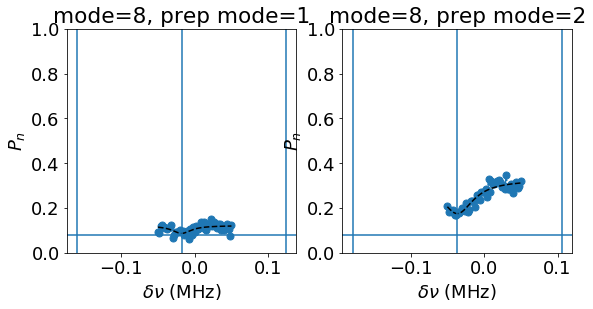

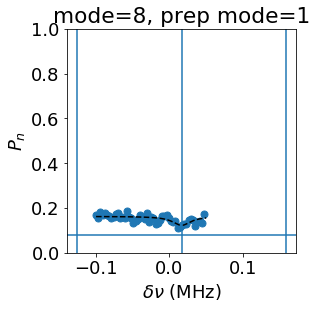

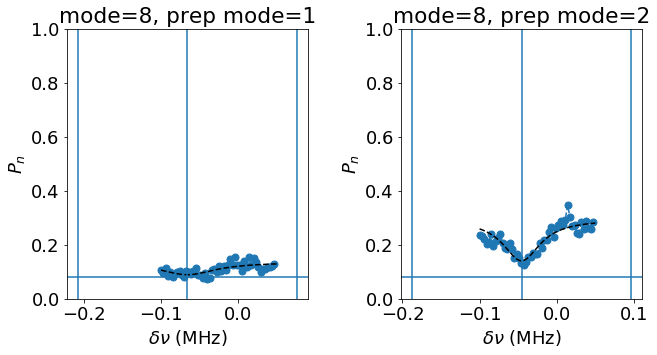

In [443]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [5,6,7]

cross_kerr_mat = np.zeros((10, 10))

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,14))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(3,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
plt.tight_layout()

### Debugging cross-Kerr experiment results

file 9 is prep 1 drive 8

file 10 is prep 2 drive 8


[array([4.99383592, 4.98936718, 4.98936689, 4.98602747])]
[array([4.98962769, 4.98903985, 4.98784306, 4.98732904])]


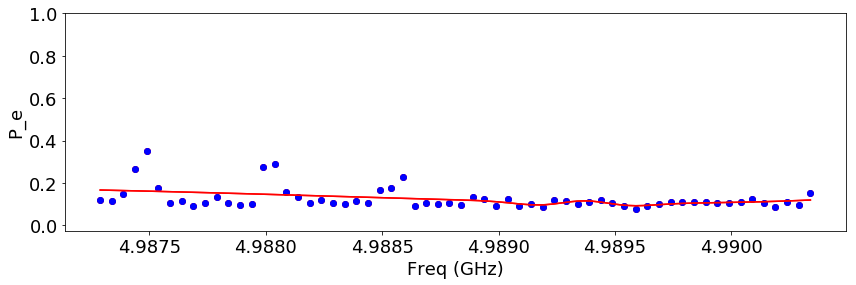

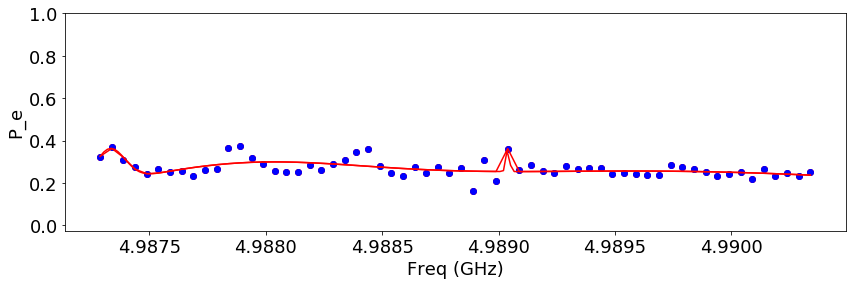

In [451]:
expt_name = 'multitone_blockaded_weak_cavity_pnrqs'
filelist = [9,10]

colors = ['r','m','y','g','b','c','k','orange', 'purple']
shows = ['I']

Ns = [4]
cals = []
for jj,i in enumerate(filelist):
    bl = []
    poplist = []
    nulist = []
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['multitone_blockaded_weak_cavity_pnrqs']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]

        chi = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e'][expt_cfg['mode_index']]
    
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']

        I,Q = array(a['I']),array(a['Q'])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:] + nu_q
        # modelist = swp_cfg['modelist']
        # states = swp_cfg['states_list']
        
        fig = plt.figure(figsize=(14,4))
        ax = fig.add_subplot(111)
        for ii,y in enumerate([I]):
            try:
                N = Ns[ii]
            except:N=1
            ax.plot(f,y,'o',color = colors[ii])
            p = 0*ones(3*N+1)
            for nn in range(N):
                p[3*nn+1] = 1
                p[3*nn+2] = nu_q + 2*chi*(nn+1)
                p[3*nn+3] = 0.0001
            pfit = fitgausssum(f,y,fitparams=p ,showfit=True)
            f2 = linspace(f[0],f[-1],200)
            ax.plot(f2, gaussfuncsum(pfit, f2), color=colors[ii])
            Y = abs(pfit[2::3])
            X = abs(pfit[1::3])
            pops = [x for y,x in sorted(zip(-Y,X))]
            nus = -sort(-Y)
            poplist.append(pops)
            nulist.append(nus)
            bl.append(pfit[0])
            ax.set_xlabel('Freq (GHz)')
            ax.set_ylabel('P_e')
#             for ii in range(5):
#                 ax.axvline(nu_q+2*ii*chi,color='r',linestyle='dashed',alpha=0.25)
            ax.set_ylim(-0.025,1)
            # ax.axvline(nu_q - 0.380e-3*2)
        print(nulist)
#         ax_end.axhline(0.9, linestyle='dashed')
#         ax_end.set_xlabel("Freq (GHz)")
#         ax_end.set_ylabel("P_e")
#     fitalphas = []
#     for pop in poplist:
#         ns = arange(len(pop))
#         color = next(ax._get_lines.prop_cycler)['color']
#         ax.plot(ns,pop,'o',color=color)

#         popt, pcov = curve_fit(coherent_state, ns, pop)
#         ns2 = linspace(0,14,100)
#         ax.plot(ns2, coherent_state(ns2, popt), '-',color=color, linewidth=1)
#         fitalphas.append(popt[0])
#     ax.set_xlabel('Photon #')
#     ax.set_ylabel('Populations')

#     ax = fig.add_subplot(len(I)+2,1,len(I)+2)
#     st = arange(len(fitalphas))
#     ax.plot(amps,fitalphas,'bo-')

#     ax.set_xlabel('amp')
#     ax.set_ylabel('$\\alpha$')
#     plt.tight_layout()
#     popt, pcov = curve_fit(proportional, amps, fitalphas)
#     print("proportional fit: ", popt)
#     ax.plot(amps, proportional(amps, popt))
#     cals.append(popt[0])

9.8 0.2
ramsey freq 0.4


No handles with labels found to put in legend.


blockade cavity freq choice = 7.509036487741198 GHz
Oscillation freq =  0.6564256194228212  MHz
Offset freq = -0.25642561942282116 MHz
ramsey-freq  =  0.4
actual cavity freq = 7.508780062121775 GHz
T2* = -48.54622526743658 us
9.8 0.2
ramsey freq 0.4


No handles with labels found to put in legend.


blockade cavity freq choice = 7.509036487741198 GHz
Oscillation freq =  0.23804449179202875  MHz
Offset freq = 0.16195550820797128 MHz
ramsey-freq  =  0.4
actual cavity freq = 7.509198443249406 GHz
T2* = -97.64242314343134 us
9.8 0.2
ramsey freq 0.4


No handles with labels found to put in legend.


blockade cavity freq choice = 7.509036487741198 GHz
Oscillation freq =  0.3898857266767124  MHz
Offset freq = 0.010114273323287626 MHz
ramsey-freq  =  0.4
actual cavity freq = 7.509046602014521 GHz
T2* = 52648758.13806191 us


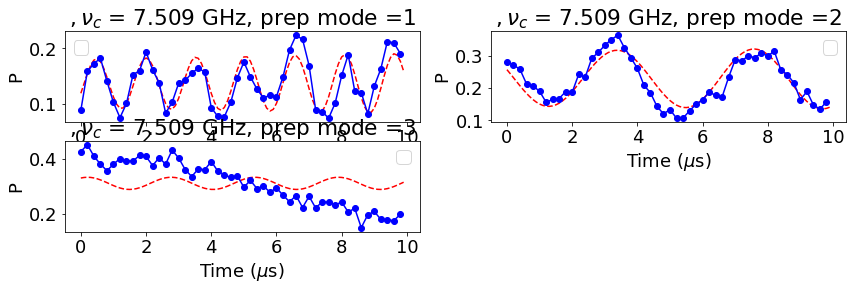

In [457]:
expt_name = 'sequential_cross_kerr_calibration_with_ramsey'
filelist = [0]
show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_blockade_ramsey']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        
        P = array(a[show])
        
        fig = plt.figure(figsize=(14,50))
        for jj, y in enumerate(P):
            t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(y))]/1e3
            print (t[-1],t[1]-t[0])
            print ('ramsey freq',ramsey_freq)

            if expt_cfg['prep_photon_with_blockade']:
                ax = fig.add_subplot(25,2,jj+1,title='$, \\nu_c$ = '+ str(
                    around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz, prep mode =' + str(swp_cfg['prep_mode_indices'][jj]))
            else:
                ax = fig.add_subplot(25,2,jj+1,title='$, \\nu_c$ = '+ str(
                    around(quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][
                    swp_cfg['ramsey_mode_indices'][jj]],3)) + ' GHz')
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel('P')
            ax.legend()

            p = fitdecaysin(t[1:-1],y[1:-1],fitparams = None,showfit=False)
            f = fitdecaysin(t[2:],y[2:],fitparams = p,showfit=False)
            p,err = optimize.curve_fit(decaysinb,t,y,p0=[f[0],f[1],f[2],f[3],f[4]])
            t2 = arange(0,expt_cfg['stop']/1e3,0.1)
            plot(t2,decaysinb(t2,p[0],p[1],p[2],p[3],p[4]),'r--',alpha=1.0)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            nu_c_new = nu_c + offset*1e-3

            print("blockade cavity freq choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print ('ramsey-freq  = ',ramsey_freq)
            print("actual cavity freq =",nu_c_new,"GHz")
            print("T2* =",p[3],"us") 

### offset frequencies without prepared photons

0
=============== file num =  14  ==========================
use weak drive for dressing: True
use weak drive for probe: True 0
dressing amp: 0.18
cavity drive amp: [0.15, 0.13, 0.175, 0.23, 0.145, 0.28, 0.51, 0.29, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29]
cavity pulse len: 24800
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  False
offset =  -0.004160840098683137
new cavity offset freq (MHz) =  -0.004160840098683137
new cavity freq =  7.5090323269010995
offset =  -0.005107397315118618
new cavity offset freq (MHz) =  -0.005107397315118618
new cavity freq =  7.509031380343883
offset =  -0.0053282118618815195
new 

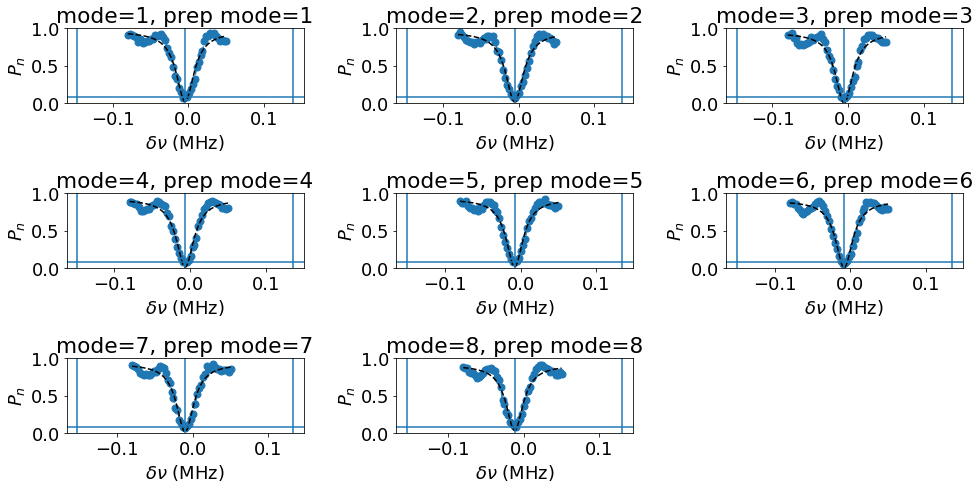

In [478]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [14]

cross_kerr_mat = np.zeros((10, 10))

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,50))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(22,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,-y,showfit=False)
            plot(ts,-lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
fig.tight_layout()

### offset frequencies with prepared photons

0
=============== file num =  11  ==========================
use weak drive for dressing: True
use weak drive for probe: True 0
dressing amp: 0.18
cavity drive amp: [0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29]
cavity pulse len: 24800
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
offset =  -0.0005985007709445686
new cavity offset freq (MHz) =  -0.0005985007709445686
new cavity freq =  7.247042984401949
offset =  -0.029421820434071252
new cavity offset freq (MHz) =  -0.029421820434071252
new cavity freq =  7.247014161082285
offset =  -0.015561654487166692
new cavity offset freq (MHz) =  -0.015561654487166692
n

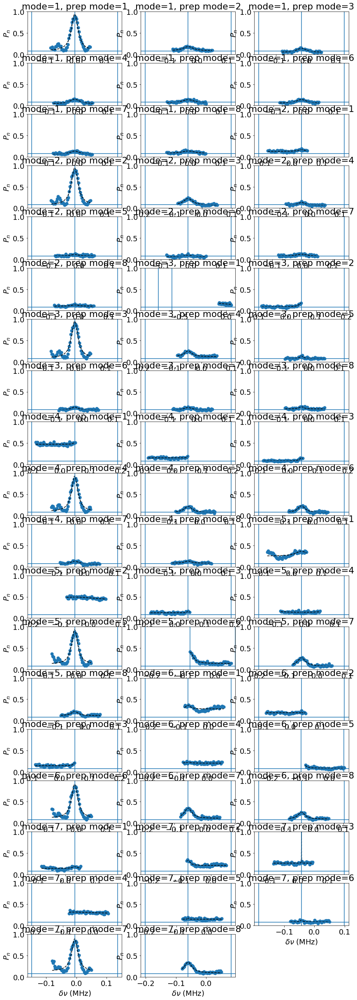

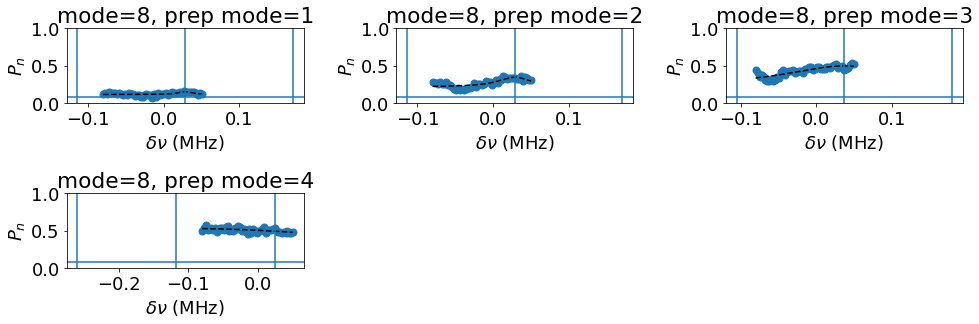

In [474]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [11,12]

cross_kerr_mat = np.zeros((10, 10))

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,50))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(22,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
fig.tight_layout()

# Chi EF's

No handles with labels found to put in legend.


Offset freq = 1.056256990402305 MHz
Suggested ef chi shift = 2 pi x -0.6657499248894587 MHz
257.2356517971412


No handles with labels found to put in legend.


Offset freq = 0.38627917890546704 MHz
Suggested ef chi shift = 2 pi x -0.6749968260657405 MHz
191.29816618693724


No handles with labels found to put in legend.


Offset freq = 0.2849426123992926 MHz
Suggested ef chi shift = 2 pi x -0.5210759471744292 MHz
184.1581700200633


No handles with labels found to put in legend.


Offset freq = 0.13917886826547277 MHz
Suggested ef chi shift = 2 pi x -0.49628430433844684 MHz
174.77499535136891


No handles with labels found to put in legend.


Offset freq = 0.08735295474813749 MHz
Suggested ef chi shift = 2 pi x -0.42204288510366794 MHz
171.6651527740341


No handles with labels found to put in legend.


Offset freq = 0.026589031357646554 MHz
Suggested ef chi shift = 2 pi x -0.3550123605709459 MHz
168.15704430803854


No handles with labels found to put in legend.


Offset freq = 0.015683478956556984 MHz
Suggested ef chi shift = 2 pi x -0.34796265725058406 MHz
167.5425500191846


No handles with labels found to put in legend.


Offset freq = -0.0031053414141332843 MHz
Suggested ef chi shift = 2 pi x -0.3116811022495731 MHz
166.49432609132347


No handles with labels found to put in legend.


Offset freq = -0.03363537075631298 MHz
Suggested ef chi shift = 2 pi x -0.2865175912152289 MHz
164.8187533742216


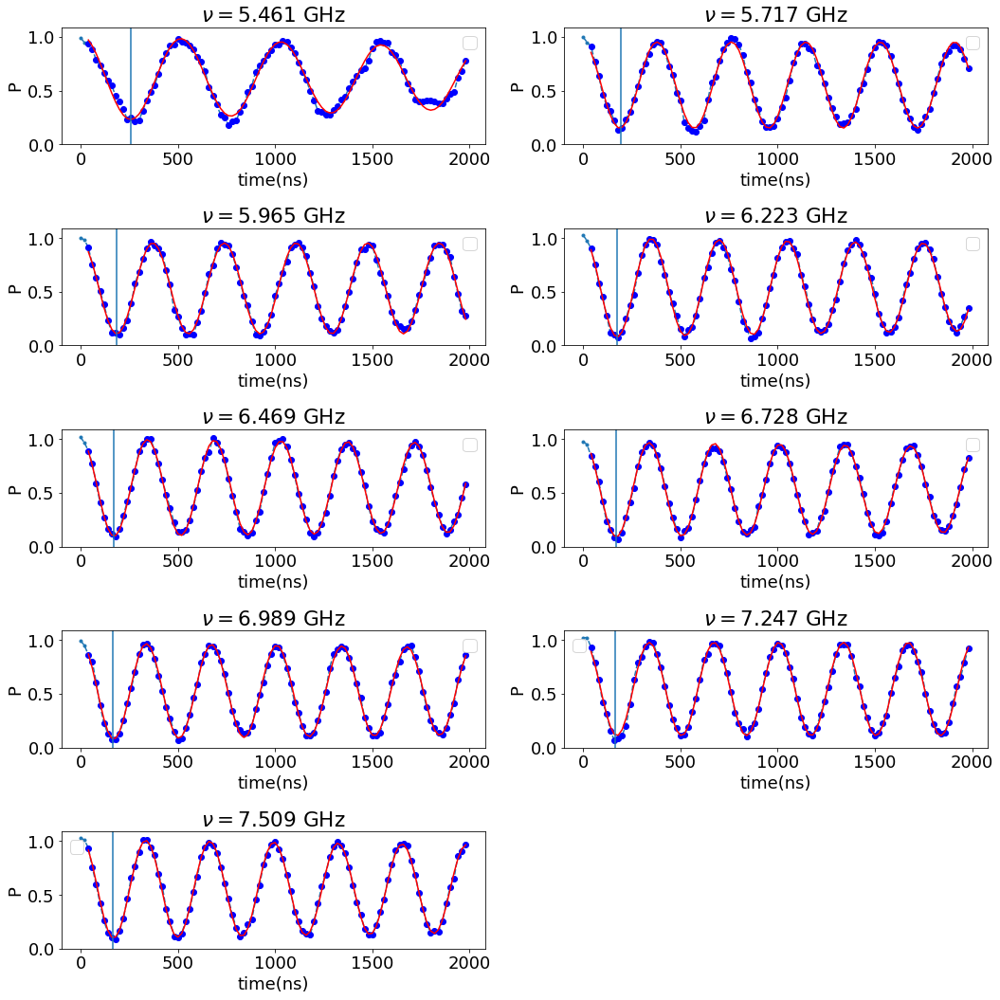

In [356]:
expt_name = 'sequential_sideband_chi_ef_calibration'
filelist = [2]
chiefs = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ef_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        alpha_fh = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity_fh']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time(ns)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_ef'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ef chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chief = suggested_chi_shift
            chiefs.append(chief)
#             gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


No handles with labels found to put in legend.


Offset freq = 0.008050410698867607 MHz
Suggested ef chi shift = 2 pi x -0.6617247946505662 MHz
1016.3643000704687


No handles with labels found to put in legend.


Offset freq = 0.0013169598084910531 MHz
Suggested ef chi shift = 2 pi x -0.6743415200957545 MHz
1002.6408754706904


No handles with labels found to put in legend.


Offset freq = 0.0021903308331784567 MHz
Suggested ef chi shift = 2 pi x -0.5199848345834108 MHz
1004.3999362986348


No handles with labels found to put in legend.


Offset freq = 0.00040332137998897594 MHz
Suggested ef chi shift = 2 pi x -0.4960783393100055 MHz
1000.8072939578042


No handles with labels found to put in legend.


Offset freq = -0.0038936466371170464 MHz
Suggested ef chi shift = 2 pi x -0.4239868233185585 MHz
992.2728800747886


No handles with labels found to put in legend.


Offset freq = -0.0008937223265160577 MHz
Suggested ef chi shift = 2 pi x -0.35545686116325803 MHz
998.2157446047338


No handles with labels found to put in legend.


Offset freq = 0.006489456725900411 MHz
Suggested ef chi shift = 2 pi x -0.3447152716370498 MHz
1013.149580721918


No handles with labels found to put in legend.


Offset freq = 0.0032845500433248973 MHz
Suggested ef chi shift = 2 pi x -0.31003772497833754 MHz
1006.6125385139749


No handles with labels found to put in legend.


Offset freq = 0.0018922277829500284 MHz
Suggested ef chi shift = 2 pi x -0.285573886108525 MHz
1003.7988320770982


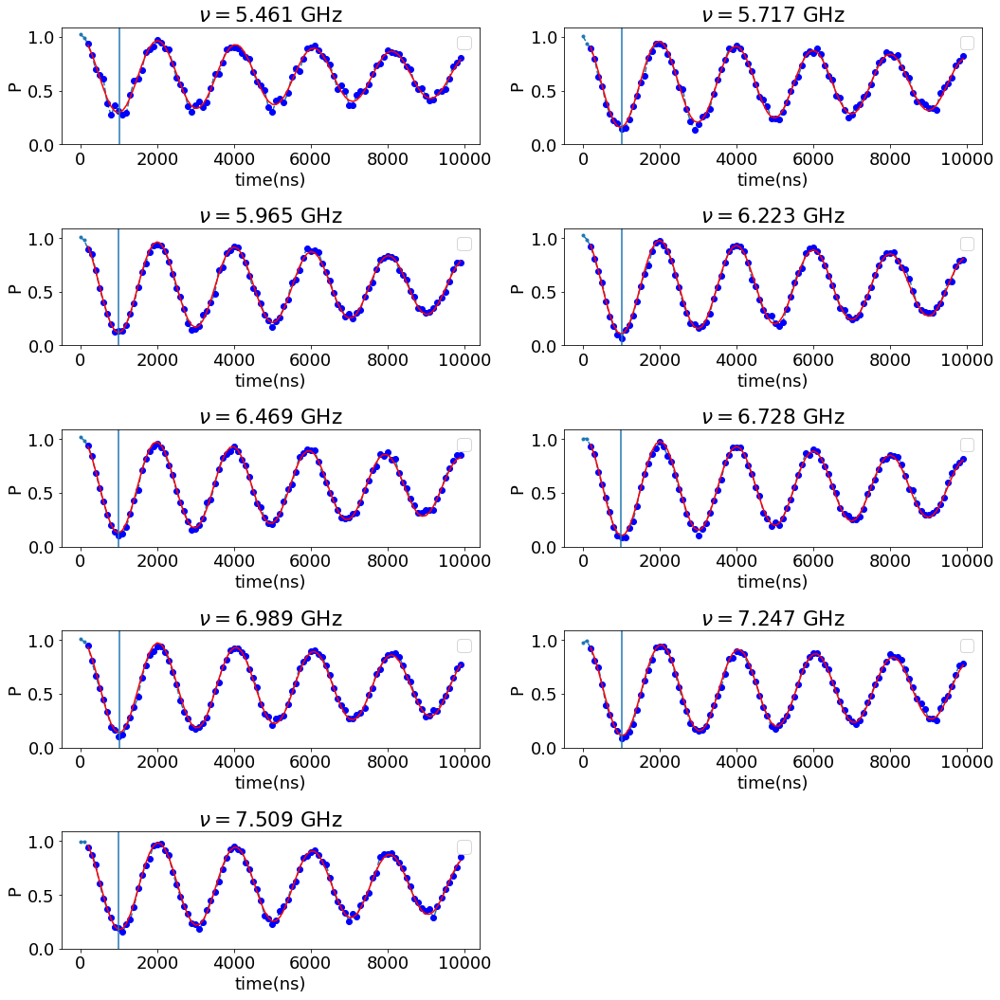

In [401]:
expt_name = 'sequential_sideband_chi_ef_calibration'
filelist = [3]
chiefs = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ef_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        alpha_fh = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity_fh']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time(ns)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_ef'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ef chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chief = suggested_chi_shift
            chiefs.append(chief)
#             gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


In [403]:
chiefs

[-0.0006617247946505662,
 -0.0006743415200957545,
 -0.0005199848345834109,
 -0.0004960783393100055,
 -0.0004239868233185585,
 -0.00035545686116325803,
 -0.0003447152716370498,
 -0.00031003772497833755,
 -0.000285573886108525]

# Chi GF's

No handles with labels found to put in legend.


Offset freq = 0.0009370844144308572 MHz
Suggested gf chi shift = 2 pi x -1.8576014577927846 MHz
1001.8776879330561


No handles with labels found to put in legend.


Offset freq = 0.002655113936090984 MHz
Suggested gf chi shift = 2 pi x -1.5440124430319546 MHz
1005.3385769322051


No handles with labels found to put in legend.


Offset freq = 0.0017724306639355395 MHz
Suggested gf chi shift = 2 pi x -1.1856837846680321 MHz
1003.5574720730477


No handles with labels found to put in legend.


Offset freq = 0.002670091480230373 MHz
Suggested gf chi shift = 2 pi x -1.0635549542598848 MHz
1005.3688536210852


No handles with labels found to put in legend.


Offset freq = 0.0008492293075411947 MHz
Suggested gf chi shift = 2 pi x -0.8898853853462293 MHz
1001.7013482847339


No handles with labels found to put in legend.


Offset freq = 0.0003075825417681423 MHz
Suggested gf chi shift = 2 pi x -0.724466208729116 MHz
1000.6155437445553


No handles with labels found to put in legend.


Offset freq = -0.0010214274198852135 MHz
Suggested gf chi shift = 2 pi x -0.7028207137099427 MHz
997.9613099081505


No handles with labels found to put in legend.


Offset freq = -0.0013654904721547775 MHz
Suggested gf chi shift = 2 pi x -0.6216227452360773 MHz
997.2764569997252


No handles with labels found to put in legend.


Offset freq = -0.0009000336917000052 MHz
Suggested gf chi shift = 2 pi x -0.55675001684585 MHz
998.2031670370101


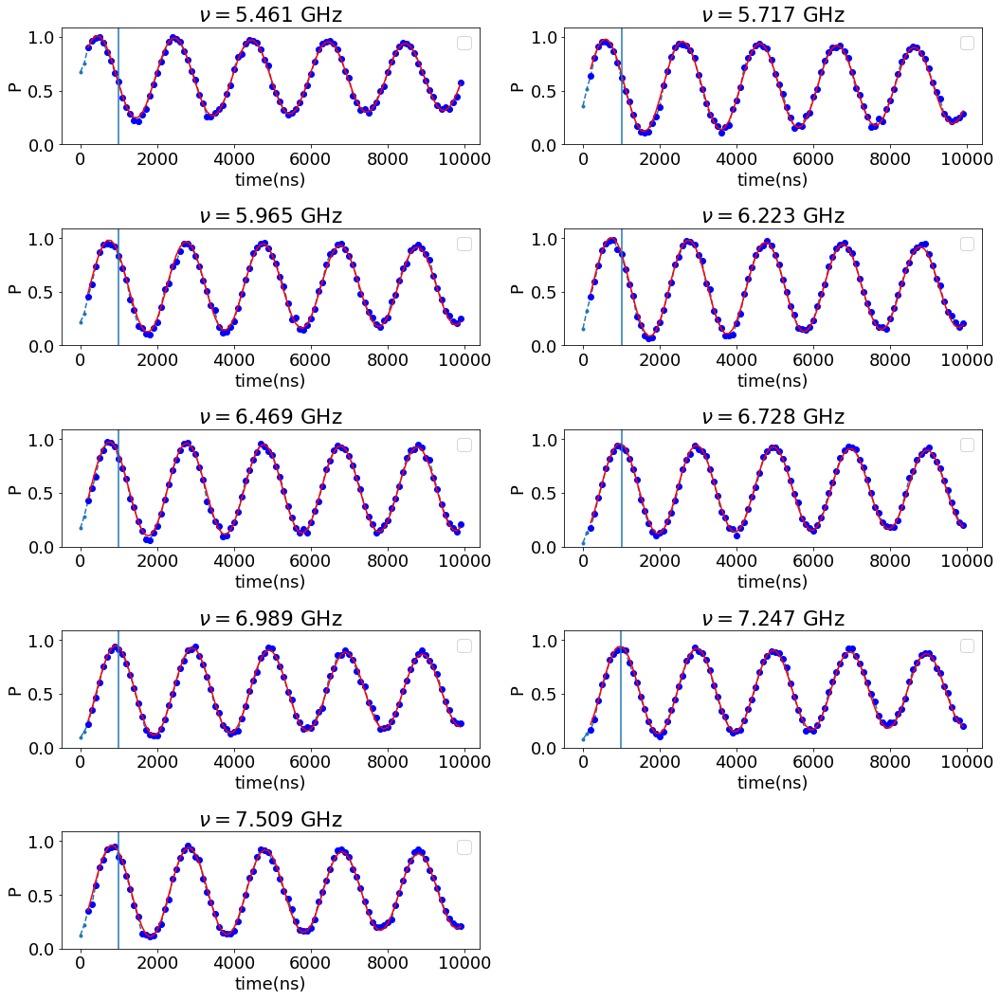

In [402]:
expt_name = 'sequential_sideband_chi_gf_calibration'
filelist = [2]
chigfs = []
gs = []

show = 'I'
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        fig = plt.figure(figsize=(15,15))
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ef_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        alpha_fh = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity_fh']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        f0g1freqs = quantum_device_cfg['flux_pulse_info']['1']['f0g1_freq']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            ax  = fig.add_subplot(5,2,pp+1,title="$\\nu = $"+ str(around(nu_cs[modelist[pp]],3))+ " GHz")
            ax.plot(t,y,'.--')

            ax.set_xlabel('time(ns)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()

            p = fitdecaysin(t[2:],y[2:],showfit=True)

            offset = ramsey_freq - p[1]

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_f'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested gf chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
            axvline(1/p[1]/2)
            print (1/p[1]/2)
            chigf = suggested_chi_shift
            chigfs.append(chigf)
#             gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


In [404]:
chigfs

[-0.0018576014577927845,
 -0.0015440124430319546,
 -0.0011856837846680322,
 -0.0010635549542598848,
 -0.0008898853853462293,
 -0.000724466208729116,
 -0.0007028207137099427,
 -0.0006216227452360773,
 -0.00055675001684585]

In [346]:
def gfromchi(chi,alpha,delta):
    return sqrt(chi*delta*(delta+alpha)/alpha)


def chif_fromg(g,alpha,alpha_fh,delta):
#     return (g**2/(delta) - 2*g**2/(delta+alpha) +3*g**2/(delta+alpha) - 3*g**2/(delta+alpha+alpha_fh))
    return (g**2/(delta))



def chief_fromg(g,alpha,alpha_fh,delta):
    return (2*g**2/(delta+alpha) -g**2/delta/2.0 -3*g**2/(delta+alpha+alpha_fh)/2.0)

def gfromchief(chi,alpha,alpha_fh,delta):
    return sqrt(chi/(2/(delta+alpha) -1/delta/2.0 -3/(delta+alpha+alpha_fh)/2.0))



In [347]:
delta_ge = nu_q-array(nu_cav)

No handles with labels found to put in legend.


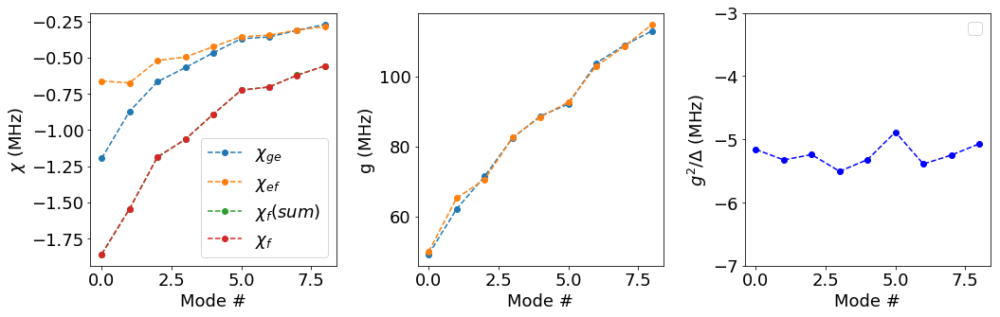

In [413]:
chiges = array(chiges)
chiefs = array(chiefs)
chifs = chiefs + chiges[:len(chiefs)]
chigfs = array(chigfs)
gs = array([gfromchi(chi,alpha,delta_ge[ii]) for ii,chi in enumerate(chiges)])
gs2 = array([gfromchief(chi,alpha,alpha_fh,delta_ge[ii]) for ii,chi in enumerate(chiefs)])
chiefs_g = array([chief_fromg(g,alpha,alpha_fh,delta_ge[ii]) for ii,g in enumerate(gs)])
delta_ge = nu_q-array(nu_cav[:len(chiges)])
fig = plt.figure(figsize = (15,5))
ax1 = fig.add_subplot(131)

ax1.plot(np.arange(len(chiges)), chiges*1e3,'o--',label = "$\chi_{ge}$")
ax1.plot(np.arange(len(chiefs)), chiefs*1e3,'o--',label = "$\chi_{ef}$")
ax1.plot(np.arange(len(chifs)), chifs*1e3,'o--',label = "$\chi_{f} (sum)$")
ax1.plot(np.arange(len(chigfs)), chigfs*1e3,'o--',label = "$\chi_{f}$")
# ax1.plot(np.arange(len(chiges)), chifs_g*1e3,'o--',label = "$\chi_{ef} (theory)$")
ax1.set_xlabel('Mode #')
ax1.set_ylabel('$\chi$ (MHz)')
ax1.legend()


ax2 = fig.add_subplot(132)

ax2.plot(np.arange(len(chiges)), gs*1e3,'o--',label = 'from $\chi_{ge}$')
ax2.plot(np.arange(len(chiefs)), gs2*1e3,'o--',label = 'from $\chi_{ef}$')

ax2.set_xlabel('Mode #')
ax2.set_ylabel('g (MHz)')

ax2 = fig.add_subplot(133)

ax2.plot(np.arange(len(chiges)), 1e3*gs**2/delta_ge,'bo--')

ax2.set_xlabel('Mode #')
ax2.set_ylabel('$g^2/\Delta$ (MHz)')

ax2.set_ylim(-7,-3)
ax2.legend()

plt.tight_layout()


# joint parity measurement

sequence - $\pi/2 (ge)$ +Idle(t1) + $\pi (ef)$ +Idle(t2) + $\pi (ef)$ +$-\pi/2 (ge)$ 


for joint parity measurements of neighbouring modes

\begin{eqnarray}
\chi_i^e t_1 + \chi_i^f t_2 &=& (2n_1+1)/4 \\
\chi_j^e t_1 + \chi_j^f t_2 &=& (2n_2+1)/4
\end{eqnarray}

In [412]:
chi_es = abs(chiges)*1e3
chi_fs = abs(chifs)*1e3 
def joint_parity_times(i,j,n1,n2):
    xf1,xf2,xe1,xe2 = chi_fs[i],chi_fs[j],chi_es[i],chi_es[j]
    t1 = (n2/4*xf1-n1/4*xf2)/((xe2*xf1-xe1*xf2))
    t2 = (n2/4*xe1-n1/4*xe2)/((xf2*xe1-xf1*xe2))
    print ('den = ',(xe2*xf1-xe1*xf2))
    return (t1,t2)
    
    
for i in range(1,7):
    print (joint_parity_times(i,i+1,2,1))

den =  -0.003399979993229607
(60.868195232604165, -33.983614308661664)
den =  -0.03490761187792302
(6.754998532951861, -3.3734162745618175)
den =  -0.00983668464914017
(18.190212623423896, -9.246769789819616)
den =  -0.009235878284614807
(15.129462954538571, -7.362824791768427)
den =  -0.00014755454665910106
(1152.1099610599083, -586.2621277118292)
den =  -0.0036944603328718517
(36.512281077836604, -17.87896568738708)


## S@#&, this might ot work either...

might have to go back to drying chi dressing..

In [414]:
chi_efs = abs(chiefs)*1e3
chi_fs = abs(chifs)*1e3 
def joint_parity_times(i,j,n1,n2):
    xf1,xf2,xe1,xe2 = chi_fs[i],chi_fs[j],chi_efs[i],chi_efs[j]
    t1 = (n2/4*xf1-n1/4*xf2)/((xe2*xf1-xe1*xf2))
    t2 = (n2/4*xe1-n1/4*xe2)/((xf2*xe1-xf1*xe2))
    print ('den = ',(xe2*xf1-xe1*xf2))
    return (t1,t2)
    
    
for i in range(1,7):
    print (joint_parity_times(i+1,i,1,3))

den =  -0.003399979993229496
(-148.11677964949402, 65.11898492182537)
den =  -0.03490761187792324
(-14.381477112197917, 6.934377140526763)
den =  -0.009836684649140282
(-40.81742674052736, 19.719096380544276)
den =  -0.009235878284614751
(-34.743766919640315, 17.388269430783506)
den =  -0.00014755454665912882
(-2342.0237760367363, 1149.8950203746613)
den =  -0.003694460332871796
(-78.53064636852237, 39.61322159080528)


Text(0, 0.5, 't2 ($\\mu s$)')

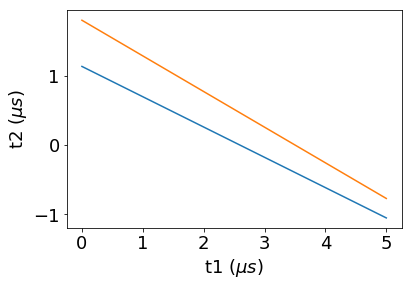

In [418]:
i,j = 1,8
n1,n2 = 7,4

xf1,xf2,xe1,xe2 = chi_fs[i],chi_fs[j],chi_efs[i],chi_efs[j]

t1 = linspace(0,5,100)
t2 = (n1/4-xe1*t1)/xf1

plot(t1,t2)

t2 = (n2/4-xe2*t1)/xf2
plot(t1,t2)
xlabel('t1 ($\\mu s$)')
ylabel('t2 ($\\mu s$)')
# ylim(0,1)

In [423]:
chiges

array([-0.00119634, -0.000871  , -0.00066659, -0.00056881, -0.00046632,
       -0.00036916, -0.00035759, -0.0003109 , -0.00027072])

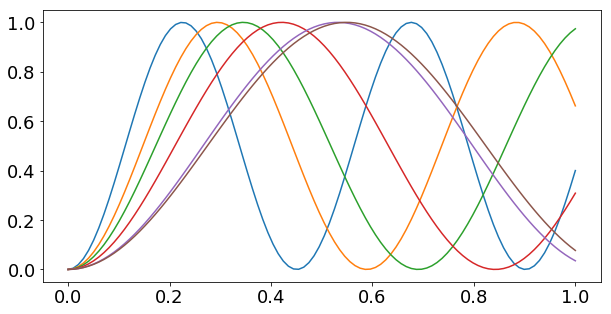

In [426]:
t = linspace(0,1,100)
fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot(111)
for chi in chiges[1:7]:
    ax.plot(t,sin(8*chi*1e3*t)**2)

{'stop': 1000.0, 'step': 10.0, 'singleshot': False, 'start': 0.0, 'ramsey_freq': 0.0, 'acquisition_num': 500, 'on_qubits': ['1'], 'pi_calibration': True, 'test_parity': True, 'mode_index': 8, 'add_photon_with_sideband': False, 'add_photon_with_blockade': True}


No handles with labels found to put in legend.


208.86282395732022
Offset freq = -2.3939157315146318 MHz
Suggested ge chi shift = 2 pi x -2.3908362858479273 MHz


No handles with labels found to put in legend.


286.569552973935
Offset freq = -1.744777122381447 MHz
Suggested ge chi shift = 2 pi x -1.7405249767091977 MHz


No handles with labels found to put in legend.


376.86497069822065
Offset freq = -1.3267351409011194 MHz
Suggested ge chi shift = 2 pi x -1.326914823824635 MHz


No handles with labels found to put in legend.


437.8737272598405
Offset freq = -1.1418817089779238 MHz
Suggested ge chi shift = 2 pi x -1.1368145929601452 MHz


No handles with labels found to put in legend.


521.2945233836289
Offset freq = -0.9591506865535245 MHz
Suggested ge chi shift = 2 pi x -0.9452947057544989 MHz


No handles with labels found to put in legend.


675.7216248398439
Offset freq = -0.7399496798974096 MHz
Suggested ge chi shift = 2 pi x -0.7382817161984739 MHz


No handles with labels found to put in legend.


680.9704672131128
Offset freq = -0.734246232507353 MHz
Suggested ge chi shift = 2 pi x -0.7229275129825391 MHz


No handles with labels found to put in legend.


800.0939861759231
Offset freq = -0.6249265819254153 MHz
Suggested ge chi shift = 2 pi x -0.6225917225052141 MHz


No handles with labels found to put in legend.


894.7895719113267
Offset freq = -0.5587905980307399 MHz
Suggested ge chi shift = 2 pi x -0.5490952048524423 MHz


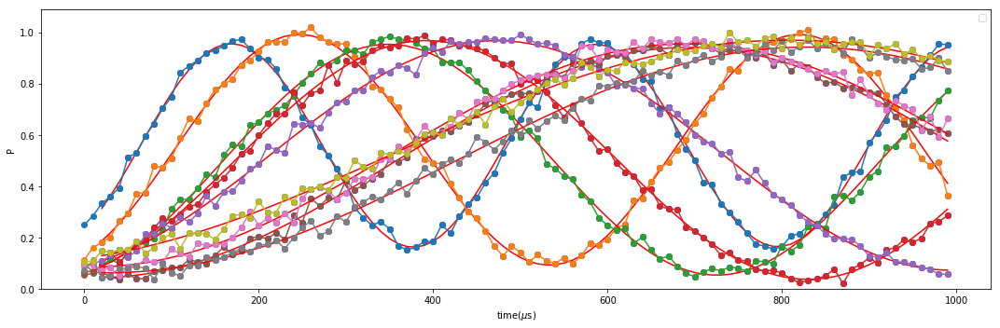

In [52]:
expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [5]
paritytimes = []
gs = []

show = 'I'
fig = plt.figure(figsize=(15,5))
ax  = fig.add_subplot(111)
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        chiges = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        #numms = 2*nu_q+alpha - array(f0g1freqs)
        #deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P):
            chi = abs(chiges[pp])

            ax.set_xlabel('time($\\mu$s)')
            ax.set_ylabel('P')
            ylim(0,1.09)

            ax.legend()
            
            p2 = [0.5,2*chi,0,60000,0.5]
            p = fitdecaysin(t[2:],y[2:],fitparams = p2,showfit=True)

            offset = ramsey_freq - p[1]
            pi_time = 1/(2*p[1])
            print(pi_time)
            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
#             axvline(1/p[1]/2)
            ax.plot(t,y,'o-')
#             print (1/p[1]/2)
#             chige = suggested_chi_shift
#             chiges.append(chige)
#             gs.append(gfromchi(chige,alpha,deltas[ii]))
            tight_layout()


No handles with labels found to put in legend.


Offset freq = 1326.7351374731502 MHz
Suggested ge chi shift = 2 pi x 662.1736903164845 MHz


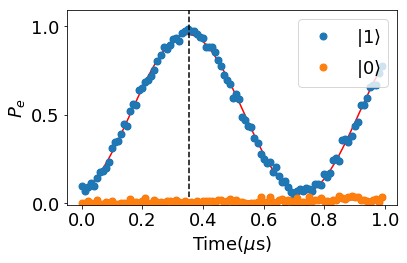

In [506]:
expt_name = 'sequential_sideband_chi_ge_calibration'
filelist = [5]
paritytimes = []
gs = []

show = 'I'
fig = plt.figure(figsize=(6,4))
ax  = fig.add_subplot(111)
for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        chiges = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        P = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])/1e3
        modelist = swp_cfg['modelist']
        for pp, y in enumerate(P[2:3]):
            chi = abs(chiges[pp])

            ax.set_xlabel('Time($\\mu$s)')
            ax.set_ylabel('$\Pi$')
            ylim(0,1.09)

            ax.legend()
            
            p2 = [0.5,2*chi,0,60000,0.5]
            p = fitdecaysin(t[2:],y[2:],fitparams = p2,showfit=True)

            offset = ramsey_freq - p[1]
            

            suggested_chi_shift = (2*quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e'][modelist[pp]] + offset)/2.0
            print("Offset freq =", offset * 1e3, "MHz")
            print("Suggested ge chi shift = 2 pi x",suggested_chi_shift* 1e3, "MHz")
    #             print("T2 =", p[3], "ns")
#             axvline(1/p[1]/2)
            ax.plot(t,y,'o',markersize = 7,label = '$\\left|1\\right\\rangle$')
#             print (1/p[1]/2)
#             chige = suggested_chi_shift
#             chiges.append(chige)
#             gs.append(gfromchi(chige,alpha,deltas[ii]))
            ax.legend()
            tight_layout()
            ax.axvline(0.355,color='k',linestyle='dashed')

        
        
expt_name = 'sideband_chi_ge_calibration'
filelist = [7]
paritytimes = []
gs = []


for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['sideband_chi_ge_calibration']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        nu_cs = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs']
        chiges = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        numms = 2*nu_q+alpha - array(f0g1freqs)
        deltas = nu_q-numms
        ramsey_freq = expt_cfg['ramsey_freq']

        y = array(a[show])
        t = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])/1e3



        ax.set_xlabel('Time($\\mu$s)')
        ax.set_ylabel('$P_e$')
        ylim(-0.01,1.09)

        ax.legend()

        p2 = [0.5,2*chi,0,60000,0.5]
        p = fitdecaysin(t[2:],y[2:],fitparams = p2,showfit=True)

        offset = ramsey_freq - p[1]



        ax.plot(t,y,'o',markersize = 7,label = '$\\left|0\\right\\rangle$')

        ax.legend()
        ax.set_yticks([0,0.5,1])
        tight_layout()


# 04-06-20 trying some cross-Kerr things

Old cavity freq: 5.716666667384021
Resonance frequency =  5.7166625656487655
Offset (MHz): -0.004101735255446215
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716667302241595
Offset (MHz): 0.0006348575736225825
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716667558307867
Offset (MHz): 0.0008909238458087998
prep mode index: 1
mode index: 1
Old cavity freq: 5.716666667384021
Resonance frequency =  5.7166693037880005
Offset (MHz): 0.0026364039795723215
prep mode index: 2
mode index: 1
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716651424449984
Offset (MHz): -0.015242934036763245
prep mode index: 2
mode index: 1
Old cavity freq: 5.716666667384021
Resonance frequency =  5.71665097282405
Offset (MHz): -0.01569455997074698
prep mode index: 1
mode index: 3
Old cavity freq: 6.223194636516004
Resonance frequency =  6.223184917686661
Offset (MHz): -0.0097188293430861
prep mode index: 1
mode index: 3
Old cavity freq: 6.223194636516004
Resonance frequenc

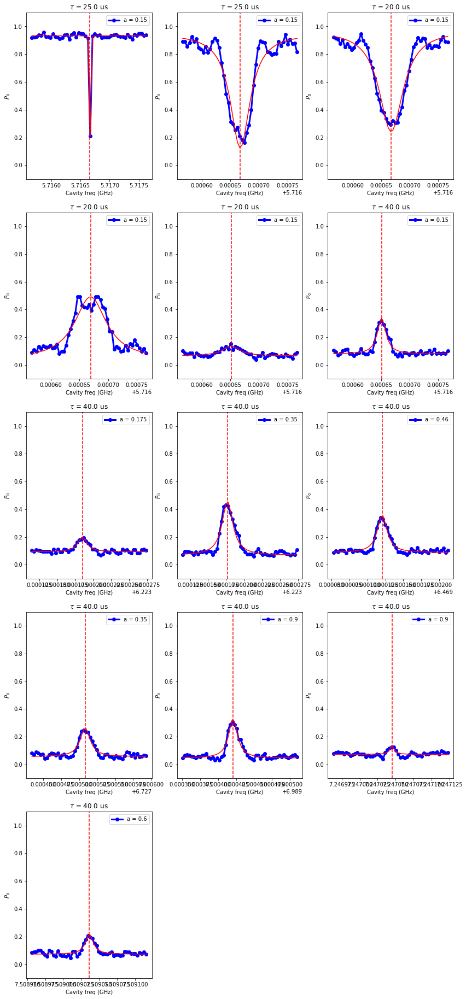

In [32]:
expt_name = 'cavity_spectroscopy_resolved_qubit_pulse'

filelist = [9,10,11,12,13,14,16,17,18,19,20,21,22]

nu_cav = []
offsets = []

fig = plt.figure(figsize=(14,5*len(filelist)/2))
show = 'I'

for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        ts  = datetime.fromtimestamp(os.path.getctime(filename)).strftime('%Y-%m-%d %H:%M:%S')
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][expt_cfg['mode_index']]
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        expt_cfg = experiment_cfg[expt_name]
        amp = expt_cfg['cavity_amp']
        length = expt_cfg['cavity_pulse_len']
        P = array(a[show])
        if expt_cfg['prep_state_before_blockade']:
            print("prep mode index:", expt_cfg['prep_mode_index'])
            print("mode index:", expt_cfg['mode_index'])
            P = -P

        ax = fig.add_subplot(len(filelist)/3+1,3,ii+1,title= '$\\tau$ = ' + str(length/1e3) +' us')


        df = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])[:(len(P))]
        freqs = nu_c + df
        if expt_cfg['prep_state_before_blockade']:
            ax.plot(freqs,-P,'bo-',label = 'a = '+str(amp),linewidth=3)
        else:
            ax.plot(freqs,P,'bo-',label = 'a = '+str(amp),linewidth=3)

        p = fitlor(freqs,-P,showfit=False)
        if expt_cfg['prep_state_before_blockade']:
            plot(freqs, lorfunc(p,freqs),'r-') 
        else:
            plot(freqs, -lorfunc(p,freqs),'r-')
        ax.set_xlabel('Cavity freq (GHz)')
        ax.set_ylabel('$P_0$')
        print("Old cavity freq:", nu_c)
        print ("Resonance frequency = ",p[2])
        print("Offset (MHz):", (p[2] - nu_c)*1e3)
        offsets.append((p[2] - nu_c)*1e3)
        # print ("Width = ",p[3]*1e3,"MHz")
        print ("========================================")
        ax.axvline(p[2],color='r',linestyle='dashed')
        ax.legend()
        nu_cav.append(p[2])

        ax.set_ylim(-0.1,1.1)

prep mode index: 1
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716681753644246
Offset (MHz): 0.01508626022506121
prep mode index: 2
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716651148167464
Offset (MHz): -0.01551921655718047
prep mode index: 3
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716653076137531
Offset (MHz): -0.013591246490030073
prep mode index: 4
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716654878732541
Offset (MHz): -0.011788651479882617
prep mode index: 5
Old cavity freq: 5.716666667384021
Resonance frequency =  5.71665623949219
Offset (MHz): -0.010427891830921965
prep mode index: 6
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716656678138443
Offset (MHz): -0.009989245578267969
prep mode index: 7
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716657256096397
Offset (MHz): -0.00941128762388388
prep mode index: 8
Old cavity freq: 5.716666667384021
Resonance frequency =  5.716658192

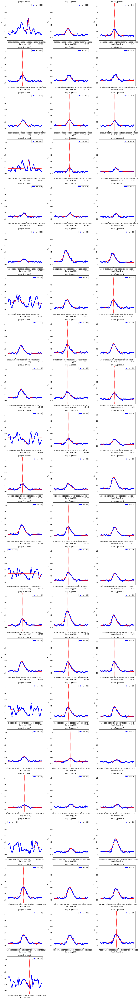

In [34]:
expt_name = 'sequential_Cross_kerr_calibration_with_spectroscopy'

filelist = [15,16,18]

nu_cav = []
offsets = []

fig = plt.figure(figsize=(14,100))
show = 'I'

counter = 0

for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        ts  = datetime.fromtimestamp(os.path.getctime(filename)).strftime('%Y-%m-%d %H:%M:%S')
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_spectroscopy_resolved_qubit_pulse']
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][expt_cfg['mode_index']]
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_r = quantum_device_cfg['readout']['freq']
        amp = expt_cfg['cavity_amp']
        length = expt_cfg['cavity_pulse_len']
        P = array(a[show])
        if i == 15:
            P = P[:16]
        for yy, y in enumerate(P):
            counter += 1
            if expt_cfg['prep_state_before_blockade']:
                print("prep mode index:", swp_cfg['prep_mode_indices'][yy])
                y = -y
            nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_cavities']]['cavity_freqs'][
                swp_cfg['ramsey_mode_indices'][yy]]
            ax = fig.add_subplot(22,3,counter,title= "prep:" + str(swp_cfg['prep_mode_indices'][yy]) + ", probe:" + \
                                str(swp_cfg['ramsey_mode_indices'][yy]))

            df = arange(expt_cfg['start'], expt_cfg['stop'], expt_cfg['step'])[:(len(y))]
            freqs = nu_c + df
            if expt_cfg['prep_state_before_blockade']:
                ax.plot(freqs,-y,'bo-',label = 'a = '+str(amp),linewidth=3)
            else:
                ax.plot(freqs,y,'bo-',label = 'a = '+str(amp),linewidth=3)

            p = fitlor(freqs,-y,showfit=False)
            if expt_cfg['prep_state_before_blockade']:
                plot(freqs, lorfunc(p,freqs),'r-') 
            else:
                plot(freqs, -lorfunc(p,freqs),'r-')
            ax.set_xlabel('Cavity freq (GHz)')
            ax.set_ylabel('$P_0$')
            print("Old cavity freq:", nu_c)
            print ("Resonance frequency = ",p[2])
            print("Offset (MHz):", (p[2] - nu_c)*1e3)
            offsets.append((p[2] - nu_c)*1e3)
            # print ("Width = ",p[3]*1e3,"MHz")
            print ("========================================")
            ax.axvline(p[2],color='r',linestyle='dashed')
            ax.legend()
            nu_cav.append(p[2])

            ax.set_ylim(-0.1,1.1)
fig.tight_layout()

In [38]:
# Cross-Kerr matrix, with rows being the probed mode, columns being the prepared mode
mode_num = 8
cross_kerr_mat = [[] for n in range(mode_num)]
for m in range(mode_num):
    for j in range(mode_num):
        if m == j:
            cross_kerr_mat[m].append(0.0)
        else:
            cross_kerr_mat[m].append(offsets[mode_num*m+j])
print(cross_kerr_mat)

[[0.0, -0.01551921655718047, -0.013591246490030073, -0.011788651479882617, -0.010427891830921965, -0.009989245578267969, -0.00941128762388388, -0.008475331735091629], [-0.012705558210868162, 0.0, -0.007898349561052953, -0.007252173674920925, -0.0054074477331411686, -0.005215514259582221, -0.005463230344560088, -0.005523312905708622], [-0.018050652569989722, -0.01637748000682393, 0.0, -0.014685274904557843, -0.014160084215397717, -0.013765906414775486, -0.01329836572061538, -0.01287213013867472], [-0.013565194023179572, -0.012685521986632864, -0.011110379849021967, 0.0, -0.00915557243708065, -0.009550926186818742, -0.00911901949418592, -0.008878437931514327], [-0.012189261047623745, -0.01104680752384013, -0.010113109179421542, -0.009387222071666201, 0.0, -0.00909246816771514, -0.008365438042723383, -0.00877099274720905], [-0.012606094510481114, -0.012089762709166507, -0.010921593000645657, -0.010402348026516961, -0.009966921924231542, 0.0, -0.009758056165765083, -0.009341782341465432], 

In [39]:
old_cross_kerrs = [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
       [0.0,  0.0,  0.0090018e-3,  0.00754216e-3,  0.00452163e-3, 0.00533406e-3, 0.00518178e-3, 0.00474186e-3, 0.0,  0.0],
       [0.0,  0.0034912e-3,  0.0,  0.00591415e-3,  0.00314074e-3, 0.00505769e-3,  0.00364762e-3,  0.00503617e-3, 0.0, 0.0],
       [0.0,  0.0038638e-3,  0.00321509e-3,  0.0,  0.00502715e-3, 0.00597325e-3,  0.00585677e-3,  0.00483164e-3, 0.0, 0.0],
       [0.0,  0.0038025e-3,  0.00341717e-3,  0.00380751e-3,  0.0, 0.00619418e-3,  0.00759133e-3,  0.00688033e-3, 0.0, 0.0],
       [0.0, -0.00219889e-3,  0.00328157e-3,  0.00391698e-3,  0.00472355e-3, 0.0,  0.00481309e-3,  0.00647606e-3, 0.0, 0.0],
       [0.0, -0.00060157e-3,  0.00388387e-3,  0.00413411e-3,  0.00467884e-3, 0.00444762e-3,  0.0,  0.00723501e-3, 0.0, 0.0],
       [0.0,  0.00350006e-3,  0.00201182e-3,  0.00551634e-3,  0.00474942e-3, 0.00429761e-3,  0.00404497e-3,  0.0, 0.0, 0.0],
       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]

In [ ]:
print(array(cross_kerr_mat) - array(old_cross_kerrs)[1:9, 1:9]*1e3)

In [47]:
import nbextensions

# 04-26-20 Redoing Cross Kerrs but only with single photon prepped with blockade, peaks around 2chi1+2chi2 (no need to fit alpha either)

1
=============== file num =  23  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.18
cavity drive amp: [0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29]
cavity pulse len: 25020
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
81
offset =  -0.06920246336064687
new cavity offset freq (MHz) =  -0.06920246336064687
new cavity freq =  7.508967285277837
offset =  -0.03952059283977327
new cavity offset freq (MHz) =  -0.03952059283977327
new cavity freq =  7.50

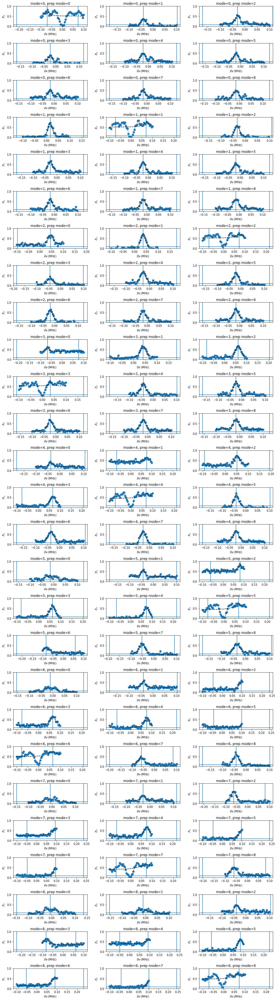

In [54]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [23]

cross_kerr_mat = np.zeros((10, 10))
no_photon_mode_offsets = np.zeros(10)

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,50))
        print(len(P))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(27,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
fig.tight_layout()

1
=============== file num =  44  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.18
cavity pulse len: 25020
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
50
offset =  0.08443155118578796
new cavity offset freq (MHz) =  0.08443155118578796
new cavity freq =  6.727598544485261
1
=============== file num =  45  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.18
cavity pulse len: 25020
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
50
offset =  -0.08135858158169637
new cavity offset freq (MHz) =  -0.08135858158169637
new cavity freq =  6.727432754352493
1
=============== file num =  47  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.18
cavity pulse len: 25020
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
50
offset =  0.0

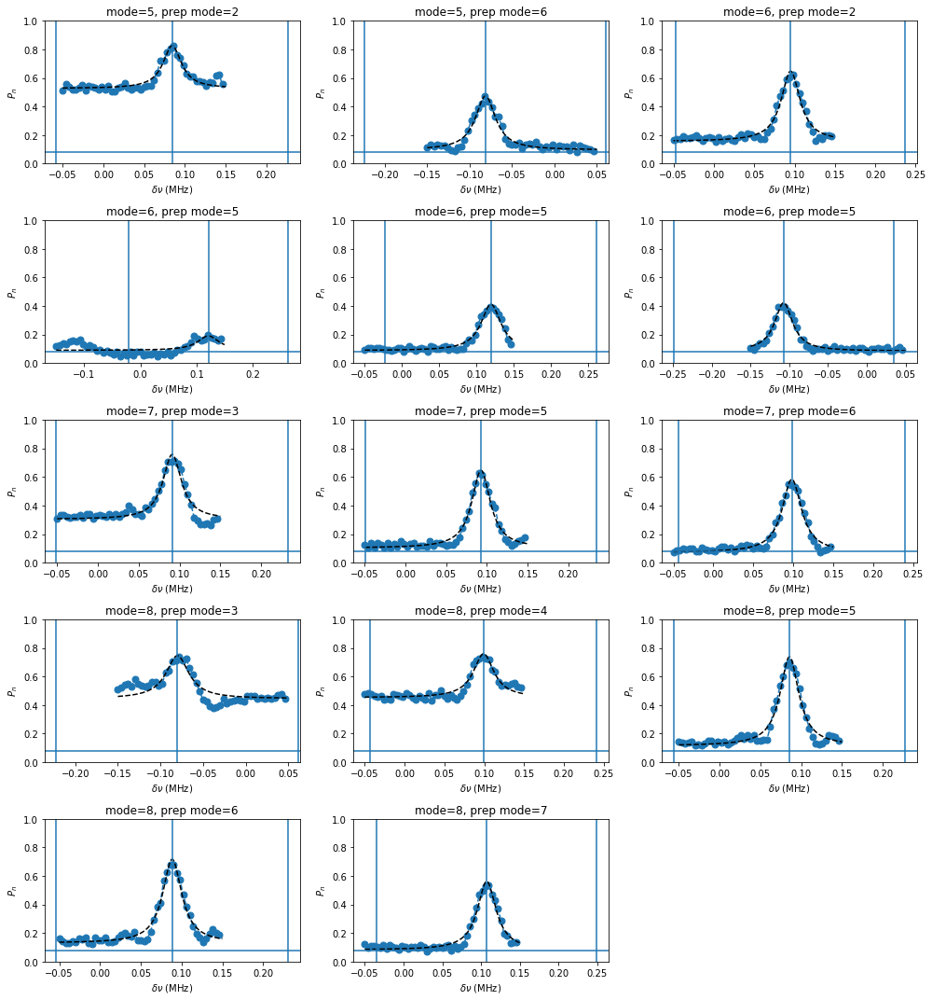

In [55]:
expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [44,45,47,48,50,51,52,53,54,55,57,58,59,60]

show = 'I'
fig = plt.figure(figsize=(14,15))
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        print(len(P))
        for ii, y in enumerate([P]):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,3,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + str(expt_cfg['prep_mode_index']))
            plt.tight_layout()
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                cross_kerr_mat[expt_cfg['mode_index']][expt_cfg['prep_mode_index']] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[expt_cfg['mode_index']]
fig.tight_layout()

In [60]:
from qutip import*

In [62]:
Qobj(cross_kerr_mat[:-1][:-1])

Quantum object: dims = [[8], [10]], shape = (8, 10), type = other
Qobj data =
[[ 0.         -0.0395181  -0.02877364 -0.02309223 -0.02206859 -0.01830843
  -0.01644643 -0.01548717 -0.01378737  0.        ]
 [ 0.01618149  0.         -0.03283496 -0.02751138 -0.02142615 -0.01713308
  -0.01695423 -0.01539147 -0.01331263  0.        ]
 [ 0.04559425  0.03619866  0.         -0.04358791 -0.0267071  -0.02044157
  -0.01870681 -0.01711102 -0.01518575  0.        ]
 [-0.06596487  0.04075196  0.06132024  0.         -0.04106568 -0.02393974
  -0.02314671 -0.01895314 -0.0148402   0.        ]
 [-0.037408    0.07570446  0.05162918  0.06636752  0.         -0.03971775
  -0.03597891 -0.02673084 -0.02125374  0.        ]
 [-0.01459453 -0.04230704  0.08443972  0.06222885  0.07420464  0.
  -0.08135041 -0.05142894 -0.03492229  0.        ]
 [-0.0114171  -0.03916641  0.0950875   0.0665426   0.07686301 -0.1073353
   0.         -0.05812014 -0.041778    0.        ]
 [-0.00724652 -0.02852442 -0.06320693  0.09099535  0.076

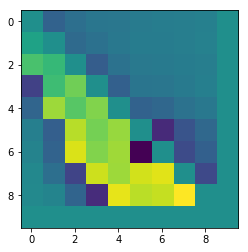

In [58]:
imshow(cross_kerr_mat)

In [63]:
kappas = array([9.02e-6, 5.23e-6, 4.19e-6, 3.24e-6, 1.4e-6, 1.48e-6, 0.72e-6]) * 10**6

## Redoing cross-Kerr with driving coherent state in cavity after prepping (still with blockade) instead of using blockade for 2nd mode

1
=============== file num =  32  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity drive amp: [0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29]
cavity pulse len: 15000
cavity awg scales : [0.42, 0.5, 1, 0.4]
prep state before blockade =  True
1
75
offset =  -0.004433581462113702
new cavity offset freq (MHz) =  -0.004433581462113702
new cavity freq =  7.509032054159736
offset =  -0.016258331438820293
new cavity offset freq (MHz) =  -0.016258331438820293
new cavity freq = 

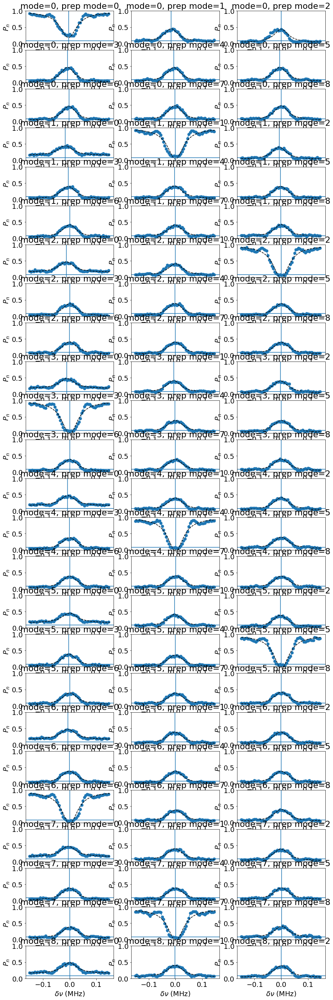

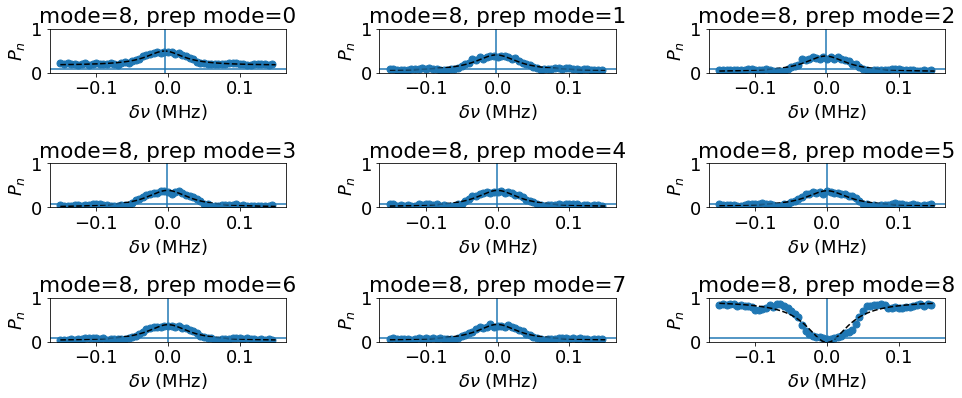

In [28]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [24,25,26,27,28,29,30,31]
filelist = [32,33]

cross_kerr_mat = np.zeros((10, 10))
no_photon_mode_offsets = np.zeros(10)
self_kerrs = np.zeros(10)

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        chis = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        print(expt_cfg['probe_level'])
        P = array(a[show])
        
        # no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,50))
        print(len(P))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(27,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            if swp_cfg['ramsey_mode_indices'][ii] == swp_cfg['prep_mode_indices'][ii]:
                p = fitlor(f,-y,showfit=False)
                plot(ts,-lorfunc(p,ts),'k--')
            else:
                p = fitlor(f,y,showfit=False)
                plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
            #axvline(p[2] - 0.14222370057418157)
            #axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
            else:
                self_kerrs[swp_cfg['ramsey_mode_indices'][ii]] = p[2] + expt_cfg['cavity_offset_freq']*1e3
fig.tight_layout()

# Redoing cross-Kerrs 06-17-20

1
=============== file num =  96  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 25000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
offset =  2.5758857197560097e-06
new cavity offset freq (MHz) =  2.5758857197560097e-06
new cavity freq =  6.223194639091889
1
=============== file num =  97  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 15000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
offset =  -0.0033123769210065767
new cavity offset freq (MHz) =  -0.0033123769210065767
new cavity freq =  6.223191324139083
1
=============== file num =  98  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 15000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
80
offset =  -0.00

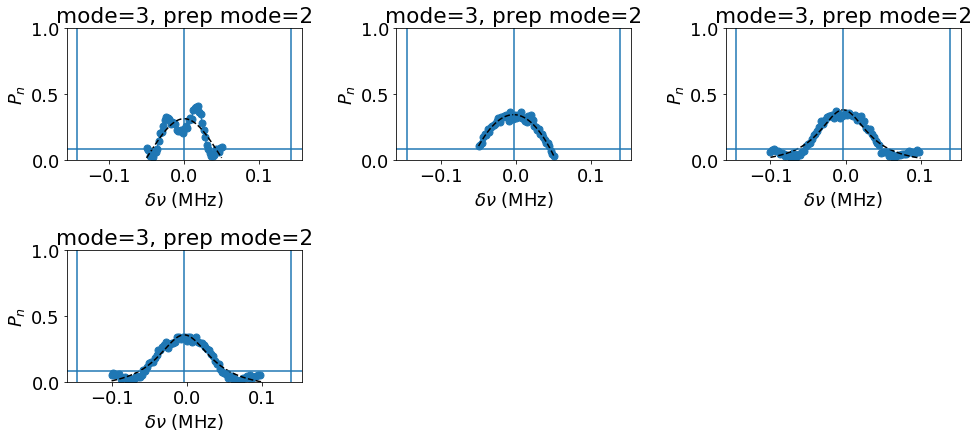

In [29]:
expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [96,97,98,99]

show = 'I'
fig = plt.figure(figsize=(14,15))
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        chis = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        print(len(P))
        for ii, y in enumerate([P]):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,3,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + str(expt_cfg['prep_mode_index']))
            plt.tight_layout()
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
            axvline(p[2] - 0.14222370057418157)
            axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                cross_kerr_mat[expt_cfg['mode_index']][expt_cfg['prep_mode_index']] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[expt_cfg['mode_index']]
fig.tight_layout()

1
=============== file num =  34  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity drive amp: [0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.15, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.13, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.175, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.145, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.51, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29]
cavity pulse len: 14000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
52
offset =  -0.00659804882071405
cavity offset freq from sinc squared (MHz) =  -0.0070012322619209715
cavity offset freq from Lorentzian (MHz) =  -0.00659804882071405
new cavity freq =  6.727507514885254
offset =  -0.01518294462973042

cavity offset freq from sinc squared (MHz) =  0.0016152783533222382
cavity offset freq from Lorentzian (MHz) =  5.421010862427522e-17
new cavity freq =  7.509036487741198
offset =  -0.0736262830064489
cavity offset freq from sinc squared (MHz) =  -0.08049572071124568
cavity offset freq from Lorentzian (MHz) =  -0.0736262830064489
new cavity freq =  7.508962861458191
offset =  0.003490968333094528
cavity offset freq from sinc squared (MHz) =  0.0034896615083587984
cavity offset freq from Lorentzian (MHz) =  0.003490968333094528
new cavity freq =  7.509039978709531
offset =  -0.002108940137997744
cavity offset freq from sinc squared (MHz) =  -0.001936288375888
cavity offset freq from Lorentzian (MHz) =  -0.002108940137997744
new cavity freq =  7.50903437880106
offset =  -5.260417881389731e-13
cavity offset freq from sinc squared (MHz) =  0.00024710787604793313
cavity offset freq from Lorentzian (MHz) =  -5.260417881389731e-13
new cavity freq =  7.509036487741197
offset =  5.4210108624275

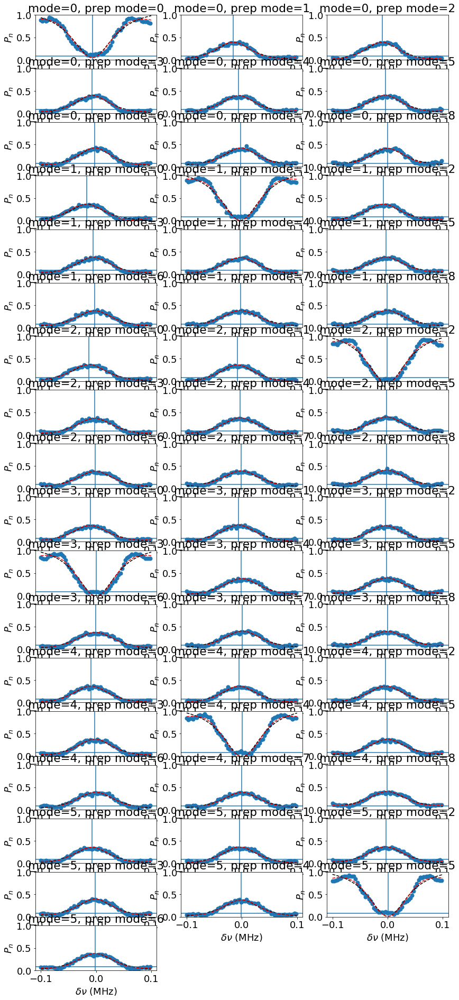

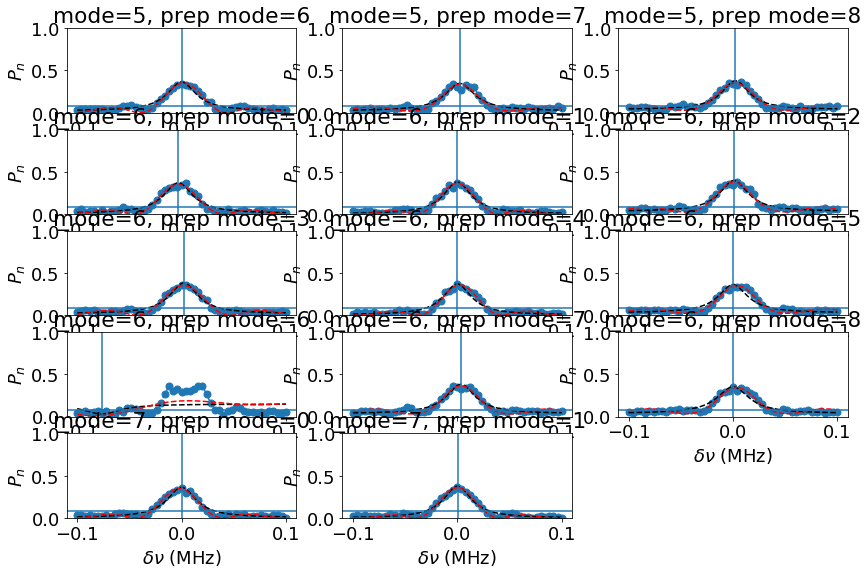

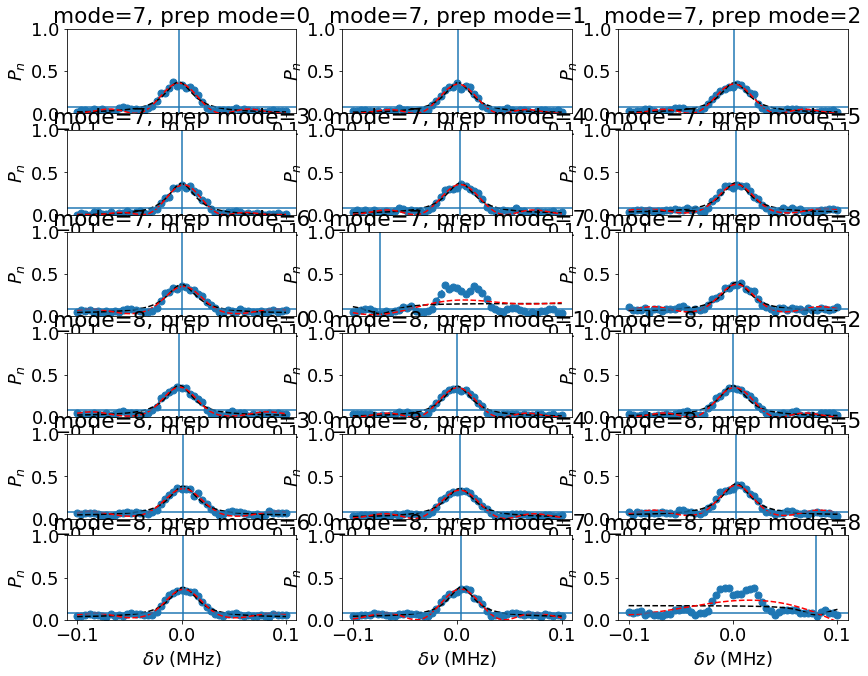

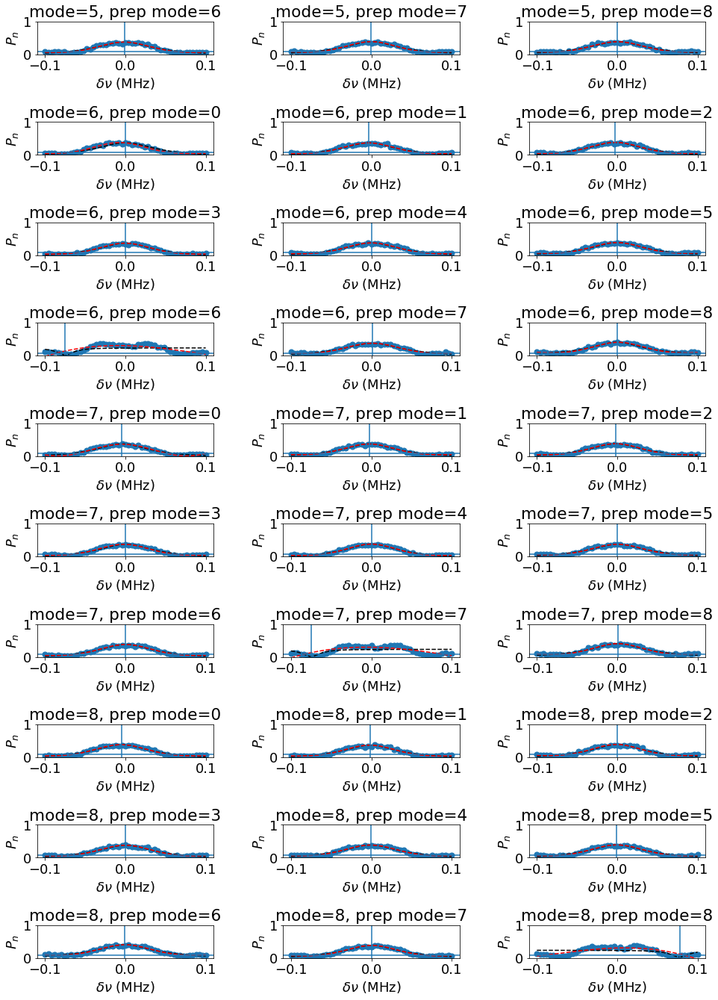

In [40]:
expt_name = 'sequential_cross_kerr_calibration_with_spectroscopy'
filelist = [34,35,36,37]

cross_kerr_mat = np.zeros((10, 10))
no_photon_mode_offsets = np.zeros(10)
self_kerrs = np.zeros(10)

show = 'I'
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        chis = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['chiby2pi_e']
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity drive amp:",swp_cfg['cavity_amps'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        # no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        fig = plt.figure(figsize=(14,50))
        print(len(P))
        for ii, y in enumerate(P):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(27,3,ii+1,title= 'mode=' + 
                     str(swp_cfg['ramsey_mode_indices'][ii]) + ', prep mode=' + str(swp_cfg['prep_mode_indices'][ii]))
            ax.plot(f,y,'o--',markersize=7)
            if swp_cfg['ramsey_mode_indices'][ii] == swp_cfg['prep_mode_indices'][ii]:
                p = fitlor(f,-y,showfit=False)
                s = fitsincfunc_squared(f, 1 - y)
                plot(ts,-lorfunc(p,ts),'k--')
                plot(ts, 1 - sincfunc_squared(s, ts), 'r--')
            else:
                p = fitlor(f,y,showfit=False)
                s = fitsincfunc_squared(f, y)
                plot(ts, lorfunc(p,ts),'k--')
                plot(ts, sincfunc_squared(s, ts), 'r--')
            axvline(p[2])
#             axvline(s[3])
            #axvline(p[2] - 0.14222370057418157)
            #axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("cavity offset freq from sinc squared (MHz) = ", s[3] + expt_cfg['cavity_offset_freq']*1e3)
            print("cavity offset freq from Lorentzian (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if swp_cfg['ramsey_mode_indices'][ii] != swp_cfg['prep_mode_indices'][ii]:
                cross_kerr_mat[swp_cfg['ramsey_mode_indices'][ii]][swp_cfg['prep_mode_indices'][ii]] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 # - no_photon_mode_offsets[swp_cfg['ramsey_mode_indices'][ii]]
            else:
                self_kerrs[swp_cfg['ramsey_mode_indices'][ii]] = p[2] + expt_cfg['cavity_offset_freq']*1e3
fig.tight_layout()

1
=============== file num =  145  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 28000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
offset =  0.00333172802863738
cavity offset freq from sinc squared (MHz) =  0.003120130575258615
cavity offset freq from Lorentzian (MHz) =  0.00333172802863738
new cavity freq =  6.989434042209014
1
=============== file num =  146  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 28000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
offset =  0.002931770040697875
cavity offset freq from sinc squared (MHz) =  0.0030028841254146105
cavity offset freq from Lorentzian (MHz) =  0.002931770040697875
new cavity freq =  6.989433642251027
1
=============== file num =  148  ==========================
use weak drive for dressing: True
use weak driv

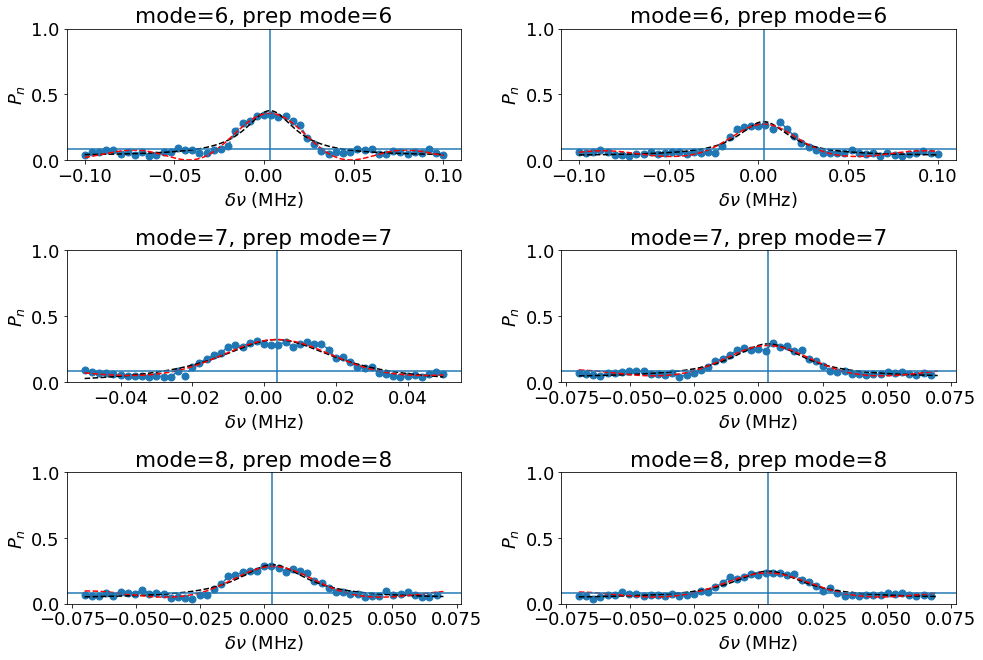

In [41]:
expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [145,146,148,149,150,153]

show = 'I'
fig = plt.figure(figsize=(14,15))
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        chis = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        print(len(P))
        for ii, y in enumerate([P]):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,2,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + str(expt_cfg['prep_mode_index']))
            plt.tight_layout()
            ax.plot(f,y,'o--',markersize=7)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                p = fitlor(f,-y,showfit=False)
                s = fitsincfunc_squared(f, 1 - y)
                plot(ts,-lorfunc(p,ts),'k--')
                plot(ts, 1 - sincfunc_squared(s, ts), 'r--')
            else:
                p = fitlor(f,y,showfit=False)
                s = fitsincfunc_squared(f, y)
                plot(ts, lorfunc(p,ts),'k--')
                plot(ts, sincfunc_squared(s, ts), 'r--')
            axvline(p[2])
#             axvline(s[3])
            #axvline(p[2] - 0.14222370057418157)
            #axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
            print("offset = ", p[2])
            print("cavity offset freq from sinc squared (MHz) = ", s[3] + expt_cfg['cavity_offset_freq']*1e3)
            print("cavity offset freq from Lorentzian (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                cross_kerr_mat[expt_cfg['mode_index']][expt_cfg['prep_mode_index']] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[expt_cfg['mode_index']]
            else:
                self_kerrs[expt_cfg['mode_index']] = p[2] + expt_cfg['cavity_offset_freq']*1e3
fig.tight_layout()

# Checking self-Kerrs with spectroscopy 6-29-20

## Probing n=2 peaks to get Kappa

2
=============== file num =  100  ==========================
use weak drive for dressing: True
use weak drive for probe: True 2
dressing amp: 0.0
cavity pulse len: 28000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
new cavity offset freq (MHz) = 0.0002673353902245613+/-0.0005390435942847104
new cavity freq =  6.223194903851394
2
=============== file num =  103  ==========================
use weak drive for dressing: True
use weak drive for probe: True 2
dressing amp: 0.0
cavity pulse len: 14000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
new cavity offset freq (MHz) = -0.002678200312561302+/-0.000889810844360341
new cavity freq =  6.223191958315692
2
=============== file num =  104  ==========================
use weak drive for dressing: True
use weak drive for probe: True 2
dressing amp: 0.0
cavity pulse len: 28000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  True
51
new cavity offset freq (MHz) = 2.71

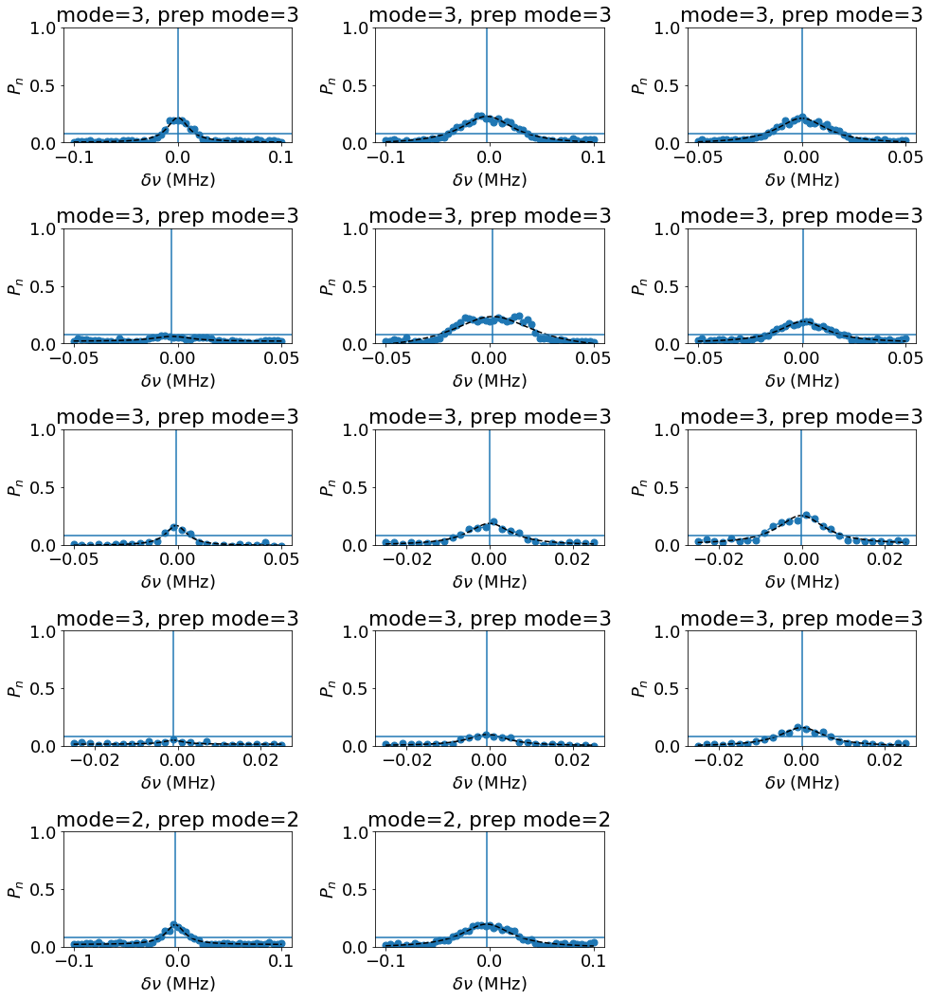

In [32]:
def lorfunc_err(x, a, b, c, d):
    return a + b/(1+(x-c)**2/d**2)


expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [100,103,104,105,106,107,108,109,110,111,112,113,101,102]

show = 'I'
fig = plt.figure(figsize=(14,15))
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        chis = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        print(len(P))
        for ii, y in enumerate([P]):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            ax = fig.add_subplot(5,3,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + str(expt_cfg['prep_mode_index']))
            plt.tight_layout()
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
#             axvline(p[2] - 0.14222370057418157)
#             axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
#             print("offset = ", p[2])
#             print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
#             print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                cross_kerr_mat[expt_cfg['mode_index']][expt_cfg['prep_mode_index']] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[expt_cfg['mode_index']]
        
            # Error bars
            guess = p
            popt, pcov = curve_fit(lorfunc_err, f, y, guess)
            print("new cavity offset freq (MHz) = " + str(p[2] + expt_cfg['cavity_offset_freq']*1e3) + "+/-" 
                  + str(np.sqrt(pcov[2][2])))
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
        
        
fig.tight_layout()

## Checking base cavity frequencies

1
=============== file num =  123  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 56000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  False
51
new cavity offset freq (MHz) = 0.0018657620721669846+/-0.00020160671496632666
new cavity freq =  6.223196502278076
1
=============== file num =  124  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 56000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  False
51
new cavity offset freq (MHz) = 0.002024939913171391+/-0.00015498780718227733
new cavity freq =  6.223196661455917
1
=============== file num =  125  ==========================
use weak drive for dressing: True
use weak drive for probe: True 1
dressing amp: 0.0
cavity pulse len: 56000
cavity awg scales : [1, 0.5, 1, 0.4]
prep state before blockade =  False
51
new cavity offset freq (MHz) =

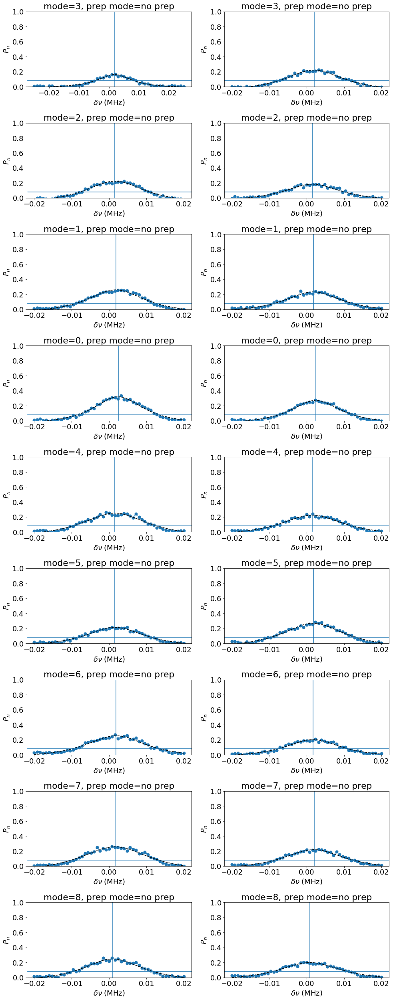

In [33]:
def lorfunc_err(x, a, b, c, d):
    return a + b/(1+(x-c)**2/d**2)


expt_name = 'blockade_experiments_cavity_spectroscopy'
filelist = [117,118,119,120,121,122,123,124]  # all mode 3
filelist = [123,124,125,126,127,128,129,130,131,132,134,135,136,137,138,139,141,142]

cavity_01_freq_corrections = np.zeros(10)

show = 'I'
fig = plt.figure(figsize=(14,35))
for ff,fnum in enumerate(filelist):
    filename = "..\\data\\" + str(fnum).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))["blockade_experiments_cavity_spectroscopy"]
        print (expt_cfg['probe_level'])
        nu_q = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['freq']
        nu_c = quantum_device_cfg['flux_pulse_info'][expt_cfg['on_qubits'][0]]['cavity_freqs'][expt_cfg['mode_index']]
        print ("=============== file num = ",fnum," ==========================")
        print ("use weak drive for dressing:",expt_cfg['use_weak_drive_for_dressing'])
        print ("use weak drive for probe:",expt_cfg['use_weak_drive_for_probe'], expt_cfg['probe_level'])
        print ("dressing amp:",expt_cfg['dressing_amp'])
        print ("cavity pulse len:", expt_cfg['cavity_pulse_len'])
        print ("cavity awg scales :",hardware_cfg['awg_info']['m8195a']['amplitudes'])
        print ("prep state before blockade = ",expt_cfg['prep_state_before_blockade'])
        P = array(a[show])
        
        no_photon_mode_offsets = quantum_device_cfg['blockade_pulse_params']['blockade_cavity_offset_freq']
        chis = quantum_device_cfg['flux_pulse_info']['1']['chiby2pi_e']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        
        f = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:]*1e3
        ts = arange(expt_cfg['start'], expt_cfg['stop'],1e-7)*1e3
        print(len(P))
        
        if ff % 2 == 0:
            temp_freqs = []
        for ii, y in enumerate([P]):
#             ax = fig.add_subplot(5,2,ii+1,title= 'Blockade @ n = '+str(expt_cfg['blockade_levels'])+
#                                  ',probe level = '+str(expt_cfg['probe_level']) + ', mode=' + 
#                                  str(swp_cfg['mode_indices'][ii]))
            if expt_cfg['prep_state_before_blockade']:
                ax = fig.add_subplot(9,2,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + str(expt_cfg['prep_mode_index']))
            else:
                ax = fig.add_subplot(9,2,ff+1,title= 'mode=' + 
                     str(expt_cfg['mode_index']) + ', prep mode=' + 'no prep')
            plt.tight_layout()
            ax.plot(f,y,'o--',markersize=7)
            p = fitlor(f,y,showfit=False)
            plot(ts,lorfunc(p,ts),'k--')
            axvline(p[2])
#             axvline(p[2] - 0.14222370057418157)
#             axvline(p[2] + 0.14222370057418157)
            axhline(0.08)
#             print("offset = ", p[2])
#             print("new cavity offset freq (MHz) = ", p[2] + expt_cfg['cavity_offset_freq']*1e3)
#             print ("new cavity freq = ",nu_c+p[2]*1e-3)
            ax.set_xlabel('$\\delta\\nu$ (MHz)')
            ax.set_ylabel('$P_{n}$')
            ylim(0,1)
            if expt_cfg['mode_index'] != expt_cfg['prep_mode_index']:
                cross_kerr_mat[expt_cfg['mode_index']][expt_cfg['prep_mode_index']] = \
                    p[2] + expt_cfg['cavity_offset_freq']*1e3 - no_photon_mode_offsets[expt_cfg['mode_index']]
        
            # Error bars
            guess = p
            popt, pcov = curve_fit(lorfunc_err, f, y, guess)
            print("new cavity offset freq (MHz) = " + str(p[2] + expt_cfg['cavity_offset_freq']*1e3) + "+/-" 
                  + str(np.sqrt(pcov[2][2])))
            print ("new cavity freq = ",nu_c+p[2]*1e-3)
            temp_freqs.append(p[2])
            
        # add to corrections, hard coded to average 2 freqs per mode index
        if ff % 2 == 1:
            cavity_01_freq_corrections[expt_cfg['mode_index']] = np.mean(temp_freqs)
        
        
fig.tight_layout()

## 7-23-20 Rechecking Base Cavity Frequencies Using Ramsey

0.13 230 2


C:\_Lib\python\slab\dsfit.py:246: RuntimeWarning: overflow encountered in power
  -1. * (x - fitdatax[0]) / p[3]) + p[4]


Original cavity frequency choice = 5.965217875982685 GHz
Oscillation freq =  0.40285130949564596  MHz
Offset freq = -0.0028513094956459373 MHz
Suggested cavity frequency choice = 5.9652150246731885 GHz
T2* = 13587202476925.062 us
0.40285130949564596


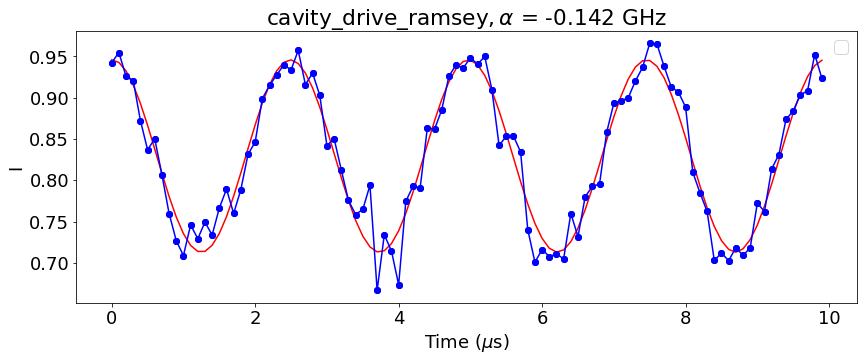

In [59]:
expt_name = 'cavity_drive_ramsey'
filelist = [27]
show = 'I'

cavity_01_freq_corrections_ramsey = np.zeros(10)


for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_amp'], expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])[:(len(P))]/1e3
 
        fig = plt.figure(figsize=(14,5))
        ax = fig.add_subplot(111,title= expt_name+ '$, \\alpha$ = '+ str(around(alpha,3)) + ' GHz')
        
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(show)
        ax.legend()


        p = fitdecaysin(t[1:],P[1:],fitparams = None,showfit=False)
        p = fitdecaysin(t[:],P[:],fitparams = p,showfit=True)
        ax.plot(t,P,'bo-',label = show)
        
        offset = ramsey_freq - p[1]
        alpha_new = nu_c + offset*1e-3
        
        print("Original cavity frequency choice =",nu_c,"GHz")
        print ("Oscillation freq = ",p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested cavity frequency choice =",alpha_new,"GHz")
        print("T2* =",p[3],"us")
        print("=====================================================")
        
        cavity_01_freq_corrections_ramsey[expt_cfg['mode_index']] = p[1]
        
print(cavity_01_freq_corrections_ramsey[expt_cfg['mode_index']])

0.29 230 8


Original cavity frequency choice = 5.460828876273256 GHz
Oscillation freq =  0.4020153679476141  MHz
Offset freq = -0.0020153679476140884 MHz
Suggested cavity frequency choice = 5.460826860905309 GHz
T2* = 820.5142293624186 us


Original cavity frequency choice = 5.716666667384021 GHz
Oscillation freq =  0.4004806305126797  MHz
Offset freq = -0.0004806305126796584 MHz
Suggested cavity frequency choice = 5.716666186753509 GHz
T2* = 286.5423932661179 us


Original cavity frequency choice = 5.965217875982685 GHz
Oscillation freq =  0.4034778365213762  MHz
Offset freq = -0.0034778365213761764 MHz
Suggested cavity frequency choice = 5.965214398146164 GHz
T2* = 10425867.101167493 us


Original cavity frequency choice = 6.223194636516004 GHz
Oscillation freq =  0.40260429812574416  MHz
Offset freq = -0.002604298125744142 MHz
Suggested cavity frequency choice = 6.223192032217878 GHz
T2* = 159.58508896295444 us


Original cavity frequency choice = 6.469132802261203 GHz
Oscillation freq =  0.40112710221552517  MHz
Offset freq = -0.0011271022155251442 MHz
Suggested cavity frequency choice = 6.469131675158988 GHz
T2* = -341526689003.20776 us


Original cavity frequency choice = 6.727514112934075 GHz
Oscillation freq =  0.40324147006774275  MHz
Offset freq = -0.0032414700677427244 MHz
Suggested cavity frequency choice = 6.727510871464007 GHz
T2* = 9838549670976.56 us


Original cavity frequency choice = 6.989430710480986 GHz
Oscillation freq =  0.4022160207265307  MHz
Offset freq = -0.002216020726530654 MHz
Suggested cavity frequency choice = 6.989428494460259 GHz
T2* = 85.90978834237907 us


Original cavity frequency choice = 7.2470435829027195 GHz
Oscillation freq =  0.4022857628019497  MHz
Offset freq = -0.002285762801949698 MHz
Suggested cavity frequency choice = 7.247041297139917 GHz
T2* = 7846116345840.002 us


Original cavity frequency choice = 7.509036487741198 GHz
Oscillation freq =  0.40167416532124817  MHz
Offset freq = -0.0016741653212481444 MHz
Suggested cavity frequency choice = 7.509034813575877 GHz
T2* = 1058.997129912206 us
[-0.00201537 -0.00048063 -0.00347784 -0.0026043  -0.0011271  -0.00324147
 -0.00221602 -0.00228576 -0.00167417  0.        ]
0.29 200 8


Original cavity frequency choice = 5.460828876273256 GHz
Oscillation freq =  0.4042339275006096  MHz
Offset freq = -0.00423392750060958 MHz
Suggested cavity frequency choice = 5.460824642345755 GHz
T2* = 125091749.28542279 us


Original cavity frequency choice = 5.716666667384021 GHz
Oscillation freq =  0.39992543788492185  MHz
Offset freq = 7.456211507816946e-05 MHz
Suggested cavity frequency choice = 5.716666741946136 GHz
T2* = 60.23072718559023 us


Original cavity frequency choice = 5.965217875982685 GHz
Oscillation freq =  0.4046644564439713  MHz
Offset freq = -0.004664456443971288 MHz
Suggested cavity frequency choice = 5.96521321152624 GHz
T2* = 190861698667.7457 us


Original cavity frequency choice = 6.223194636516004 GHz
Oscillation freq =  0.4002571288673493  MHz
Offset freq = -0.00025712886734929885 MHz
Suggested cavity frequency choice = 6.223194379387136 GHz
T2* = 26683902441.575653 us


Original cavity frequency choice = 6.469132802261203 GHz
Oscillation freq =  0.3998219872995392  MHz
Offset freq = 0.00017801270046080564 MHz
Suggested cavity frequency choice = 6.469132980273904 GHz
T2* = 98.0503687019479 us


Original cavity frequency choice = 6.727514112934075 GHz
Oscillation freq =  0.4027364175519423  MHz
Offset freq = -0.0027364175519422607 MHz
Suggested cavity frequency choice = 6.727511376516523 GHz
T2* = 29404047716.712032 us


Original cavity frequency choice = 6.989430710480986 GHz
Oscillation freq =  0.4021061753384664  MHz
Offset freq = -0.002106175338466354 MHz
Suggested cavity frequency choice = 6.9894286043056475 GHz
T2* = 344335643317.7662 us


Original cavity frequency choice = 7.2470435829027195 GHz
Oscillation freq =  0.4042720239323137  MHz
Offset freq = -0.004272023932313684 MHz
Suggested cavity frequency choice = 7.247039310878788 GHz
T2* = 11928181548316.543 us


Original cavity frequency choice = 7.509036487741198 GHz
Oscillation freq =  0.4035927930763585  MHz
Offset freq = -0.003592793076358458 MHz
Suggested cavity frequency choice = 7.509032894948121 GHz
T2* = -371538703.3371167 us
[-4.23392750e-03  7.45621151e-05 -4.66445644e-03 -2.57128867e-04
  1.78012700e-04 -2.73641755e-03 -2.10617534e-03 -4.27202393e-03
 -3.59279308e-03  0.00000000e+00]


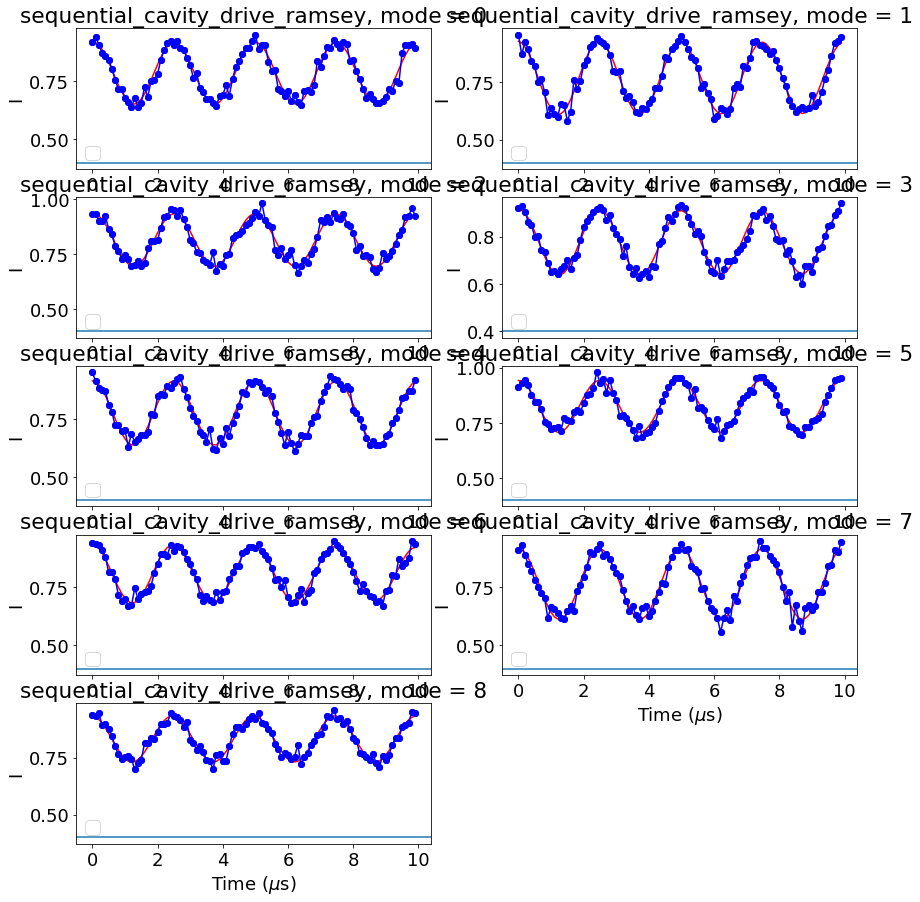

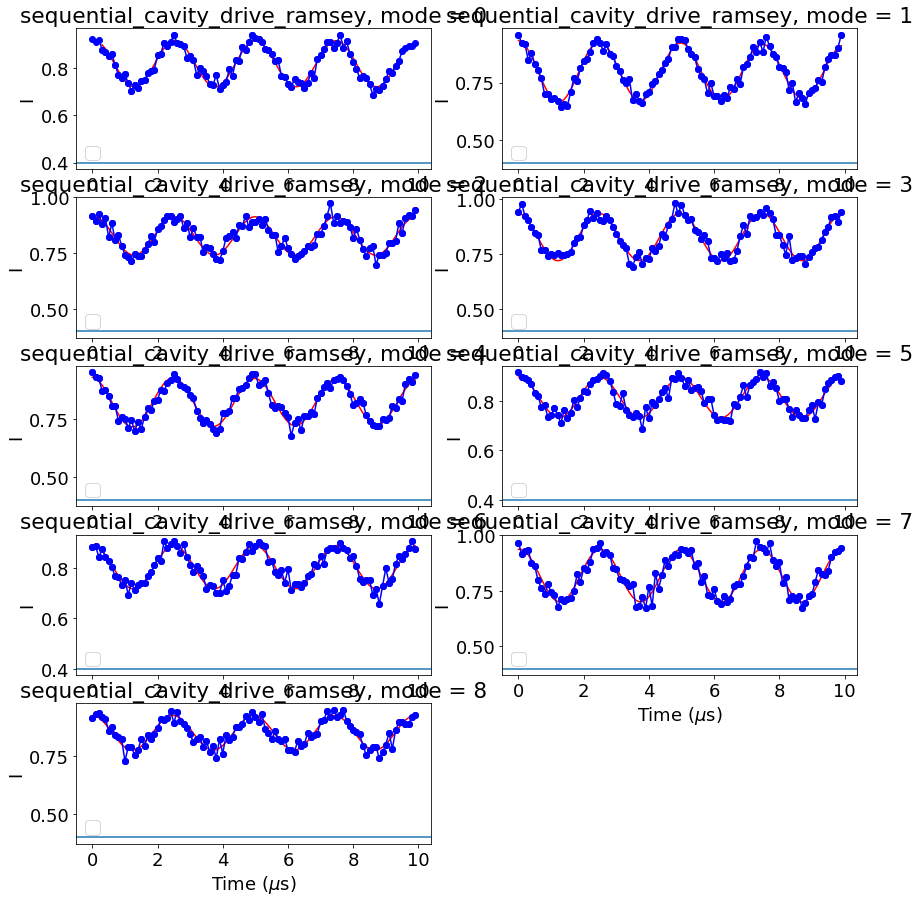

In [75]:
expt_name = 'sequential_cavity_drive_ramsey'
filelist = [5,6]
show = 'I'

offsets = []

cavity_01_freq_corrections_ramsey = np.zeros(10)

for ii,i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        hardware_cfg =  (json.loads(a.attrs['hardware_cfg']))
        experiment_cfg =  (json.loads(a.attrs['experiment_cfg']))
        quantum_device_cfg =  (json.loads(a.attrs['quantum_device_cfg']))
        swp_cfg = (json.loads(a.attrs['experiment_cfg']))[expt_name.lower()]
        expt_cfg = (json.loads(a.attrs['experiment_cfg']))['cavity_drive_ramsey']
        alpha = quantum_device_cfg['qubit'][expt_cfg['on_qubits'][0]]['anharmonicity']
        nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][expt_cfg['mode_index']]
        ramsey_freq = expt_cfg['ramsey_freq']*1e3
        print(expt_cfg['cavity_drive_amp'], expt_cfg['cavity_drive_len'], expt_cfg['mode_index'])
        P = array(a[show]) 
        t = arange(expt_cfg['start'],expt_cfg['stop'],expt_cfg['step'])/1e3
 
        fig = plt.figure(figsize=(14,15))
        for pp, y in enumerate(P):
            ax = fig.add_subplot(5,2,pp+1,title= expt_name+ ', mode = '+ str(swp_cfg['mode_indices'][pp]))
            nu_c = quantum_device_cfg['flux_pulse_info']['1']['cavity_freqs'][swp_cfg['mode_indices'][pp]]
            ax.set_xlabel('Time ($\mu$s)')
            ax.set_ylabel(show)
            ax.legend()
            if (i == 5 and pp == 2):
                p = fitdecaysin(t[5:-3],y[5:-3],fitparams = None,showfit=False)
                p = fitdecaysin(t[1:-2],y[1:-2],fitparams = None,showfit=True)
            elif (i == 6 and pp == 0):
                p = fitdecaysin(t[5:-8],y[5:-8],fitparams = None,showfit=False)
                p = fitdecaysin(t[3:-5],y[3:-5],fitparams = None,showfit=True)
            else:
                p = fitdecaysin(t[1:],y[1:],fitparams = None,showfit=False)
                p = fitdecaysin(t[:],y[:],fitparams = p,showfit=True)
            ax.plot(t,y,'bo-',label = show)

            offset = ramsey_freq - p[1]
            alpha_new = nu_c + offset*1e-3
            offsets.append(offset)
            print("Original cavity frequency choice =",nu_c,"GHz")
            print ("Oscillation freq = ",p[1]," MHz")
            print("Offset freq =", offset,"MHz")
            print("Suggested cavity frequency choice =",alpha_new,"GHz")
            print("T2* =",p[3],"us")
            print("=====================================================")
            ax.axhline(0.4)
            
            cavity_01_freq_corrections_ramsey[swp_cfg['mode_indices'][pp]] = offset
        
    print(cavity_01_freq_corrections_ramsey)

## Correcting cross-Kerrs

In [76]:
print(self_kerrs)
print(cavity_01_freq_corrections)
print(cavity_01_freq_corrections_ramsey)

[-0.00659805 -0.00260637 -0.00144699  0.00011946  0.00058595  0.00062433
  0.00293177  0.00373336  0.00376131  0.        ]
[0.00247276 0.0018133  0.001577   0.00194535 0.00154775 0.00164378
 0.0017859  0.0018236  0.00097268 0.        ]
[-4.23392750e-03  7.45621151e-05 -4.66445644e-03 -2.57128867e-04
  1.78012700e-04 -2.73641755e-03 -2.10617534e-03 -4.27202393e-03
 -3.59279308e-03  0.00000000e+00]


In [77]:
print(cross_kerr_mat)
print(self_kerrs)
print(cavity_01_freq_corrections)

for i in range(len(cross_kerr_mat)):
    cross_kerr_mat[i][i] = 1 * (self_kerrs[i] - cavity_01_freq_corrections[i])

print(cross_kerr_mat)
for i in range(len(cross_kerr_mat)):
    if cross_kerr_mat[i][i] > 0:
        print("mode " + str(i) + " has positive self-kerr " + str(cross_kerr_mat[i][i]))

# ramsey
for i in range(len(cross_kerr_mat)):
    cross_kerr_mat[i][i] = 1 * (self_kerrs[i] + cavity_01_freq_corrections_ramsey[i])

# correct rest of cross-Kerr matrix, not just self-Kerr
for i in range(len(cross_kerr_mat)):
    for j in range(len(cross_kerr_mat)):
        if i != j:
            cross_kerr_mat[i][j] += cavity_01_freq_corrections_ramsey[i]
    
print(cross_kerr_mat)
for i in range(len(cross_kerr_mat)):
    if cross_kerr_mat[i][i] > 0:
        print("mode " + str(i) + " has positive self-kerr " + str(cross_kerr_mat[i][i]))

[[-8.61341677e-03 -1.51829446e-02 -9.86308368e-03 -6.82850597e-03
  -5.75976422e-03 -4.30746077e-03 -2.12926990e-03 -1.81942175e-03
  -1.31247087e-04  0.00000000e+00]
 [-1.65861415e-02 -3.08699952e-03 -7.49623180e-03 -4.97479872e-03
  -2.68456273e-03 -2.51880890e-03 -2.90643754e-03 -2.23580822e-03
  -6.99995084e-04  0.00000000e+00]
 [-1.29062194e-02 -8.20172751e-03 -4.92482399e-03 -2.68513905e-03
  -3.24270986e-03 -1.90950773e-03 -1.40891729e-03 -1.46115602e-03
  -1.85856201e-03  0.00000000e+00]
 [-1.02670844e-02 -6.36472920e-03 -3.54361136e-03 -2.48484167e-03
  -8.53162145e-04 -1.67851625e-03 -8.53504081e-04  7.71882934e-04
  -3.49017115e-04  0.00000000e+00]
 [-8.79604808e-03 -4.71937074e-03 -3.47795177e-03 -2.42011446e-03
  -5.41150237e-04 -8.82286633e-04 -9.92993037e-04 -3.94208577e-04
  -8.21804203e-04  0.00000000e+00]
 [-7.55084464e-03 -3.79360254e-03 -3.25639907e-03 -1.96024501e-03
  -1.02751368e-03 -2.61713703e-03 -1.33445129e-03 -3.08908843e-04
   3.33491835e-04  0.00000000e+00

In [35]:
theoretical_cross_kerr_mat = np.zeros((10,10))
for i in range(10):
    for j in range(10):
#         if i != j:
        theoretical_cross_kerr_mat[i][j] = 2 * chis[i] * chis[j] / alpha * 1e3
# print(theoretical_cross_kerr_mat)
Qobj(theoretical_cross_kerr_mat)

Quantum object: dims = [[10], [10]], shape = (10, 10), type = oper, isherm = True
Qobj data =
[[-0.02014391 -0.01460958 -0.01124885 -0.00956344 -0.00787662 -0.00626049
  -0.0060427  -0.00526551 -0.00456984 -0.00464383]
 [-0.01460958 -0.01059576 -0.00815835 -0.00693599 -0.0057126  -0.00454048
  -0.00438253 -0.00381887 -0.00331432 -0.00336799]
 [-0.01124885 -0.00815835 -0.00628164 -0.00534046 -0.0043985  -0.00349601
  -0.00337439 -0.00294039 -0.00255191 -0.00259323]
 [-0.00956344 -0.00693599 -0.00534046 -0.0045403  -0.00373947 -0.0029722
  -0.00286881 -0.00249983 -0.00216956 -0.00220468]
 [-0.00787662 -0.0057126  -0.0043985  -0.00373947 -0.00307989 -0.00244796
  -0.0023628  -0.00205891 -0.00178689 -0.00181582]
 [-0.00626049 -0.00454048 -0.00349601 -0.0029722  -0.00244796 -0.00194568
  -0.001878   -0.00163646 -0.00142025 -0.00144325]
 [-0.0060427  -0.00438253 -0.00337439 -0.00286881 -0.0023628  -0.001878
  -0.00181267 -0.00157953 -0.00137084 -0.00139304]
 [-0.00526551 -0.00381887 -0.00294

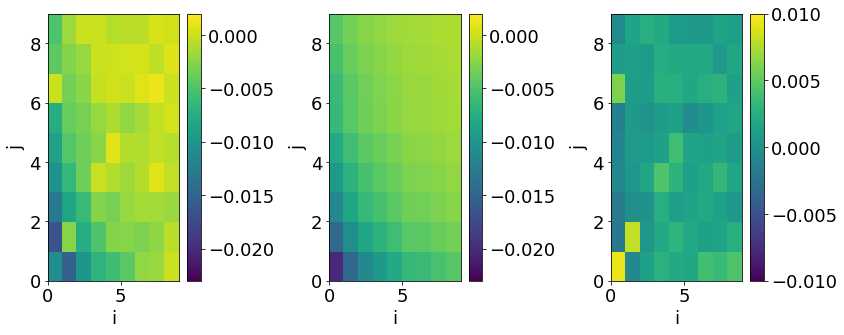

In [78]:
modes = np.arange(10)
fig = plt.figure(figsize = (12,5))
ax = fig.add_subplot(131)
pcolormesh(modes,modes,cross_kerr_mat, vmin=-0.023, vmax=0.002)
colorbar()
ax.set_xlabel('i')
ax.set_ylabel('j')
ax = fig.add_subplot(132)
pcolormesh(modes,modes,theoretical_cross_kerr_mat, vmin=-0.023, vmax=0.002)
ax.set_xlabel('i')
ax.set_ylabel('j')
colorbar()
ax = fig.add_subplot(133)
pcolormesh(modes,modes, cross_kerr_mat - theoretical_cross_kerr_mat, vmin=-0.01, vmax=0.01)
ax.set_xlabel('i')
ax.set_ylabel('j')
colorbar()

plt.tight_layout()